# Parkinsons Dataset

In [9]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier, export_graphviz, export_text, plot_tree
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score
from sklearn import metrics
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import seaborn as sns
import numpy as np
from sklearn.inspection import plot_partial_dependence
from sklearn.inspection import partial_dependence, plot_partial_dependence
from sklearn.inspection import permutation_importance
import shap
from pdpbox import pdp
from PyALE import ale

Load the dataset

In [2]:
# Specify the file path
file_path = "parkinsons.data"  

# Read the CSV file into a DataFrame
df = pd.read_csv(file_path)
df.describe()

,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),...,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
count,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,...,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000
mean,154.228641,197.104918,116.324631,0.006220,0.000044,0.003306,0.003446,0.009920,0.029709,0.282251,...,0.046993,0.024847,21.885974,0.753846,0.498536,0.718099,-5.684397,0.226510,2.381826,0.206552
std,41.390065,91.491548,43.521413,0.004848,0.000035,0.002968,0.002759,0.008903,0.018857,0.194877,...,0.030459,0.040418,4.425764,0.431878,0.103942,0.055336,1.090208,0.083406,0.382799,0.090119
min,88.333000,102.145000,65.476000,0.001680,0.000007,0.000680,0.000920,0.002040,0.009540,0.085000,...,0.013640,0.000650,8.441000,0.000000,0.256570,0.574282,-7.964984,0.006274,1.423287,0.044539
25%,117.572000,134.862500,84.291000,0.003460,0.000020,0.001660,0.001860,0.004985,0.016505,0.148500,...,0.024735,0.005925,19.198000,1.000000,0.421306,0.674758,-6.450096,0.174351,2.099125,0.137451
50%,148.790000,175.829000,104.315000,0.004940,0.000030,0.002500,0.002690,0.007490,0.022970,0.221000,...,0.038360,0.011660,22.085000,1.000000,0.495954,0.722254,-5.720868,0.218885,2.361532,0.194052
75%,182.769000,224.205500,140.018500,0.007365,0.000060,0.003835,0.003955,0.011505,0.037885,0.350000,...,0.060795,0.025640,25.075500,1.000000,0.587562,0.761881,-5.046192,0.279234,2.636456,0.252980
max,260.105000,592.030000,239.170000,0.033160,0.000260,0.021440,0.019580,0.064330,0.119080,1.302000,...,0.169420,0.314820,33.047000,1.000000,0.685151,0.825288,-2.434031,0.450493,3.671155,0.527367


In [6]:
# URL:
#df = pd.read_csv("https://archive.ics.uci.edu/ml/machine-learning-databases/parkinsons/parkinsons.data")
#df.describe()

# Decision Tree

In [7]:
# Split the dataset into features and target variable
X_dt = df.drop(['name','status'], axis=1) 
y_dt = df['status']

# Split the dataset into training and testing sets
X_train_dt, X_test_dt, y_train_dt, y_test_dt = train_test_split(X_dt, y_dt, test_size=0.2, random_state=42)

# Create a decision tree classifier
clf_dt = DecisionTreeClassifier(random_state=42)
clf_dt.fit(X_train_dt, y_train_dt)
y_pred_dt = clf_dt.predict(X_test_dt)

# Model Accuracy
accuracy_score_dt= metrics.accuracy_score(y_test_dt, y_pred_dt)
print('accuracy score is', str('{:04.2f}'.format(accuracy_score_dt*100))+'%')

accuracy score is 92.31%


## Decision Rules 

Plot the decision tree

In [13]:
# Generate a text representation of the decision tree
tree_rules = export_text(clf_dt, feature_names=list(X_dt.columns))

print(tree_rules)

|--- PPE <= 0.13
|   |--- MDVP:Fo(Hz) <= 192.27
|   |   |--- HNR <= 25.55
|   |   |   |--- MDVP:Flo(Hz) <= 125.97
|   |   |   |   |--- class: 0
|   |   |   |--- MDVP:Flo(Hz) >  125.97
|   |   |   |   |--- class: 1
|   |   |--- HNR >  25.55
|   |   |   |--- class: 1
|   |--- MDVP:Fo(Hz) >  192.27
|   |   |--- D2 <= 2.72
|   |   |   |--- class: 0
|   |   |--- D2 >  2.72
|   |   |   |--- class: 1
|--- PPE >  0.13
|   |--- MDVP:RAP <= 0.00
|   |   |--- MDVP:Fo(Hz) <= 117.99
|   |   |   |--- RPDE <= 0.61
|   |   |   |   |--- class: 0
|   |   |   |--- RPDE >  0.61
|   |   |   |   |--- class: 1
|   |   |--- MDVP:Fo(Hz) >  117.99
|   |   |   |--- spread1 <= -6.69
|   |   |   |   |--- class: 0
|   |   |   |--- spread1 >  -6.69
|   |   |   |   |--- class: 1
|   |--- MDVP:RAP >  0.00
|   |   |--- MDVP:Fo(Hz) <= 208.80
|   |   |   |--- class: 1
|   |   |--- MDVP:Fo(Hz) >  208.80
|   |   |   |--- class: 0



## Tree Visualization 

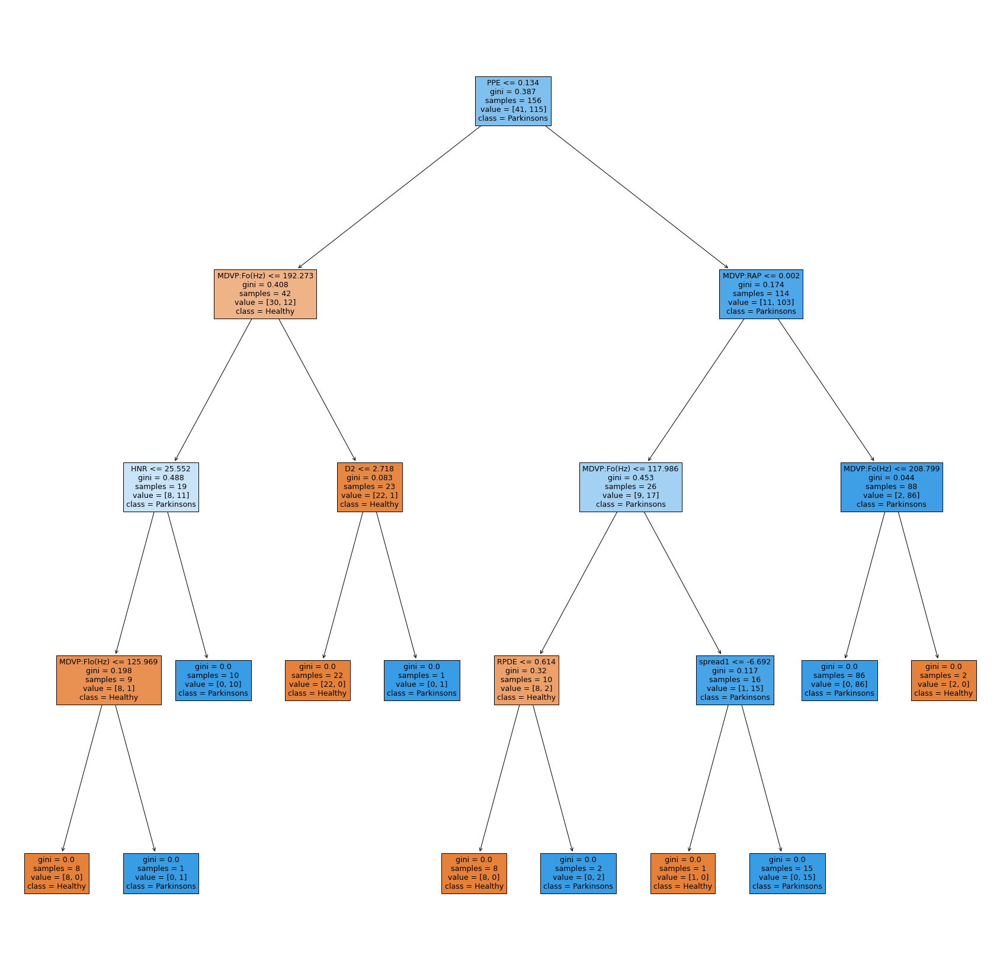

In [14]:
# Plot the decision tree
fig, ax = plt.subplots(figsize=(30, 30))
plot_tree(clf_dt, ax=ax, feature_names=X_dt.columns, class_names=['Healthy', 'Parkinsons'], filled=True)
plt.show()

## Gini Importance (Model-Specific Methods)

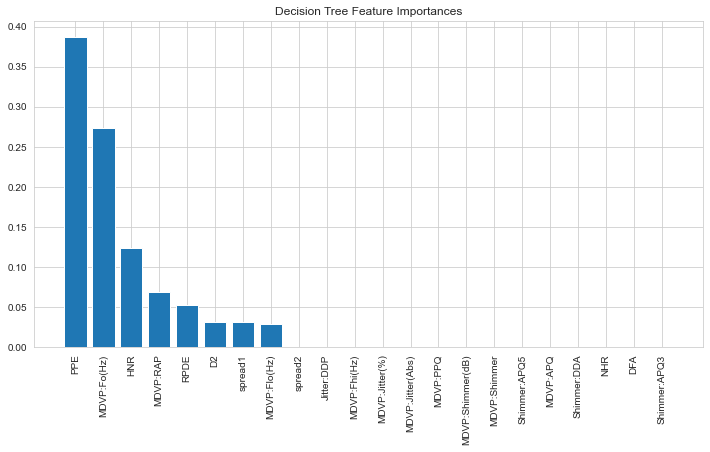

In [15]:
feature_importances_dt = clf_dt.feature_importances_
indices_dt = feature_importances_dt.argsort()[::-1]
feature_names_dt = X_dt.columns[indices_dt]

sns.set_style("whitegrid")
plt.figure(figsize=(12, 6))
plt.title("Decision Tree Feature Importances")
plt.bar(range(X_dt.shape[1]), feature_importances_dt[indices_dt])
plt.xticks(range(X_dt.shape[1]), feature_names_dt, rotation=90)
plt.show()

In [16]:
# Print feature importance values and corresponding feature names
for i in range(X_dt.shape[1]):
    print(f"{feature_names_dt[i]}: {feature_importances_dt[indices_dt[i]]}")


PPE: 0.3875792344062701
MDVP:Fo(Hz): 0.2741162759190088
HNR: 0.12383025432084986
MDVP:RAP: 0.06946170980328488
RPDE: 0.0529374337221633
D2: 0.03164737885564112
spread1: 0.031018027571580065
MDVP:Flo(Hz): 0.029409685401201837
spread2: 0.0
Jitter:DDP: 0.0
MDVP:Fhi(Hz): 0.0
MDVP:Jitter(%): 0.0
MDVP:Jitter(Abs): 0.0
MDVP:PPQ: 0.0
MDVP:Shimmer(dB): 0.0
MDVP:Shimmer: 0.0
Shimmer:APQ5: 0.0
MDVP:APQ: 0.0
Shimmer:DDA: 0.0
NHR: 0.0
DFA: 0.0
Shimmer:APQ3: 0.0


## Permutation importance 

MDVP:Fo(Hz): 0.1462
PPE: 0.1000
MDVP:RAP: 0.0487
D2: 0.0128
spread1: 0.0128
RPDE: 0.0051
HNR: 0.0026
MDVP:Flo(Hz): 0.0026
spread2: 0.0000
Jitter:DDP: 0.0000
MDVP:Fhi(Hz): 0.0000
MDVP:Jitter(%): 0.0000
MDVP:Jitter(Abs): 0.0000
MDVP:PPQ: 0.0000
MDVP:Shimmer(dB): 0.0000
MDVP:Shimmer: 0.0000
Shimmer:APQ5: 0.0000
MDVP:APQ: 0.0000
Shimmer:DDA: 0.0000
NHR: 0.0000
DFA: 0.0000
Shimmer:APQ3: 0.0000


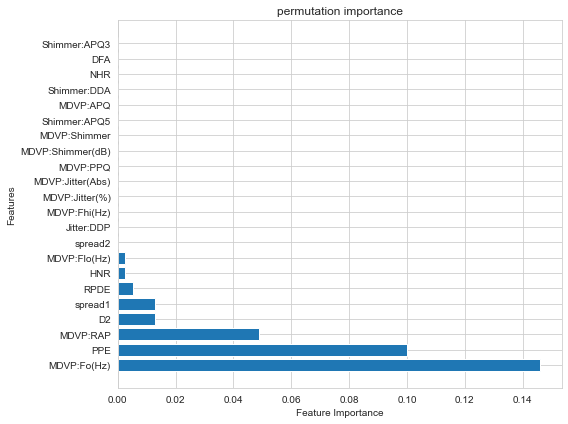

In [17]:
# Perform permutation importance
result_dt = permutation_importance(clf_dt, X_test_dt, y_test_dt, n_repeats=10, random_state=42)

# Get feature importance scores
importance_scores_dt = result_dt.importances_mean

# Sort features by importance score in descending order
sorted_indices_dt = np.argsort(importance_scores_dt)[::-1]
sorted_features_dt = X_dt.columns[sorted_indices_dt]
sorted_scores_dt = importance_scores_dt[sorted_indices_dt]

# Print feature importance
for feature_dt, score_dt in zip(sorted_features_dt, sorted_scores_dt):
    print("{}: {:.4f}".format(feature_dt, score_dt))

# Plot feature importance
plt.figure(figsize=(8, 6))
plt.barh(sorted_features_dt, sorted_scores_dt)
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.title('permutation importance')
plt.tight_layout()
plt.show()

## SHAP 

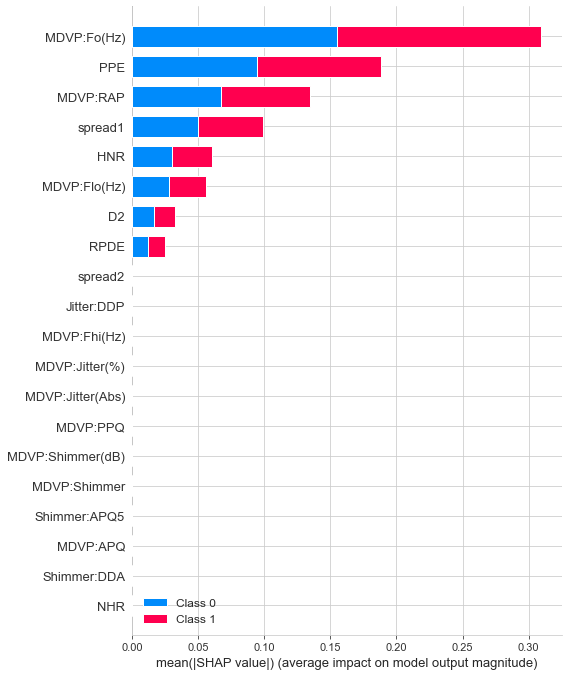

In [33]:
# Create an explainer object for the decision tree classifier
explainer_dt = shap.TreeExplainer(clf_dt,X_train_dt)

# Calculate SHAP values for all features
shap_values_dt = explainer_dt.shap_values(X_test_dt)

# Plot the SHAP summary plot
shap.summary_plot(shap_values_dt, X_test_dt, plot_type='bar')


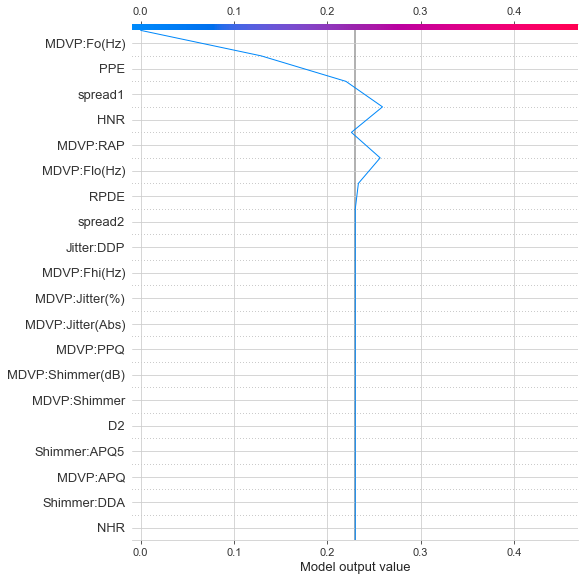

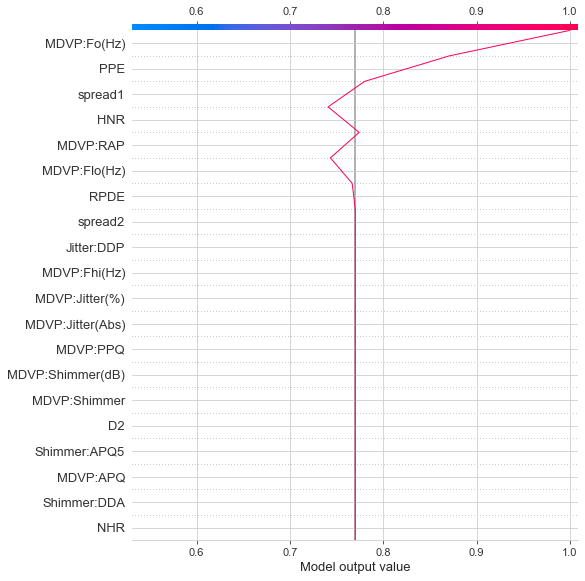

In [64]:
np.random.seed(36)


# Select the instance for generating the explanation
i_dt = 27
data_for_prediction_dt = X_test_dt.iloc[i_dt, :]

# Generate SHAP values for the instance
shap_values_dt_local = explainer_dt.shap_values(data_for_prediction_dt)

# Set the class index for negative prediction
class_index_dt = 0  

# Access the expected value for the negative class
expected_value_negative_dt = explainer_dt.expected_value[class_index_dt]

# Access the SHAP values 
shap_values_negative_dt = shap_values_dt_local[class_index_dt]

# Initialize the JS 
shap.initjs()
shap.decision_plot(expected_value_negative_dt, shap_values_negative_dt, feature_names=X_test_dt.columns.tolist())





# Do the same for the positive class
class_index_dt = 1  
expected_value_positive_dt = explainer_dt.expected_value[class_index_dt]
shap_values_positive_dt = shap_values_dt_local[class_index_dt]
shap.initjs()

# Create the decision plot 
shap.decision_plot(expected_value_positive_dt, shap_values_positive_dt, feature_names=X_test_dt.columns.tolist())

## ALE 

                  eff  size
MDVP:Fo(Hz)                
95.056       0.307692   0.0
100.960      0.307692   2.0
102.273      0.307692   1.0
109.860      0.307692   1.0
110.707      0.307692   1.0
110.739      0.307692   1.0
112.014      0.307692   1.0
112.239      0.307692   1.0
116.848      0.307692   1.0
117.870      0.307692   1.0
121.345      0.307692   1.0
126.144      0.307692   1.0
128.451      0.307692   1.0
136.969      0.307692   1.0
140.341      0.307692   1.0
142.167      0.307692   1.0
143.533      0.307692   1.0
144.188      0.307692   1.0
148.090      0.307692   1.0
151.872      0.307692   1.0
152.125      0.307692   1.0
153.046      0.307692   1.0
156.405      0.307692   1.0
159.116      0.307692   1.0
163.656      0.307692   1.0
166.888      0.307692   1.0
170.756      0.307692   1.0
174.688      0.307692   1.0
178.285      0.307692   1.0
182.018      0.307692   1.0
197.076     -0.692308   1.0
197.569     -0.692308   1.0
202.544     -0.692308   1.0
204.664     -0.69230

PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Con

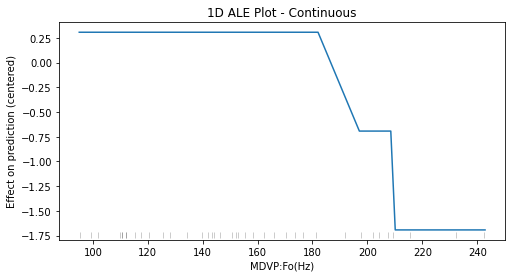

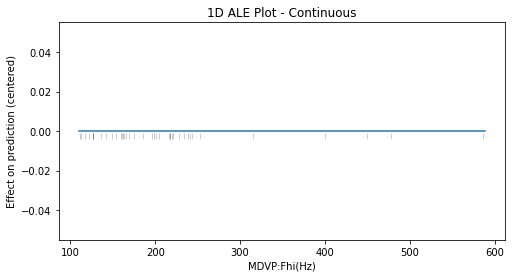

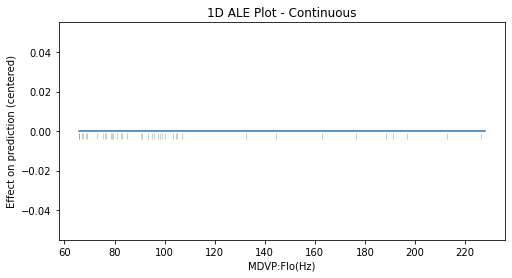

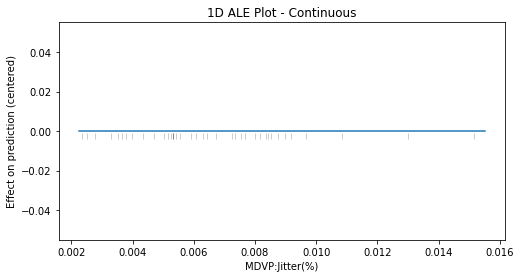

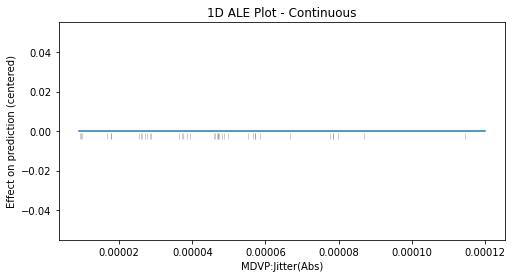

...

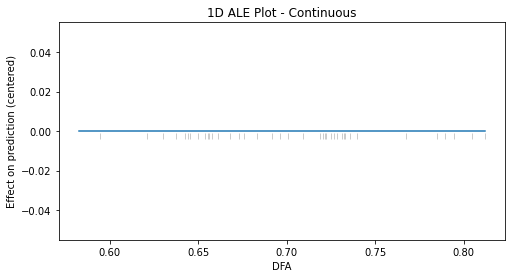

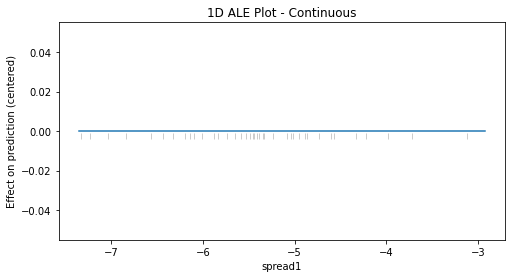

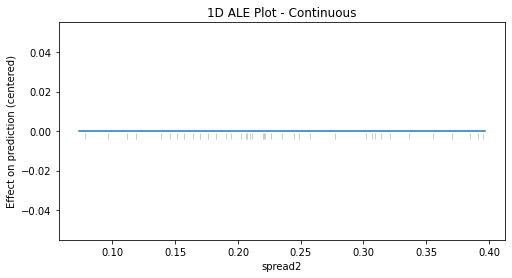

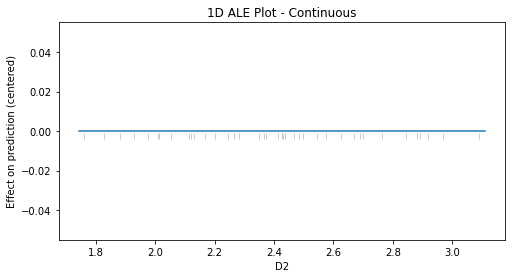

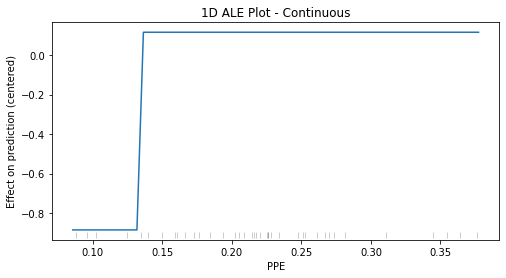

In [10]:
for feature in X_test_dt.columns:
    ale_eff_dt = ale(X=X_test_dt, model=clf_dt, feature=[feature], grid_size=50, include_CI=False)
    print(ale_eff_dt)

## PDP

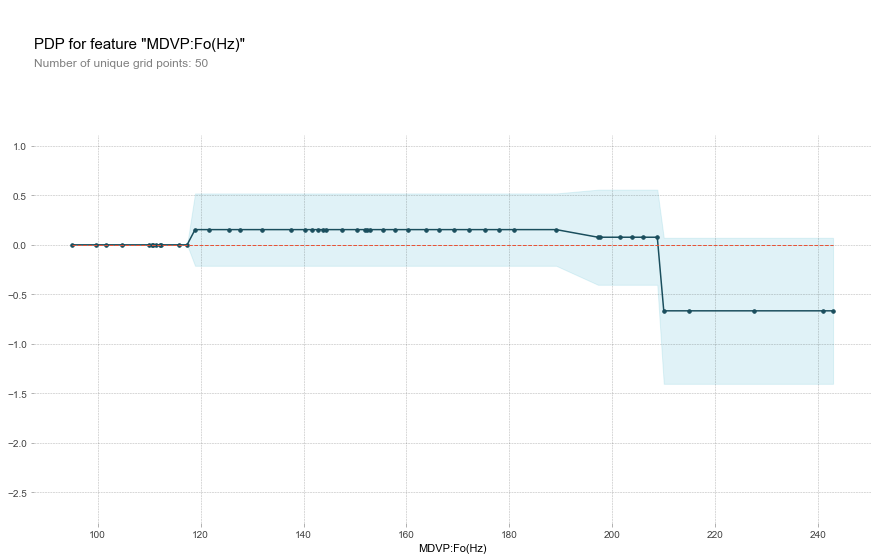

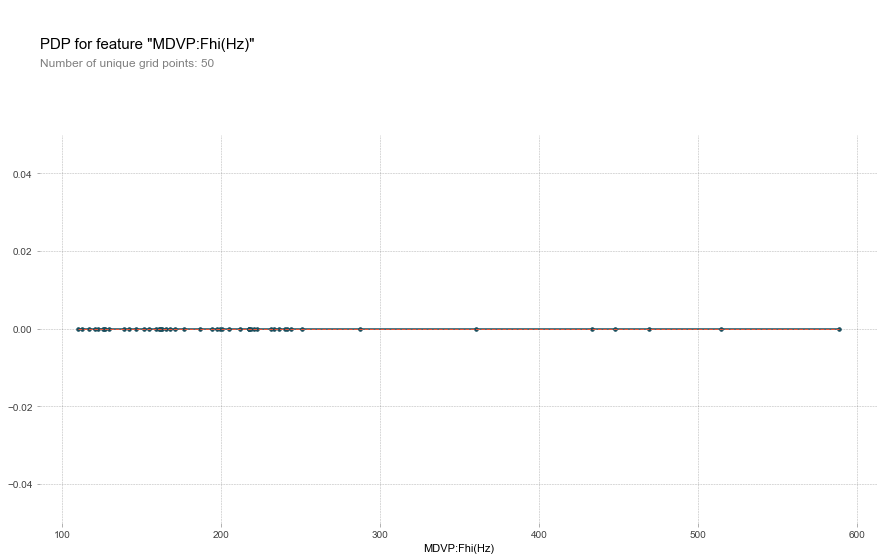

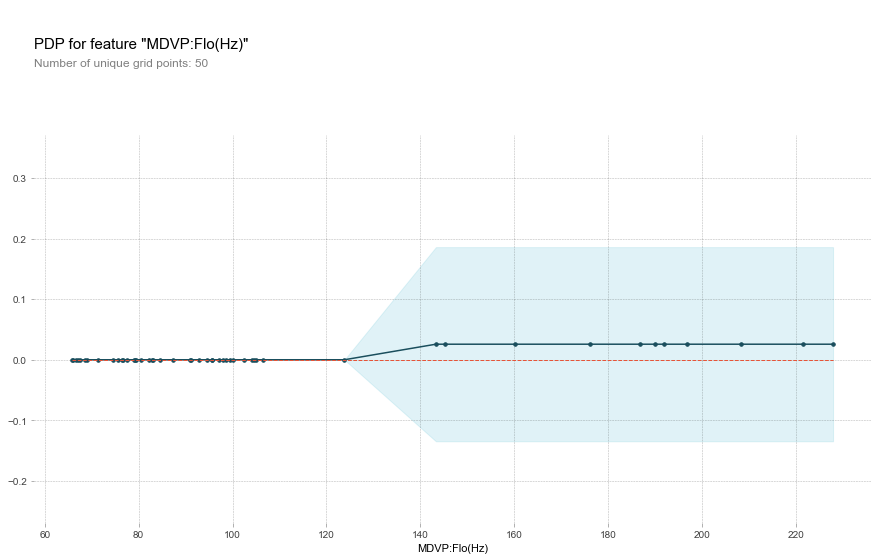

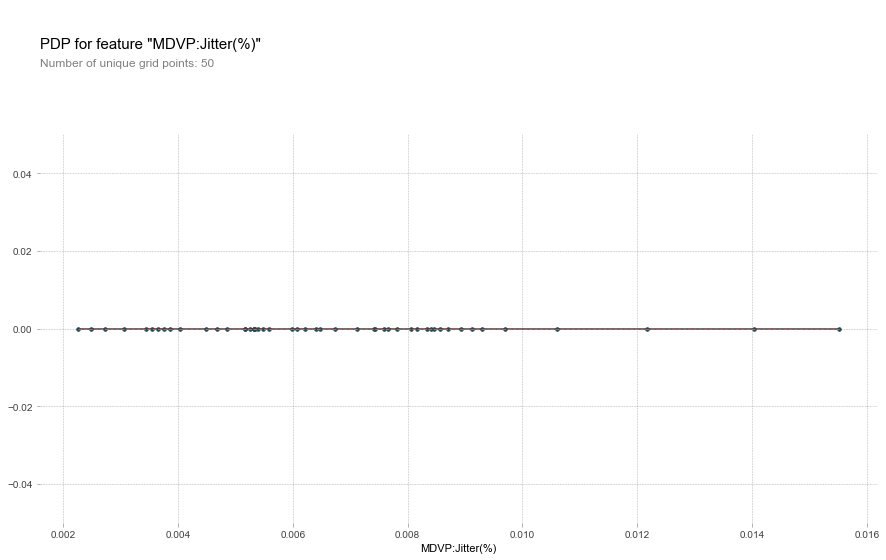

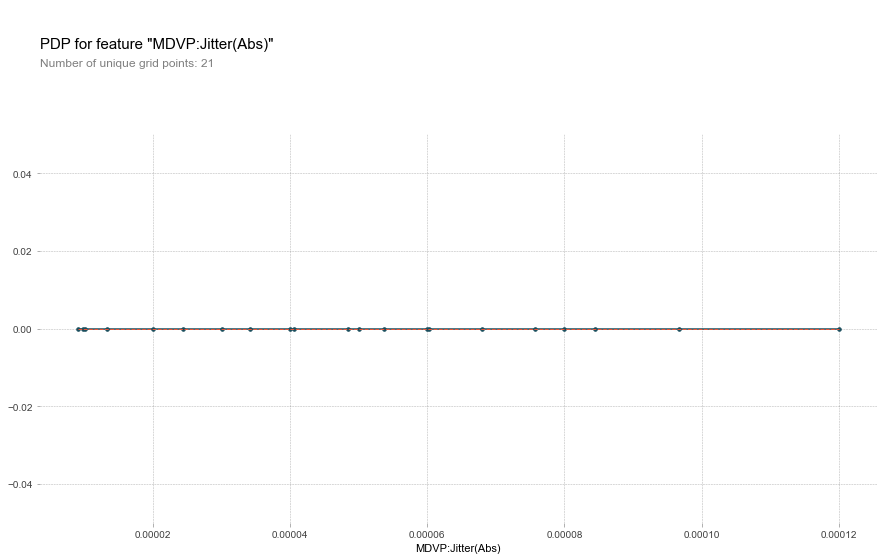

...

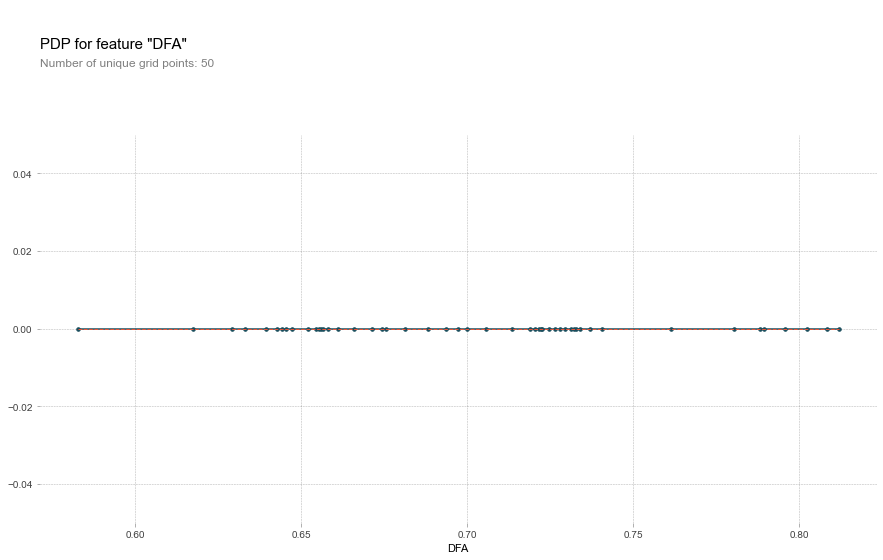

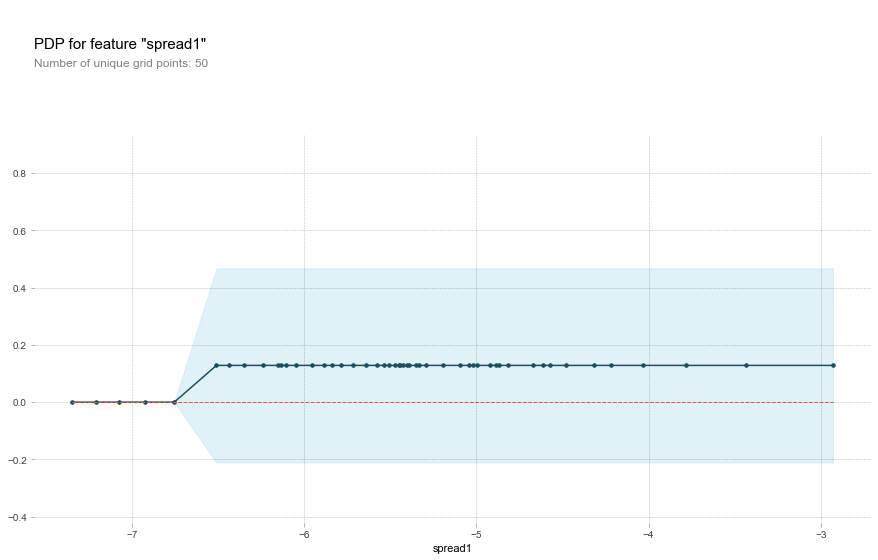

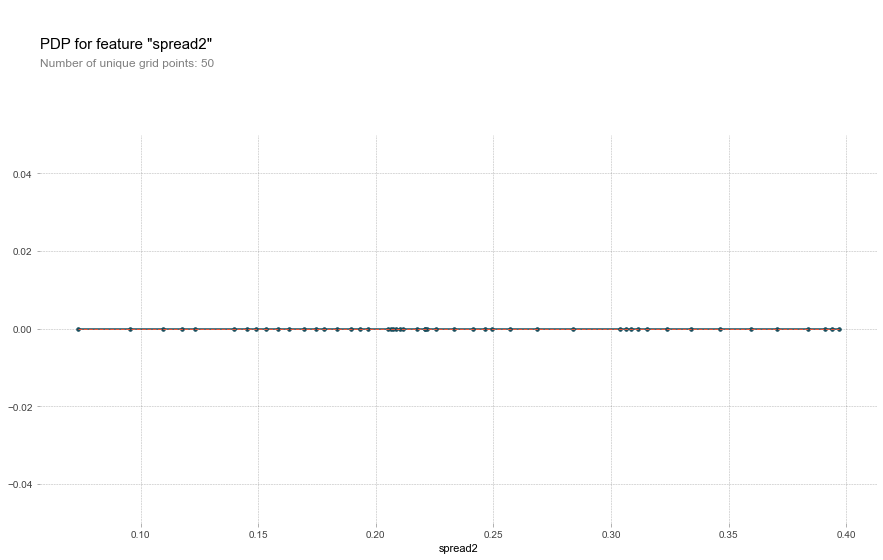

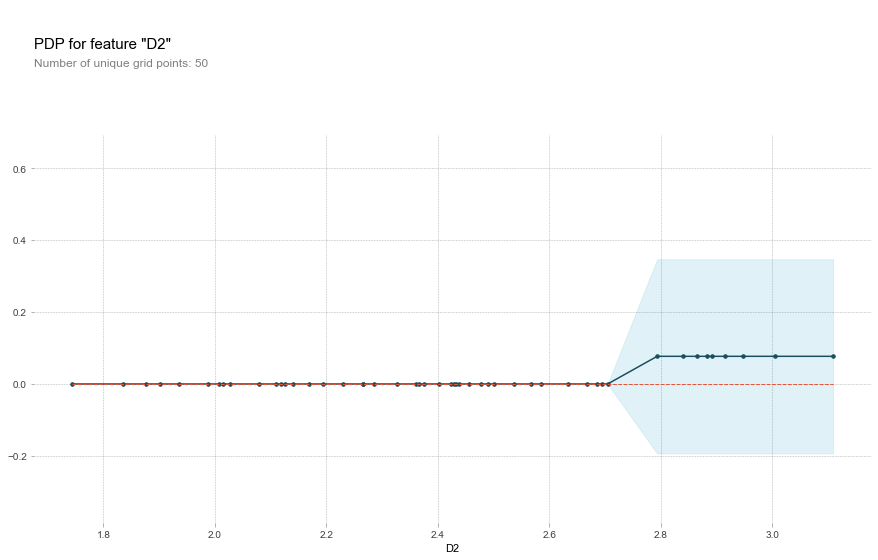

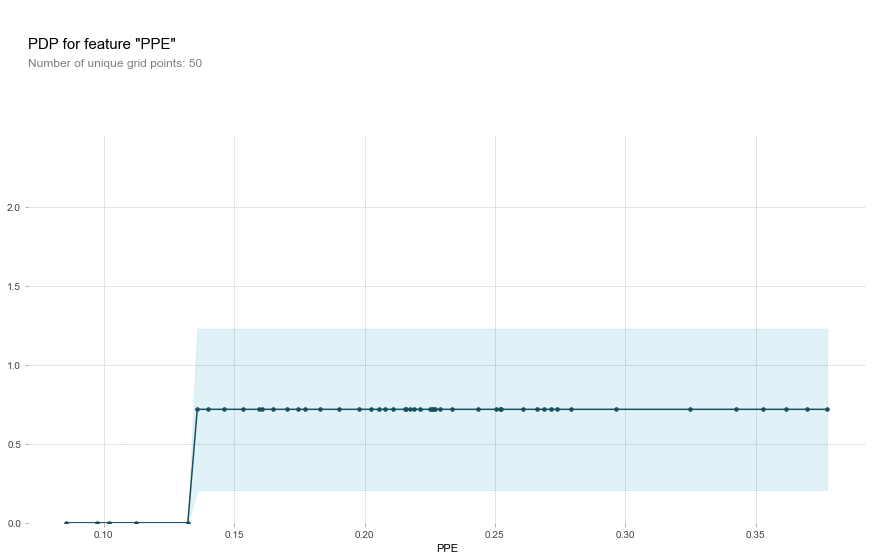

In [10]:
# Iterate over each feature and plot the pdp curve
for feature_name in X_test_dt.columns:
    # Calculate pdp data
    pdp_data_dt_all = pdp.pdp_isolate(model=clf_dt, dataset=X_test_dt, model_features=X_test_dt.columns, feature=feature_name,num_grid_points = 50)

    # Plot pdp curve
    pdp.pdp_plot(pdp_data_dt_all, feature_name)
    
    plt.show()
    

## Decision Tree Optimization 

Now to improve the performance of the model on the domain of illness detection, we hereby create a new decision tree that classifies cases as "unknown" if they are very close to the boundary of the key features (defined by feature importance method)

Print wrongly perdicted cases for old tree

In [11]:
import pandas as pd

# Create DataFrame with misclassified samples for Decision Tree Classifier
df_misclassified_dtc = pd.DataFrame({'True Label': y_test_dt, 'Predicted Label': y_pred_dt, 'Features': X_test_dt.values.tolist()})
df_misclassified_dtc = df_misclassified_dtc[df_misclassified_dtc['True Label'] != df_misclassified_dtc['Predicted Label']]
print(df_misclassified_dtc)

     True Label  Predicted Label  \
184           0                1   
113           1                0   
168           0                1   

                                              Features  
184  [116.848, 217.552, 99.503, 0.00531, 5e-05, 0.0...  
113  [210.141, 232.706, 185.258, 0.00534, 3e-05, 0....  
168  [197.569, 217.627, 90.794, 0.00803, 4e-05, 0.0...  


In [12]:
# Find instances with incorrect predictions
incorrect_predictions = X_test_dt[y_pred_dt != y_test_dt]
actual_classes = y_test_dt[y_pred_dt != y_test_dt]

# Print incorrect predictions and their actual classes
for index, instance in incorrect_predictions.iterrows():
    print("Incorrectly predicted instance:")
    print(instance)
    print("Actual class:", actual_classes.loc[index])
    print("----------------------")

Incorrectly predicted instance:
MDVP:Fo(Hz)         116.848000
MDVP:Fhi(Hz)        217.552000
MDVP:Flo(Hz)         99.503000
MDVP:Jitter(%)        0.005310
MDVP:Jitter(Abs)      0.000050
MDVP:RAP              0.002600
MDVP:PPQ              0.003460
Jitter:DDP            0.007800
MDVP:Shimmer          0.017950
MDVP:Shimmer(dB)      0.163000
Shimmer:APQ3          0.008100
Shimmer:APQ5          0.011440
MDVP:APQ              0.017560
Shimmer:DDA           0.024290
NHR                   0.011790
HNR                  22.085000
RPDE                  0.663842
DFA                   0.656516
spread1              -5.198864
spread2               0.206768
D2                    2.120412
PPE                   0.252404
Name: 184, dtype: float64
Actual class: 0
----------------------
Incorrectly predicted instance:
MDVP:Fo(Hz)         210.141000
MDVP:Fhi(Hz)        232.706000
MDVP:Flo(Hz)        185.258000
MDVP:Jitter(%)        0.005340
MDVP:Jitter(Abs)      0.000030
MDVP:RAP              0.003210
MDV

Because of Uncertainty near boundary, label case close to boundary as “unknown” class !

In [13]:
# Define a function to classify cases as "unknown" based on proximity to the boundary
def classify_unknown(X):
    # Define the threshold values for proximity to the boundary
    ppe_threshold = 0.13
    mdvp_fo_threshold = 192.27
    hnr_threshold = 25.55
    mdvp_fo_threshold2 = 208.8

    
    
    # Classify cases as "unknown" if they are close to the boundary
    classification = clf_dt.predict(X)
    for i in range(len(X)):
        if (
            #abs(X.iloc[i]['PPE'] - ppe_threshold) / ppe_threshold <= 0.1 or
            #abs(X.iloc[i]['MDVP:Fo(Hz)'] - mdvp_fo_threshold) / mdvp_fo_threshold <= 0 or
            #abs(X.iloc[i]['HNR'] - hnr_threshold) / hnr_threshold <= 0 or
            abs(X.iloc[i]['MDVP:Fo(Hz)'] - mdvp_fo_threshold2) / mdvp_fo_threshold2 <= 0.1
            
        ):
            classification[i] = -1
    
    return classification

# Classify the test set including "unknown" cases
y_pred_dt_modified = classify_unknown(X_test_dt)

# Print the modified decision tree results
print(y_pred_dt_modified)

# Print the old decision tree for comparision 
tree_rules = export_text(clf_dt, feature_names=list(X_dt.columns))
print(tree_rules)


[ 1  1  1  1  1  1  1  1 -1 -1  1  1  1  1  1  1  1 -1  0 -1  1 -1  1  0
  1  1  1  1 -1  1  1  1  1  0  1  0  1 -1  1]
|--- PPE <= 0.13
|   |--- MDVP:Fo(Hz) <= 192.27
|   |   |--- HNR <= 25.55
|   |   |   |--- MDVP:Flo(Hz) <= 125.97
|   |   |   |   |--- class: 0
|   |   |   |--- MDVP:Flo(Hz) >  125.97
|   |   |   |   |--- class: 1
|   |   |--- HNR >  25.55
|   |   |   |--- class: 1
|   |--- MDVP:Fo(Hz) >  192.27
|   |   |--- D2 <= 2.72
|   |   |   |--- class: 0
|   |   |--- D2 >  2.72
|   |   |   |--- class: 1
|--- PPE >  0.13
|   |--- MDVP:RAP <= 0.00
|   |   |--- MDVP:Fo(Hz) <= 117.99
|   |   |   |--- RPDE <= 0.61
|   |   |   |   |--- class: 0
|   |   |   |--- RPDE >  0.61
|   |   |   |   |--- class: 1
|   |   |--- MDVP:Fo(Hz) >  117.99
|   |   |   |--- spread1 <= -6.69
|   |   |   |   |--- class: 0
|   |   |   |--- spread1 >  -6.69
|   |   |   |   |--- class: 1
|   |--- MDVP:RAP >  0.00
|   |   |--- MDVP:Fo(Hz) <= 208.80
|   |   |   |--- class: 1
|   |   |--- MDVP:Fo(Hz) >  208.80


In [14]:
import pandas as pd

# Create DataFrame with misclassified samples for Decision Tree Classifier
df_misclassified_dtc = pd.DataFrame({'True Label': y_test_dt, 'Predicted Label': y_pred_dt_modified, 'Features': X_test_dt.values.tolist()})
df_misclassified_dtc = df_misclassified_dtc[df_misclassified_dtc['True Label'] != df_misclassified_dtc['Predicted Label']]
print(df_misclassified_dtc)

from IPython.display import display

# Set the max number of columns and rows to display
pd.set_option('display.max_columns', None)  # Show all columns
pd.set_option('display.max_rows', None)  # Show all rows

# Display the DataFrame or other outputs
display(df_misclassified_dtc)

     True Label  Predicted Label  \
112           1               -1   
111           1               -1   
184           0                1   
113           1               -1   
119           1               -1   
144           1               -1   
30            0               -1   
168           0               -1   

                                              Features  
112  [204.664, 221.3, 189.621, 0.00841, 4e-05, 0.00...  
111  [208.519, 220.315, 199.02, 0.00609, 3e-05, 0.0...  
184  [116.848, 217.552, 99.503, 0.00531, 5e-05, 0.0...  
113  [210.141, 232.706, 185.258, 0.00534, 3e-05, 0....  
119  [217.116, 233.481, 93.978, 0.00404, 2e-05, 0.0...  
144  [202.544, 241.35, 164.168, 0.00254, 1e-05, 0.0...  
30   [197.076, 206.896, 192.055, 0.00289, 1e-05, 0....  
168  [197.569, 217.627, 90.794, 0.00803, 4e-05, 0.0...  


,True Label,Predicted Label,Features
112,1,-1,"[204.664, 221.3, 189.621, 0.00841, 4e-05, 0.00..."
111,1,-1,"[208.519, 220.315, 199.02, 0.00609, 3e-05, 0.0..."
184,0,1,"[116.848, 217.552, 99.503, 0.00531, 5e-05, 0.0..."
113,1,-1,"[210.141, 232.706, 185.258, 0.00534, 3e-05, 0...."
119,1,-1,"[217.116, 233.481, 93.978, 0.00404, 2e-05, 0.0..."
144,1,-1,"[202.544, 241.35, 164.168, 0.00254, 1e-05, 0.0..."
30,0,-1,"[197.076, 206.896, 192.055, 0.00289, 1e-05, 0...."
168,0,-1,"[197.569, 217.627, 90.794, 0.00803, 4e-05, 0.0..."


# Random Forest

In [15]:
# Split the dataset into features (X) and target (y)
X_rf = df.drop(['name', 'status'], axis=1)
y_rf = df['status']

X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(X_rf, y_rf, test_size=0.2, random_state=42)

# Train a Random Forest classifier
clf_rf = RandomForestClassifier(n_estimators=100, random_state=42)
clf_rf.fit(X_train_rf, y_train_rf)

y_pred_rf = clf_rf.predict(X_test_rf)

# Calculate the accuracy of the model
accuracy_rf = accuracy_score(y_test_rf, y_pred_rf)
print("Accuracy: {:.2f}%".format(accuracy_rf*100))

Accuracy: 94.87%


## Gini Importance (Model-Specific Methods) 

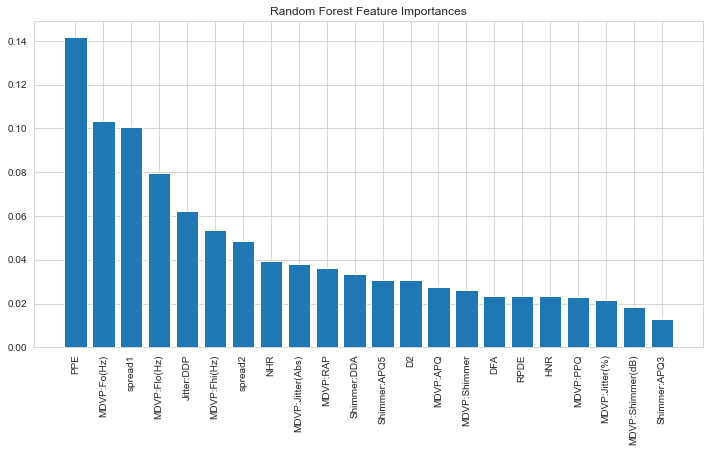

In [16]:
feature_importances_rf = clf_rf.feature_importances_
indices_rf = feature_importances_rf.argsort()[::-1]
feature_names_rf = X_rf.columns[indices_rf]

sns.set_style("whitegrid")
plt.figure(figsize=(12, 6))
plt.title("Random Forest Feature Importances")
plt.bar(range(X_rf.shape[1]), feature_importances_rf[indices_rf])
plt.xticks(range(X_rf.shape[1]), feature_names_rf, rotation=90)
plt.show()

## Permutation Importance

PPE: 0.0385
spread1: 0.0333
MDVP:Fo(Hz): 0.0128
Jitter:DDP: 0.0051
MDVP:Fhi(Hz): 0.0026
spread2: 0.0000
MDVP:Shimmer: 0.0000
MDVP:Flo(Hz): 0.0000
MDVP:Jitter(%): 0.0000
MDVP:Jitter(Abs): 0.0000
MDVP:RAP: 0.0000
MDVP:PPQ: 0.0000
MDVP:Shimmer(dB): 0.0000
DFA: 0.0000
D2: 0.0000
Shimmer:APQ5: 0.0000
MDVP:APQ: 0.0000
Shimmer:DDA: 0.0000
NHR: 0.0000
HNR: 0.0000
RPDE: 0.0000
Shimmer:APQ3: 0.0000


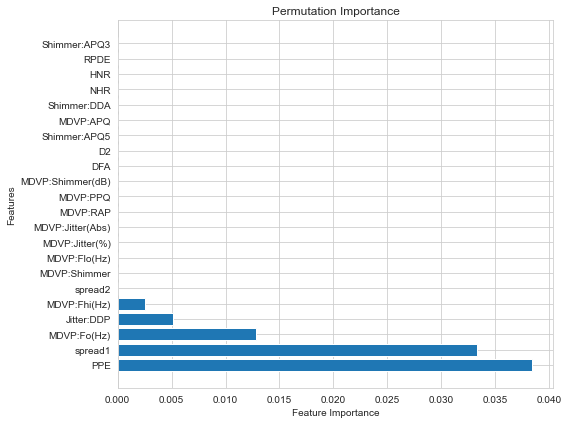

In [17]:
# Perform permutation importance
result_rf = permutation_importance(clf_rf, X_test_rf, y_test_rf, n_repeats=10, random_state=42)

# Get feature importance scores
importance_scores_rf = result_rf.importances_mean

# Sort features by importance score in descending order
sorted_indices_rf = np.argsort(importance_scores_rf)[::-1]
sorted_features_rf = X_rf.columns[sorted_indices_rf]
sorted_scores_rf = importance_scores_rf[sorted_indices_rf]

# Print feature importance
for feature_rf, score_rf in zip(sorted_features_rf, sorted_scores_rf):
    print("{}: {:.4f}".format(feature_rf, score_rf))

# Plot feature importance
plt.figure(figsize=(8, 6))
plt.barh(sorted_features_rf, sorted_scores_rf)
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.title('Permutation Importance')
plt.tight_layout()
plt.show()

## SHAP 

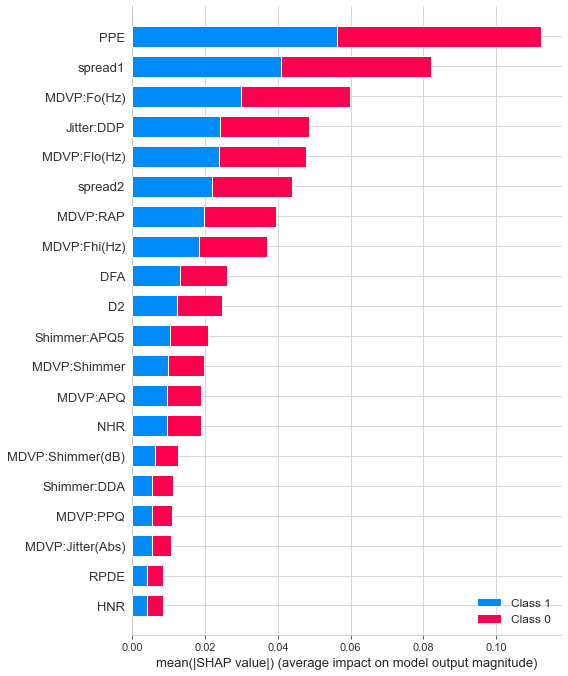

<Figure size 576x684 with 1 Axes>

In [ ]:
# Create an explainer object for the decision tree classifier
explainer_rf = shap.Explainer(clf_rf, X_train_rf)

# Calculate SHAP values for all features
shap_values_rf = explainer_rf.shap_values(X_test_rf)

# Plot the SHAP summary plot
shap.summary_plot(shap_values_rf, X_test_rf, plot_type='bar')

<IPython.core.display.HTML object>

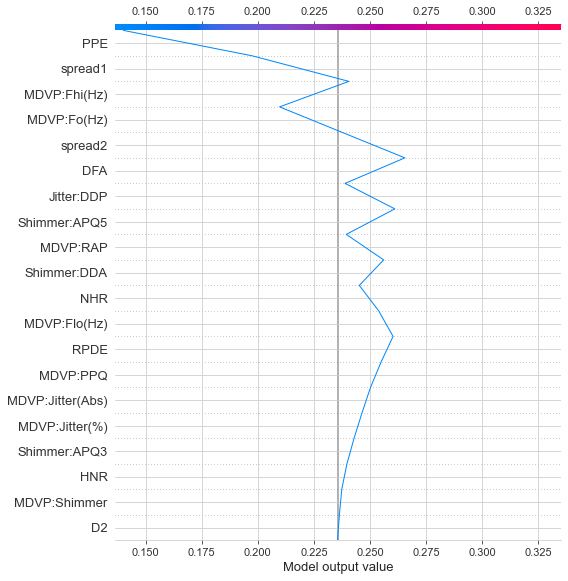

<Figure size 576x684 with 1 Axes>

<IPython.core.display.HTML object>

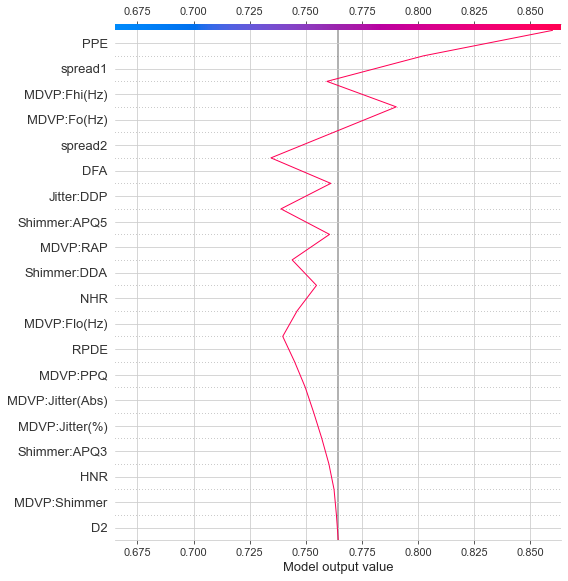

<Figure size 576x684 with 1 Axes>

In [ ]:
# Select the instance for generating the explanation
i_rf = 1
data_for_prediction_rf = X_test_rf.iloc[i_rf, :]

# Generate SHAP values for the instance
shap_values_rf_local = explainer_rf.shap_values(data_for_prediction_rf)

# Set the class index for negative prediction
class_index_rf = 0  

# Access the expected value for the negative class
expected_value_negative_rf = explainer_rf.expected_value[class_index_rf]

# Access the SHAP values for the negative class
shap_values_negative_rf = shap_values_rf_local[class_index_rf]

# Initialize the JS visualization
shap.initjs()

# Create the decision plot for the negative class
shap.decision_plot(expected_value_negative_rf, shap_values_negative_rf, feature_names=X_test_rf.columns.tolist())






# Do the same for the positive class
class_index_rf = 1  
expected_value_positive_rf = explainer_rf.expected_value[class_index_rf]
shap_values_positive_rf = shap_values_rf_local[class_index_rf]
shap.initjs()

# Create the decision plot 
shap.decision_plot(expected_value_positive_rf, shap_values_positive_rf, feature_names=X_test_rf.columns.tolist())

## ALE 

             eff  size
MDVP:Fo(Hz)           
95.056       0.0   0.0
100.960      0.0   2.0
102.273      0.0   1.0
109.860      0.0   1.0
110.707      0.0   1.0
110.739      0.0   1.0
112.014      0.0   1.0
112.239      0.0   1.0
116.848      0.0   1.0
117.870      0.0   1.0
121.345      0.0   1.0
126.144      0.0   1.0
128.451      0.0   1.0
136.969      0.0   1.0
140.341      0.0   1.0
142.167      0.0   1.0
143.533      0.0   1.0
144.188      0.0   1.0
148.090      0.0   1.0
151.872      0.0   1.0
152.125      0.0   1.0
153.046      0.0   1.0
156.405      0.0   1.0
159.116      0.0   1.0
163.656      0.0   1.0
166.888      0.0   1.0
170.756      0.0   1.0
174.688      0.0   1.0
178.285      0.0   1.0
182.018      0.0   1.0
197.076      0.0   1.0
197.569      0.0   1.0
202.544      0.0   1.0
204.664      0.0   1.0
208.519      0.0   1.0
210.141      0.0   1.0
217.116      0.0   1.0
240.301      0.0   1.0
242.852      0.0   1.0
              eff  size
MDVP:Fhi(Hz)           
110.019  

PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Con

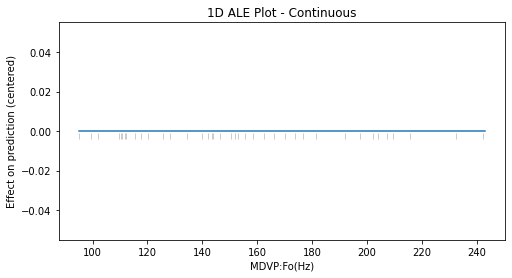

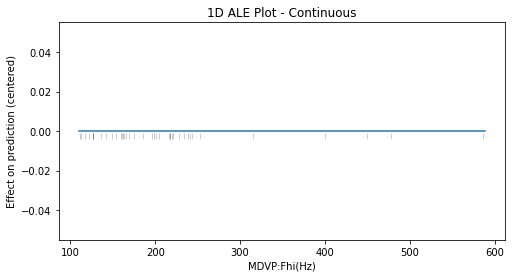

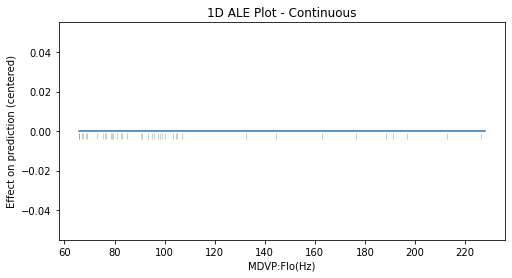

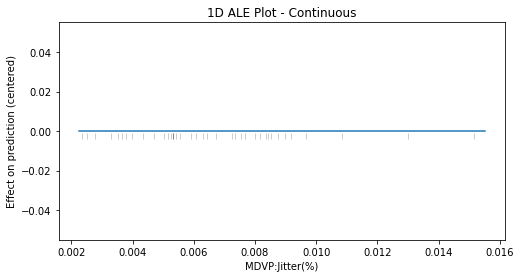

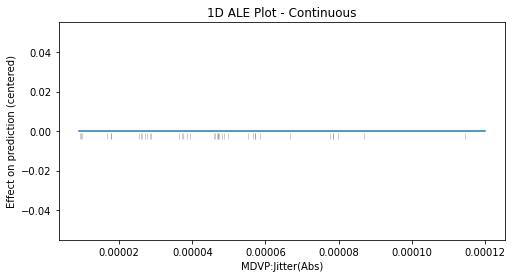

...

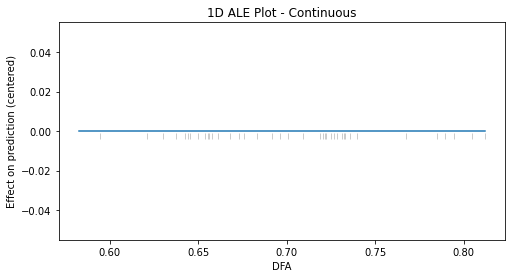

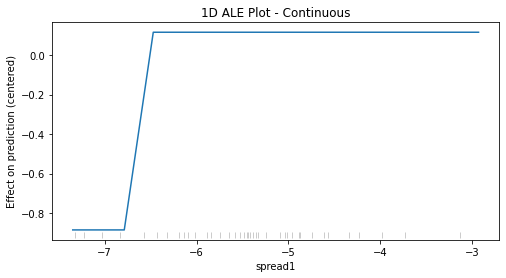

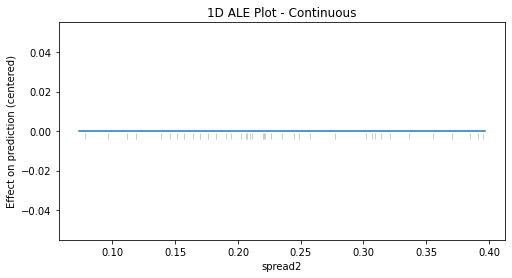

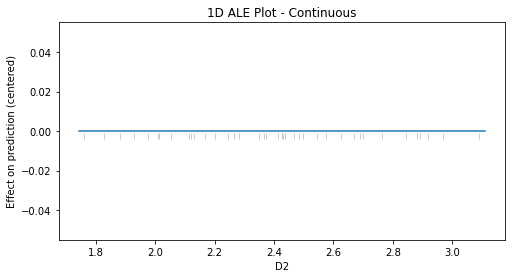

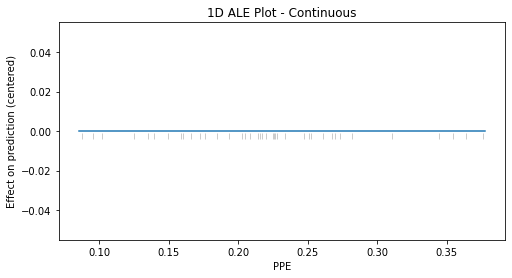

In [12]:
for feature in X_test_rf.columns:
    ale_eff_rf = ale(X=X_test_rf, model=clf_rf, feature=[feature], grid_size=50, include_CI=False)
    print(ale_eff_rf)

## PDP 

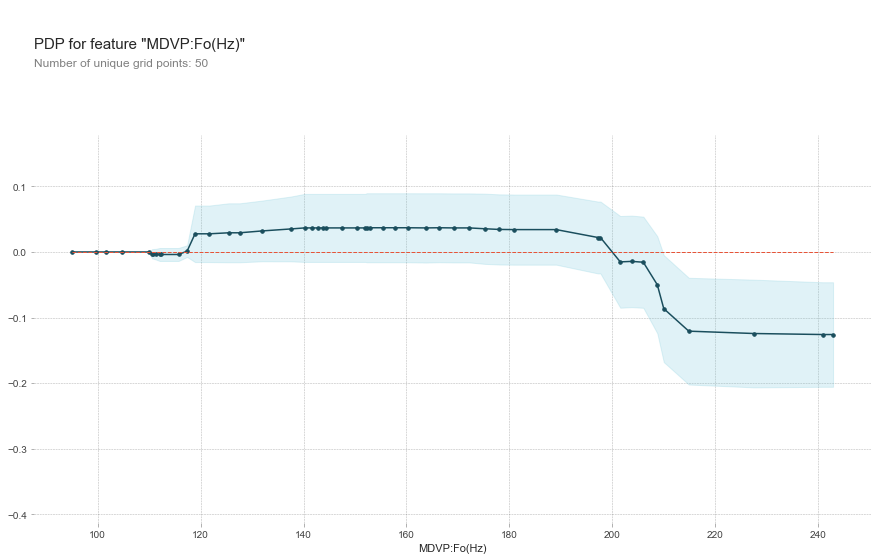

<Figure size 1080x684 with 2 Axes>

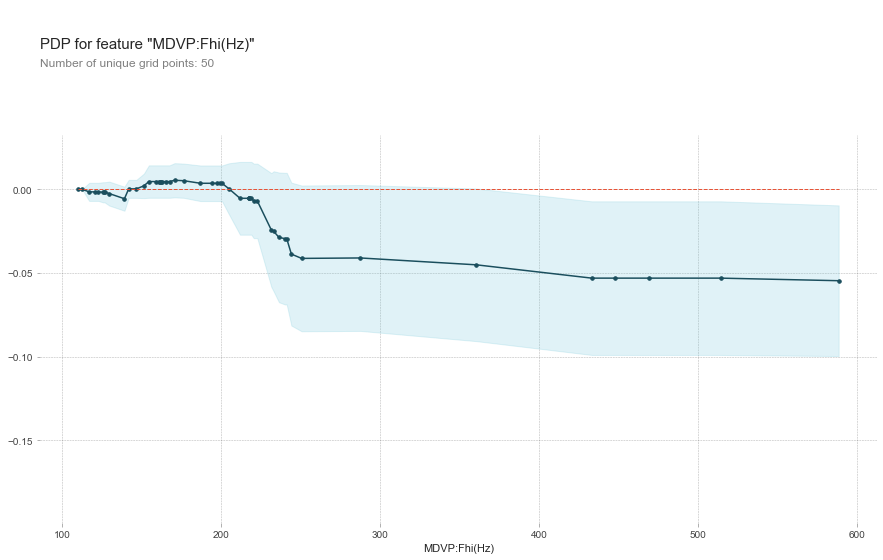

<Figure size 1080x684 with 2 Axes>

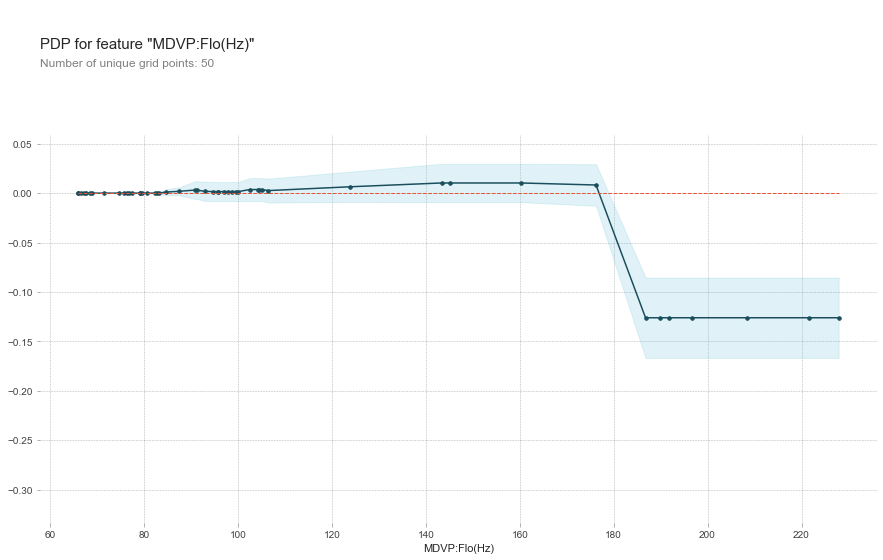

<Figure size 1080x684 with 2 Axes>

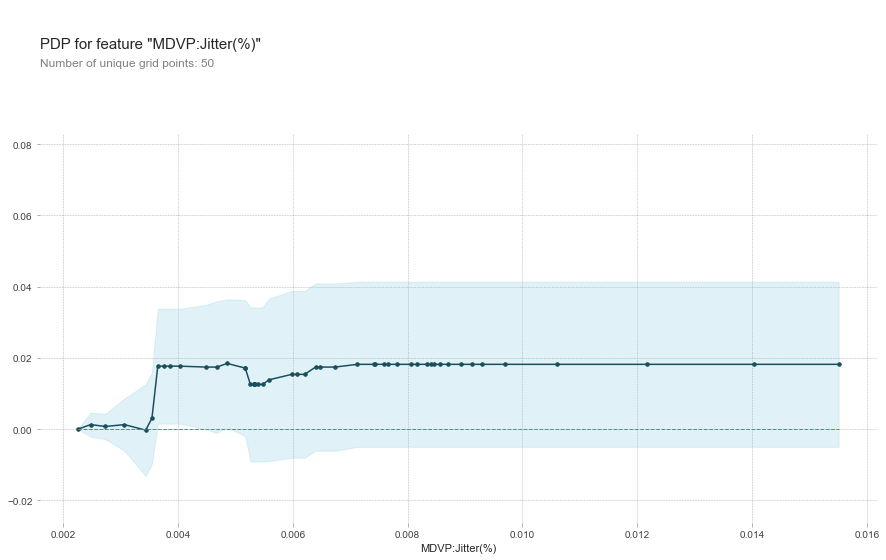

<Figure size 1080x684 with 2 Axes>

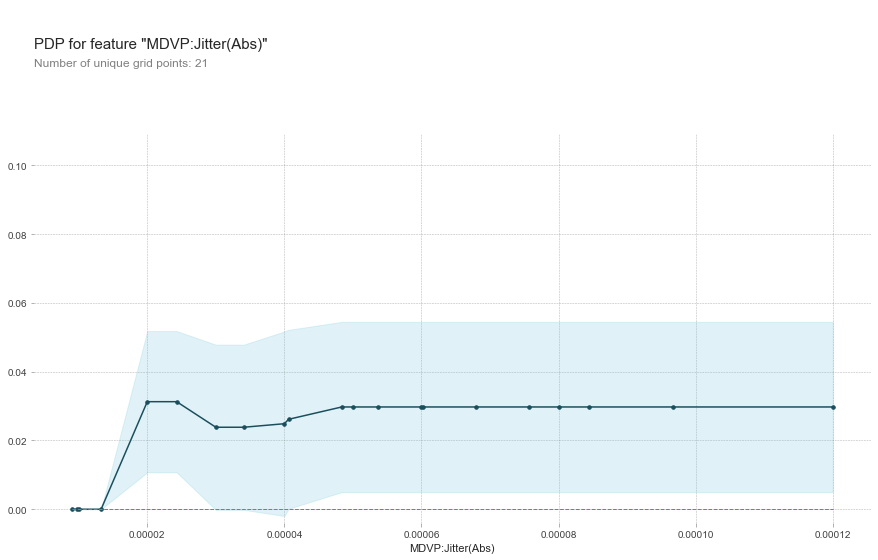

<Figure size 1080x684 with 2 Axes>

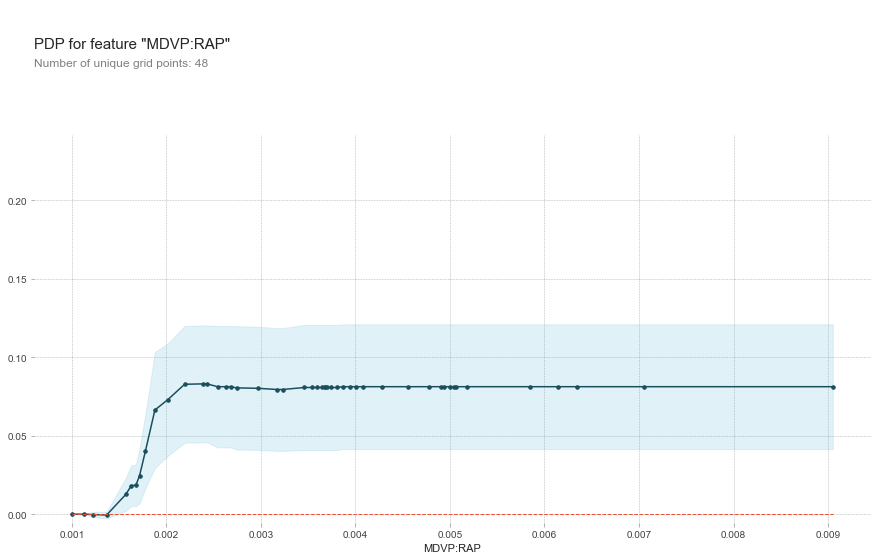

<Figure size 1080x684 with 2 Axes>

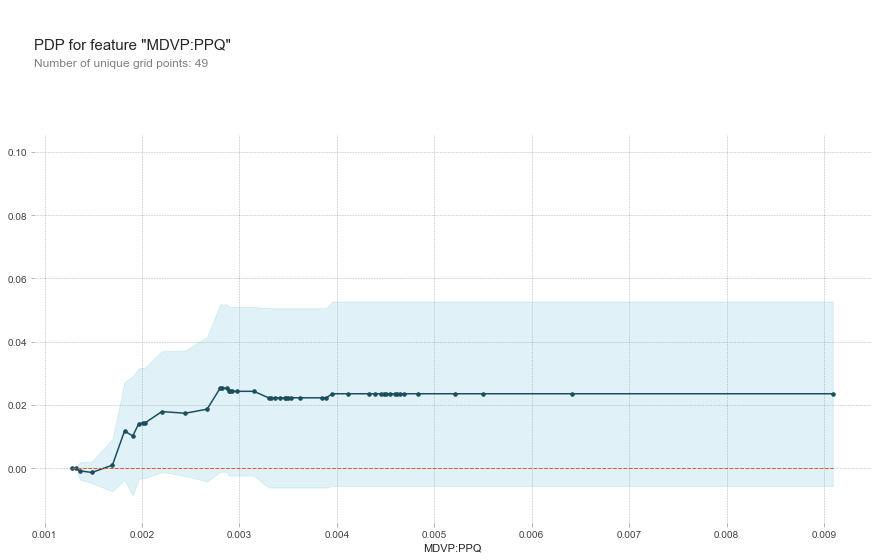

<Figure size 1080x684 with 2 Axes>

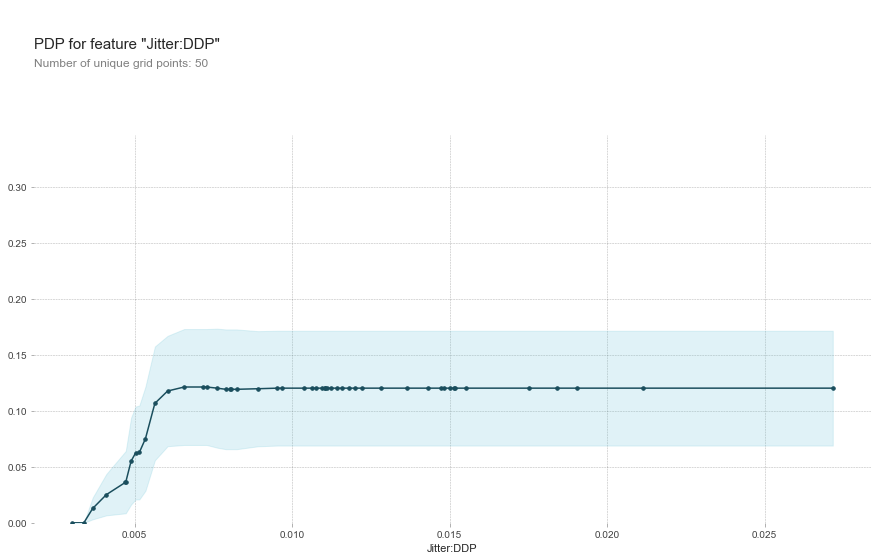

<Figure size 1080x684 with 2 Axes>

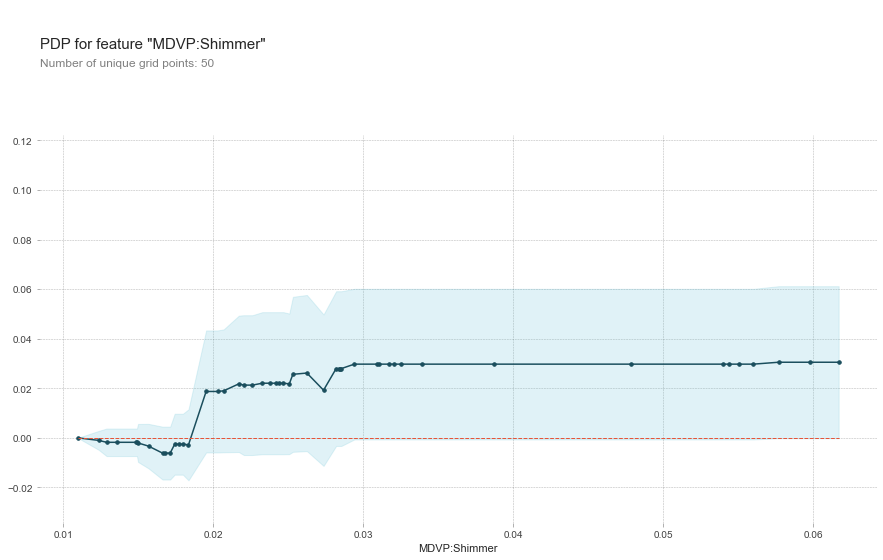

<Figure size 1080x684 with 2 Axes>

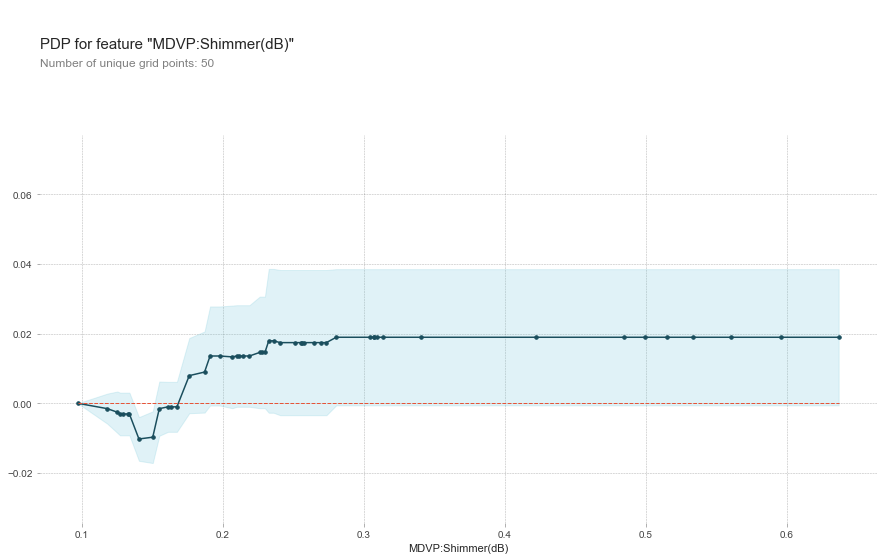

<Figure size 1080x684 with 2 Axes>

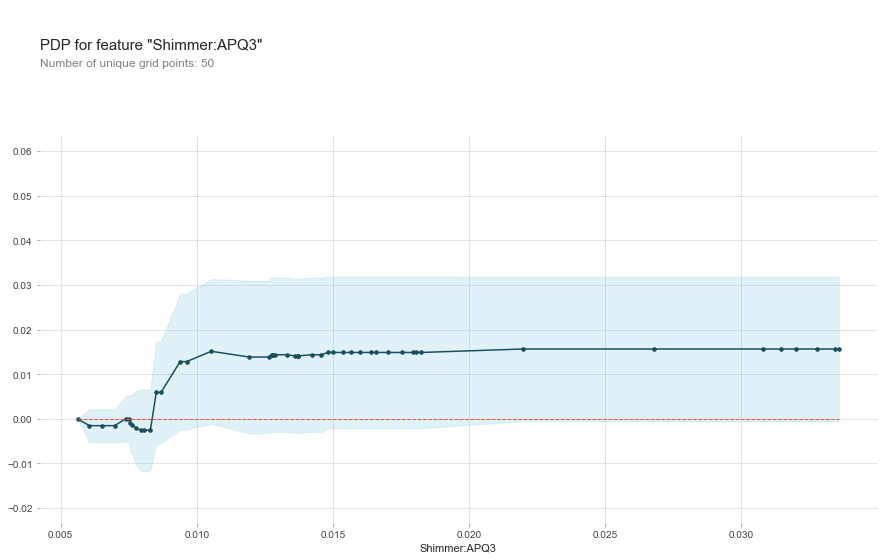

<Figure size 1080x684 with 2 Axes>

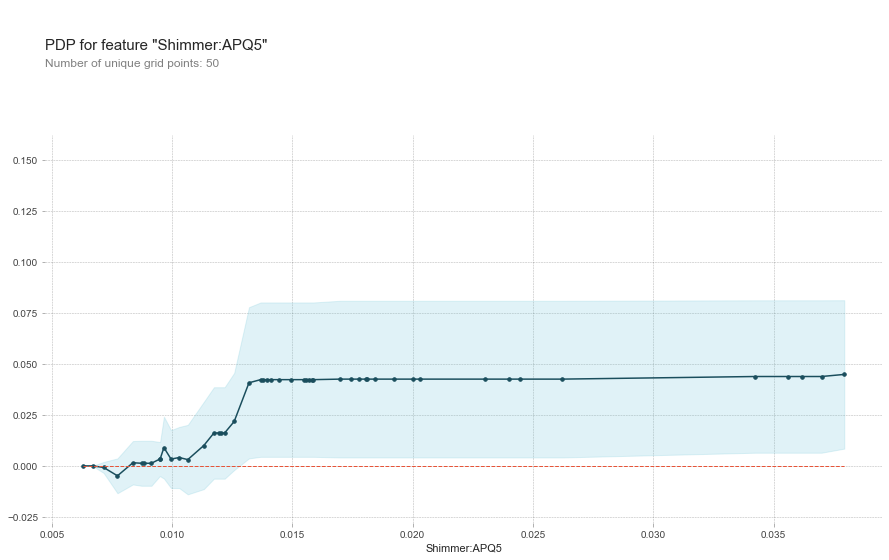

<Figure size 1080x684 with 2 Axes>

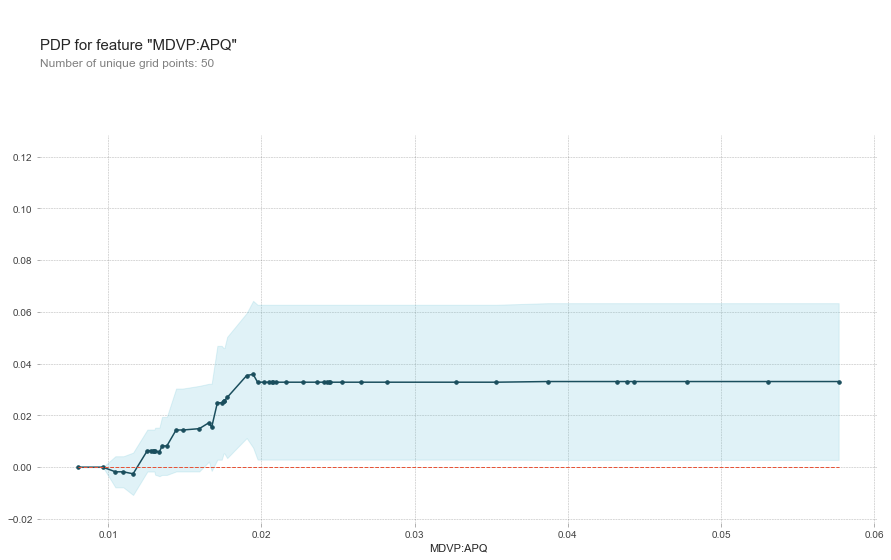

<Figure size 1080x684 with 2 Axes>

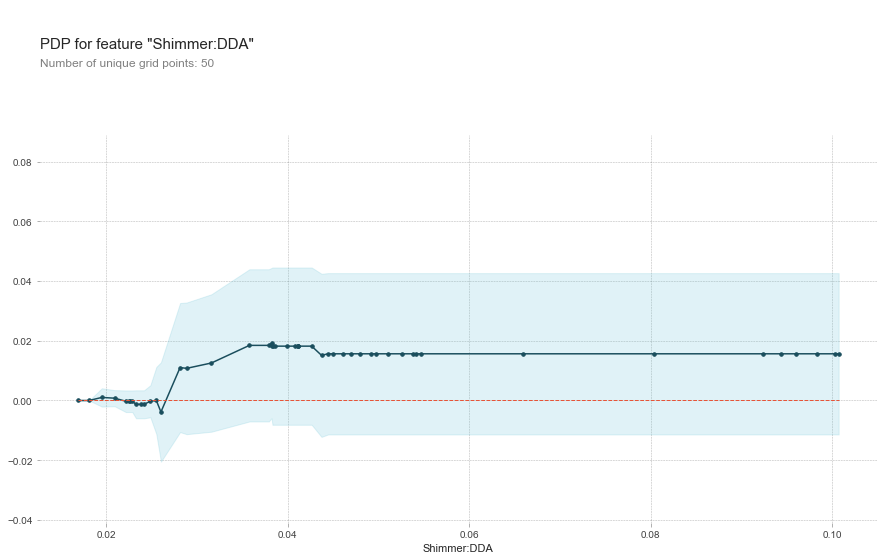

<Figure size 1080x684 with 2 Axes>

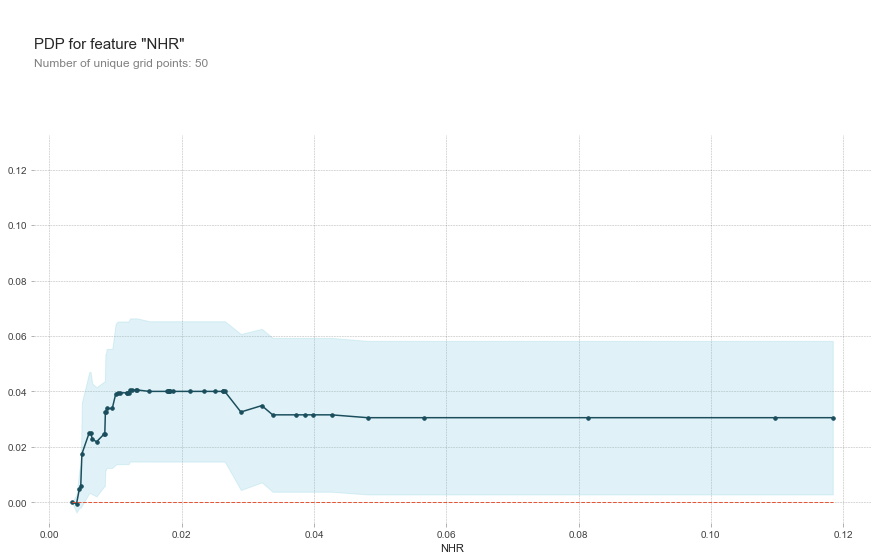

<Figure size 1080x684 with 2 Axes>

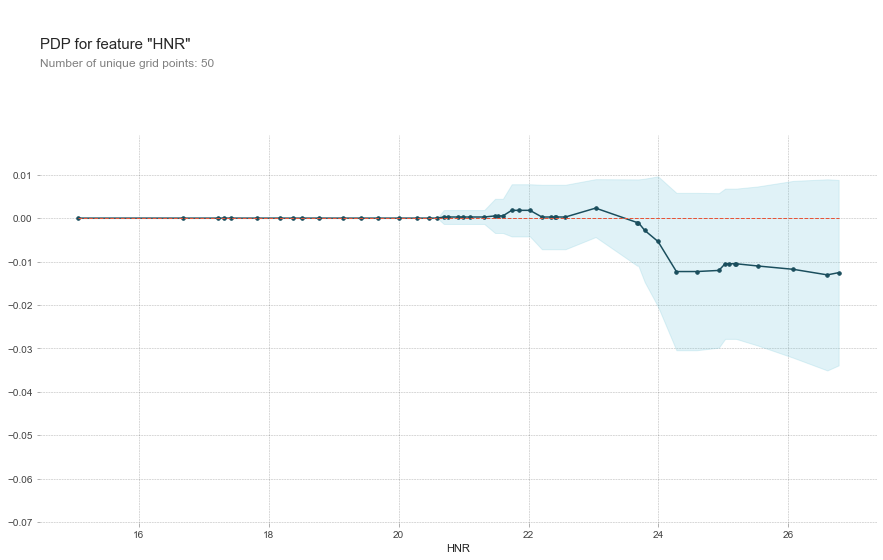

<Figure size 1080x684 with 2 Axes>

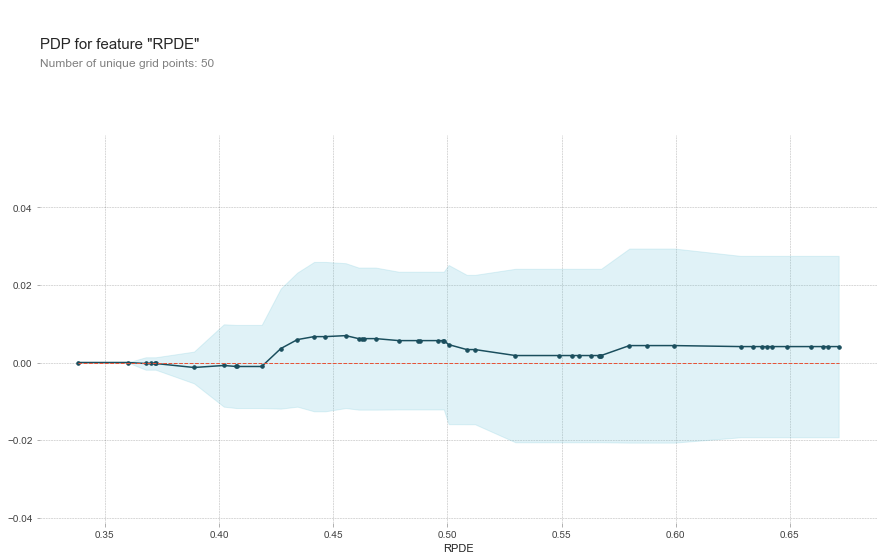

<Figure size 1080x684 with 2 Axes>

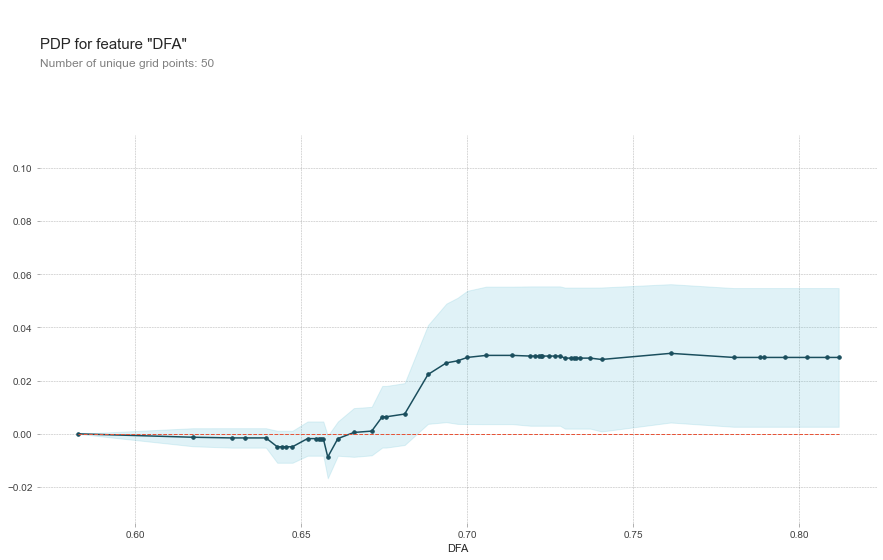

<Figure size 1080x684 with 2 Axes>

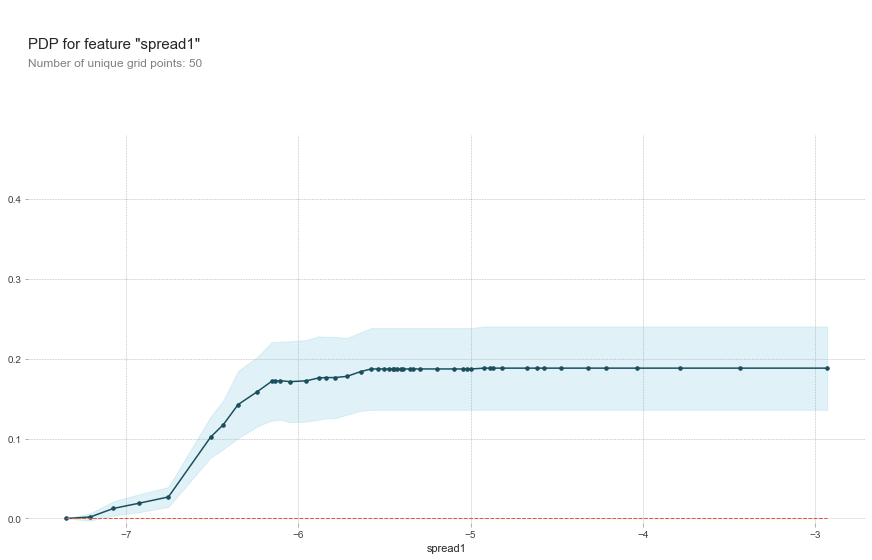

<Figure size 1080x684 with 2 Axes>

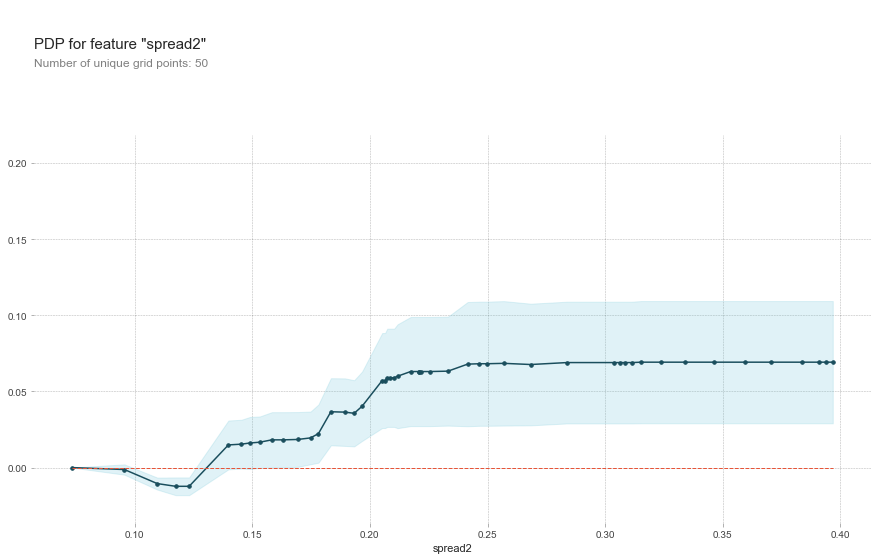

<Figure size 1080x684 with 2 Axes>

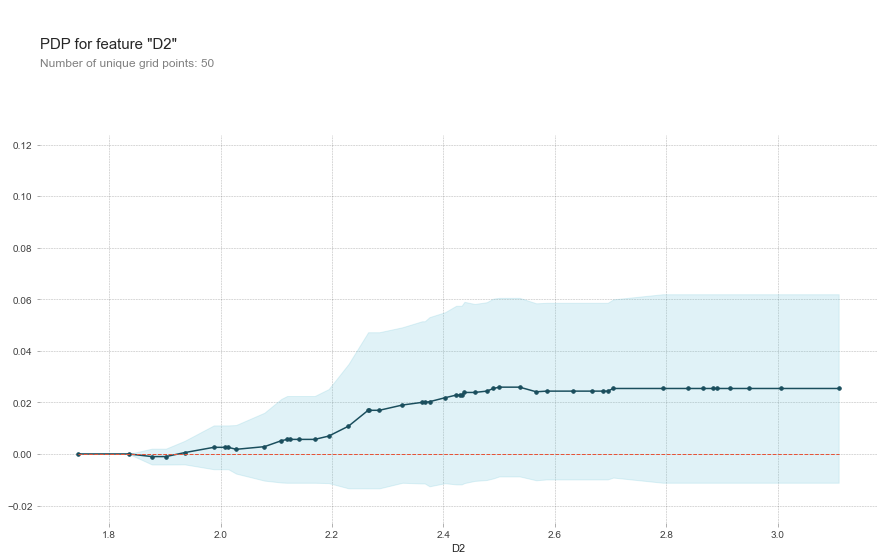

<Figure size 1080x684 with 2 Axes>

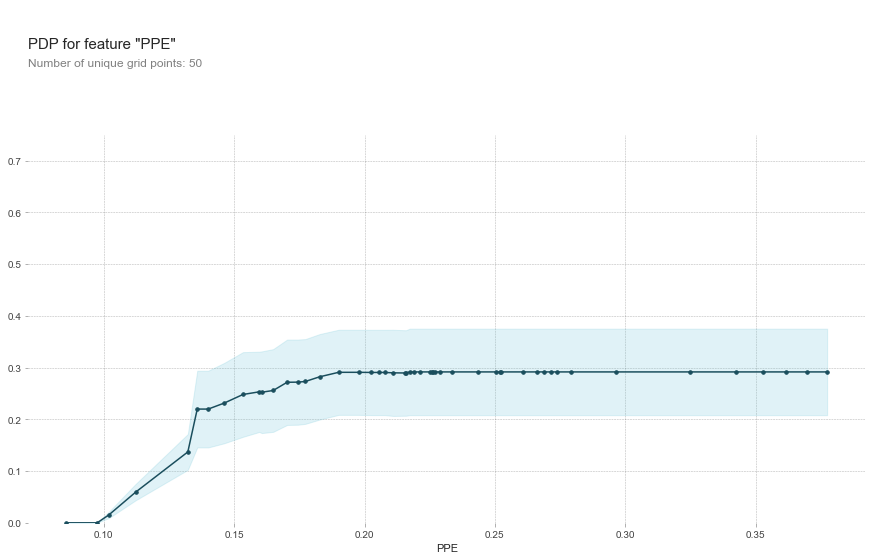

<Figure size 1080x684 with 2 Axes>

In [ ]:
# Iterate over each feature and plot the pdp curve
for feature_name in X_test_rf.columns:
    # Calculate pdp data
    pdp_data_rf_all = pdp.pdp_isolate(model=clf_rf, dataset=X_test_rf, model_features=X_test_rf.columns, feature=feature_name,num_grid_points = 50)

    # Plot pdp curve
    pdp.pdp_plot(pdp_data_rf_all, feature_name)
    plt.show()

# KNN

In [3]:
# Split the dataset into features and target variable
X_knn = df.drop(['name','status'], axis=1) 
y_knn = df['status']

# Split the dataset into training and testing sets
X_train_knn, X_test_knn, y_train_knn, y_test_knn = train_test_split(X_knn, y_knn, test_size=0.2, random_state=42)

# Create a kNN classifier
clf_knn = KNeighborsClassifier(n_neighbors=5)

# Train the classifier on the training set
clf_knn.fit(X_train_knn, y_train_knn)

# Make predictions on the testing set
y_pred_knn = clf_knn.predict(X_test_knn)



accuracy_score_knn= metrics.accuracy_score(y_test_knn, y_pred_knn)
print('accuracy score is', str('{:04.2f}'.format(accuracy_score_knn*100))+'%')

accuracy score is 82.05%


## Permutation Importance 

MDVP:Flo(Hz): 0.0154
MDVP:Fhi(Hz): 0.0128
HNR: 0.0026
PPE: 0.0000
MDVP:Shimmer(dB): 0.0000
MDVP:Jitter(%): 0.0000
MDVP:Jitter(Abs): 0.0000
MDVP:RAP: 0.0000
MDVP:PPQ: 0.0000
Jitter:DDP: 0.0000
MDVP:Shimmer: 0.0000
Shimmer:APQ3: 0.0000
D2: 0.0000
Shimmer:APQ5: 0.0000
MDVP:APQ: 0.0000
Shimmer:DDA: 0.0000
NHR: 0.0000
RPDE: 0.0000
DFA: 0.0000
spread1: 0.0000
spread2: 0.0000
MDVP:Fo(Hz): -0.0077


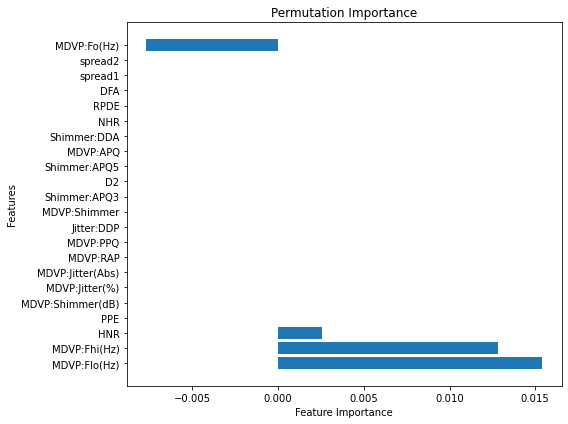

In [4]:
# Perform permutation importance
result_knn = permutation_importance(clf_knn, X_test_knn, y_test_knn, n_repeats=10, random_state=42)

# Get feature importance scores
importance_scores_knn = result_knn.importances_mean

# Sort features by importance score in descending order
sorted_indices_knn = np.argsort(importance_scores_knn)[::-1]
sorted_features_knn = X_knn.columns[sorted_indices_knn]
sorted_scores_knn = importance_scores_knn[sorted_indices_knn]

# Print feature importance
for feature_knn, score_knn in zip(sorted_features_knn, sorted_scores_knn):
    print("{}: {:.4f}".format(feature_knn, score_knn))

# Plot feature importance
plt.figure(figsize=(8, 6))
plt.barh(sorted_features_knn, sorted_scores_knn)
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.title('Permutation Importance')
plt.tight_layout()
plt.show()

## ALE 

                  eff  size
MDVP:Fo(Hz)                
95.056       0.217949   0.0
100.960      0.217949   2.0
102.273      0.217949   1.0
109.860      0.217949   1.0
110.707      0.217949   1.0
110.739      0.217949   1.0
112.014      0.217949   1.0
112.239      0.217949   1.0
116.848      0.217949   1.0
117.870      0.217949   1.0
121.345      0.217949   1.0
126.144      0.217949   1.0
128.451      0.217949   1.0
136.969      0.217949   1.0
140.341      0.217949   1.0
142.167      0.217949   1.0
143.533      0.217949   1.0
144.188      0.217949   1.0
148.090      0.217949   1.0
151.872      0.217949   1.0
152.125      0.217949   1.0
153.046      0.217949   1.0
156.405      0.217949   1.0
159.116      0.217949   1.0
163.656      0.217949   1.0
166.888      0.217949   1.0
170.756      0.217949   1.0
174.688      0.217949   1.0
178.285      0.217949   1.0
182.018      0.217949   1.0
197.076     -0.782051   1.0
197.569     -0.782051   1.0
202.544     -0.782051   1.0
204.664     -0.78205

PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Con

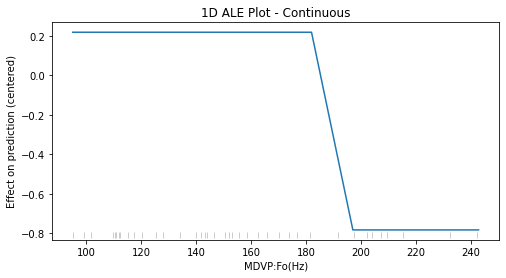

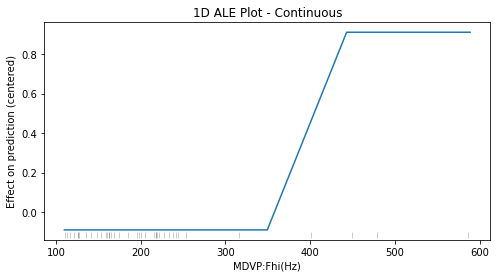

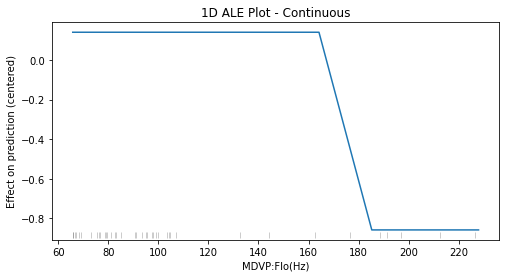

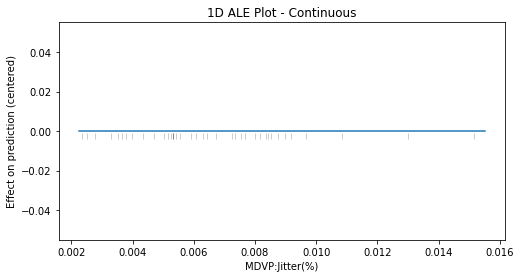

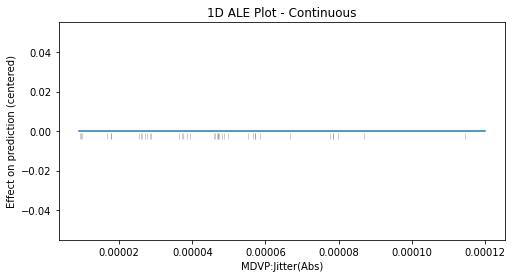

...

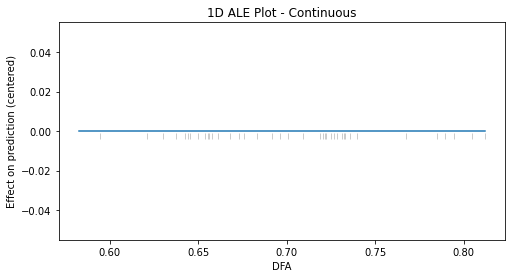

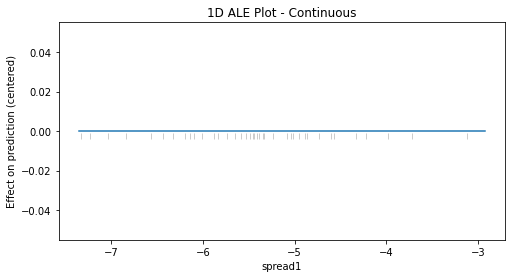

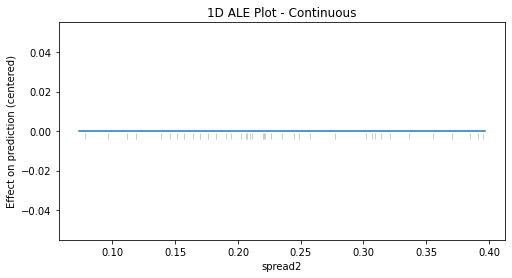

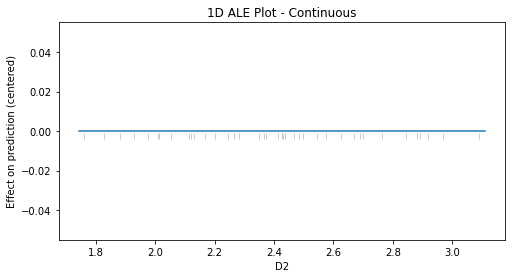

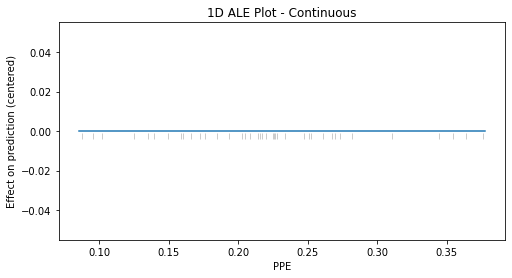

In [14]:
for feature in X_test_knn.columns:
    ale_eff_knn = ale(X=X_test_knn, model=clf_knn, feature=[feature], grid_size=50, include_CI=False)
    print(ale_eff_knn)

## PDP 

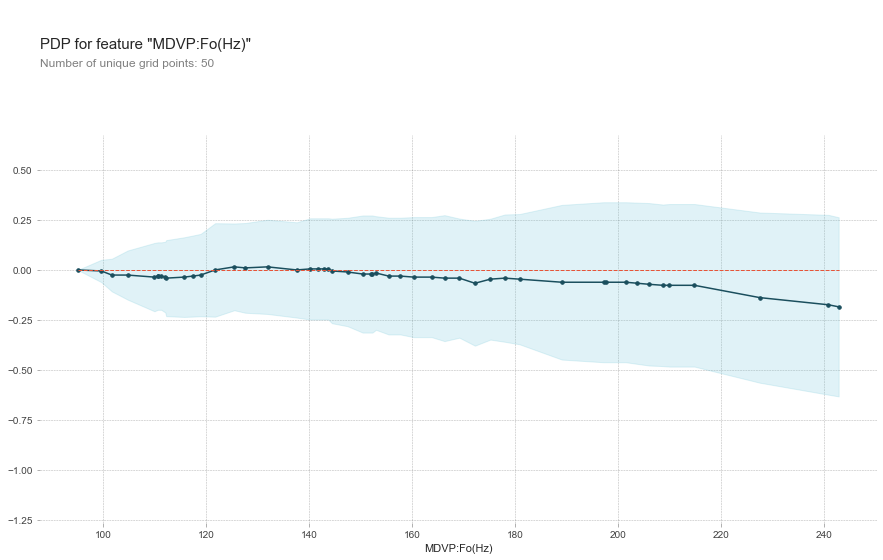

<Figure size 1080x684 with 2 Axes>

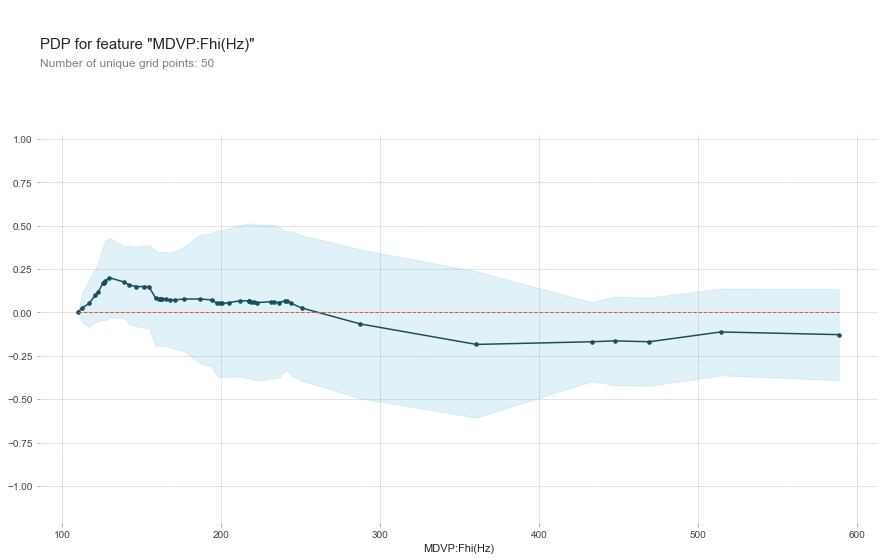

<Figure size 1080x684 with 2 Axes>

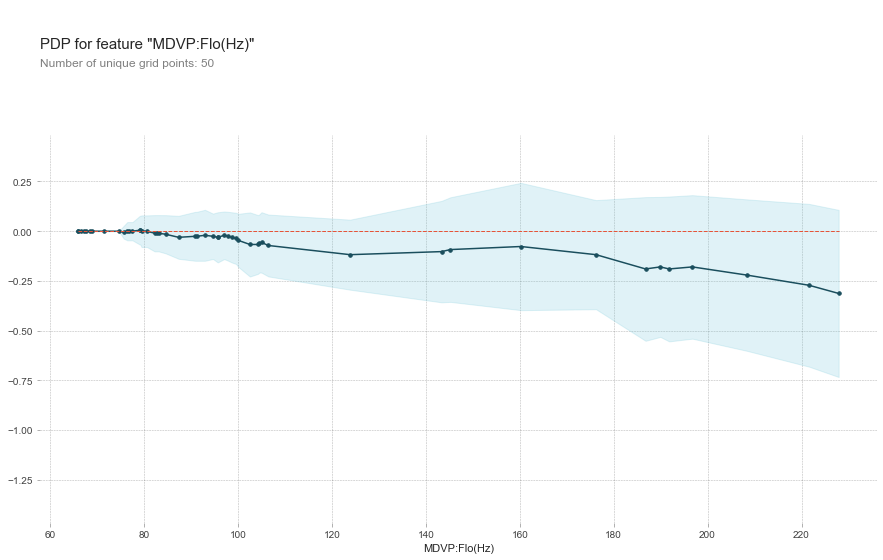

<Figure size 1080x684 with 2 Axes>

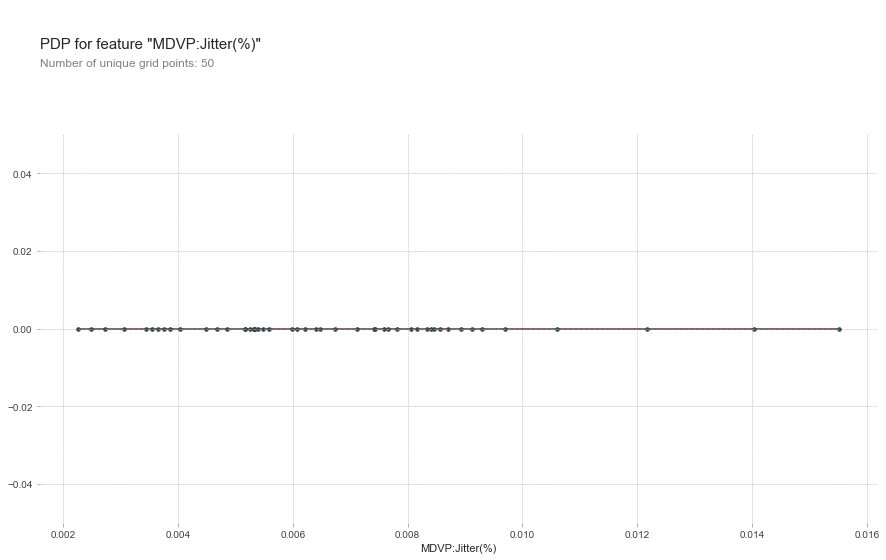

<Figure size 1080x684 with 2 Axes>

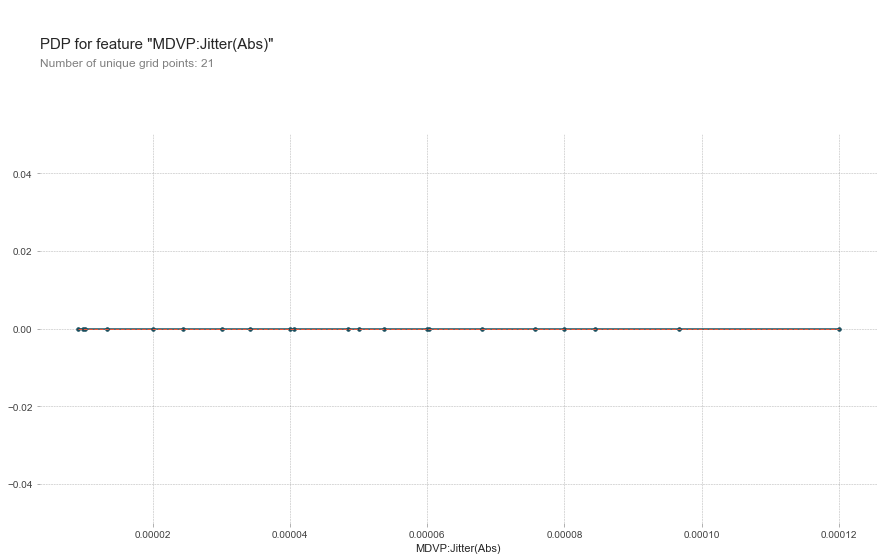

<Figure size 1080x684 with 2 Axes>

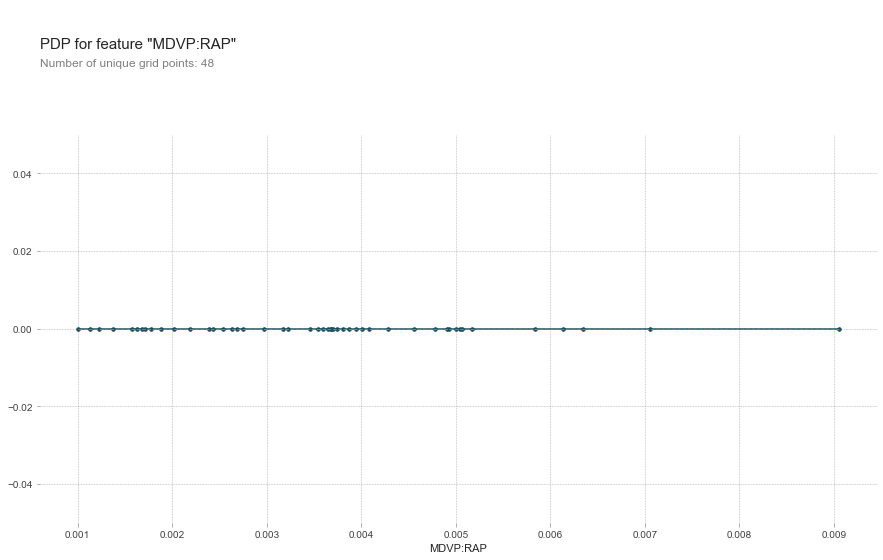

<Figure size 1080x684 with 2 Axes>

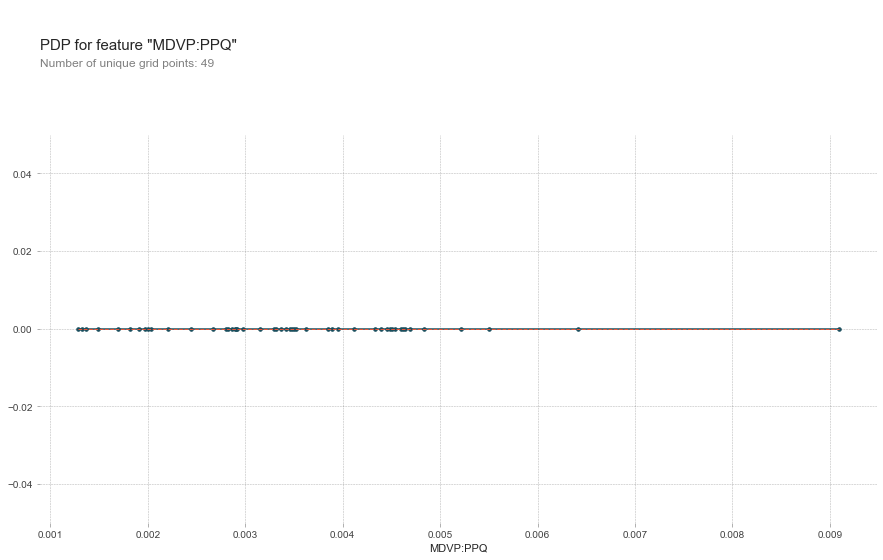

<Figure size 1080x684 with 2 Axes>

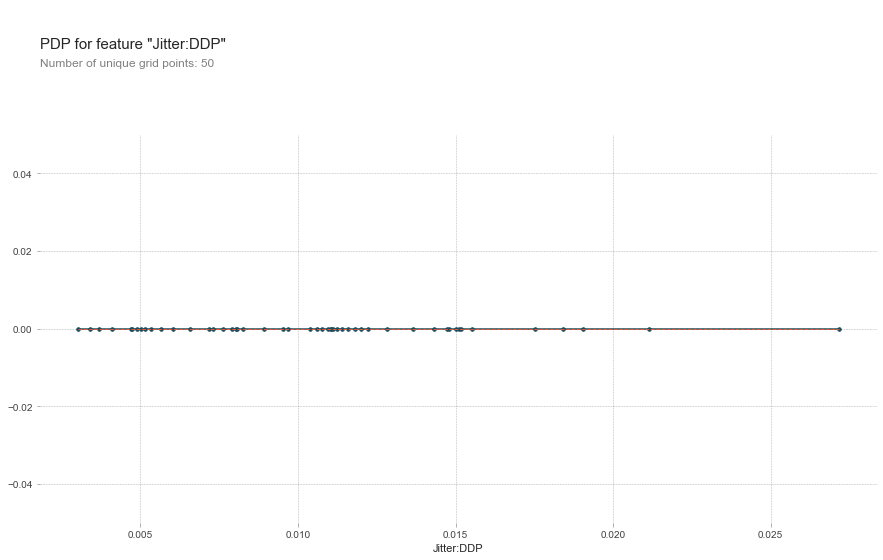

<Figure size 1080x684 with 2 Axes>

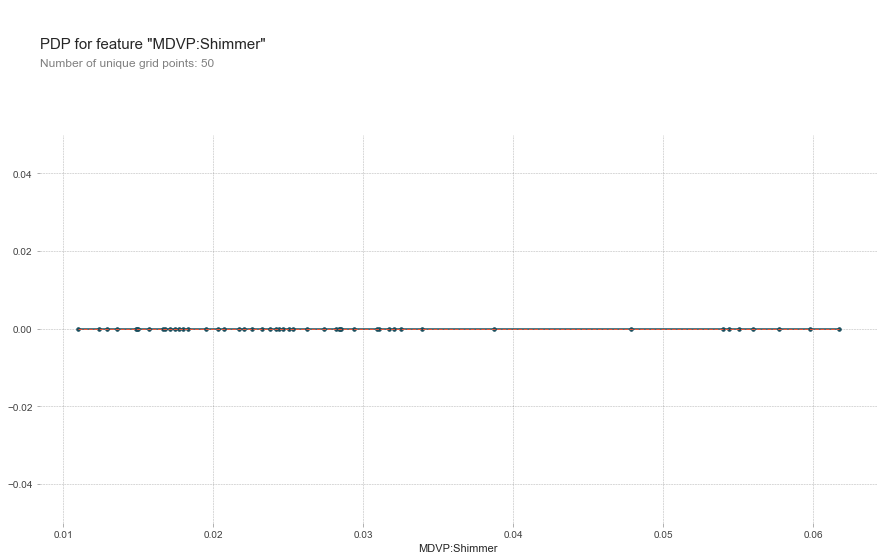

<Figure size 1080x684 with 2 Axes>

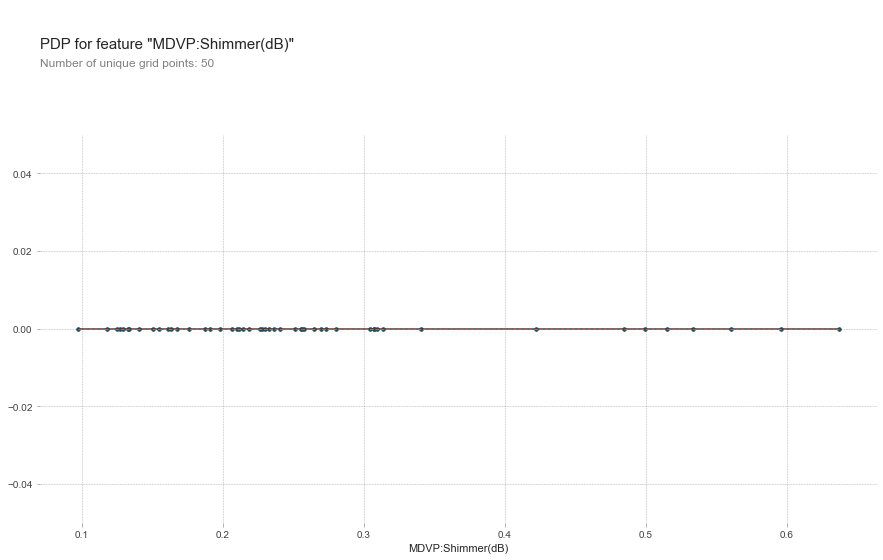

<Figure size 1080x684 with 2 Axes>

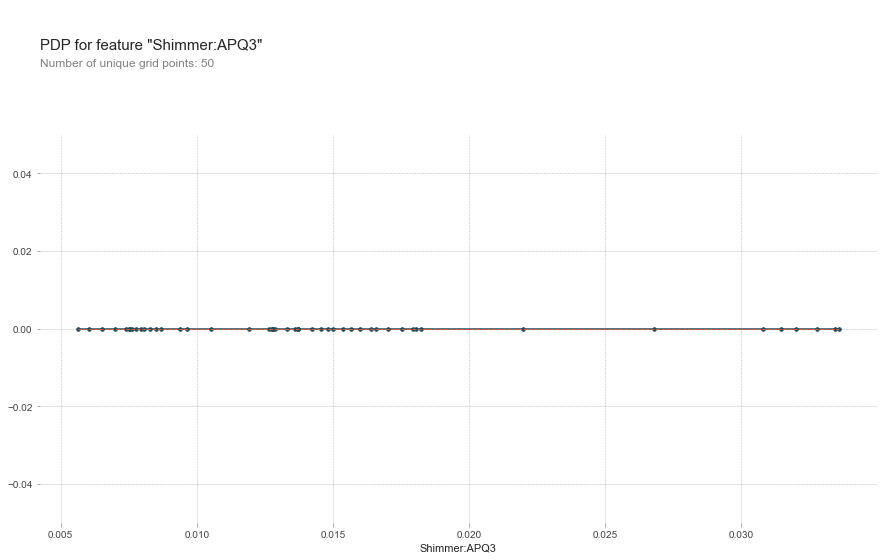

<Figure size 1080x684 with 2 Axes>

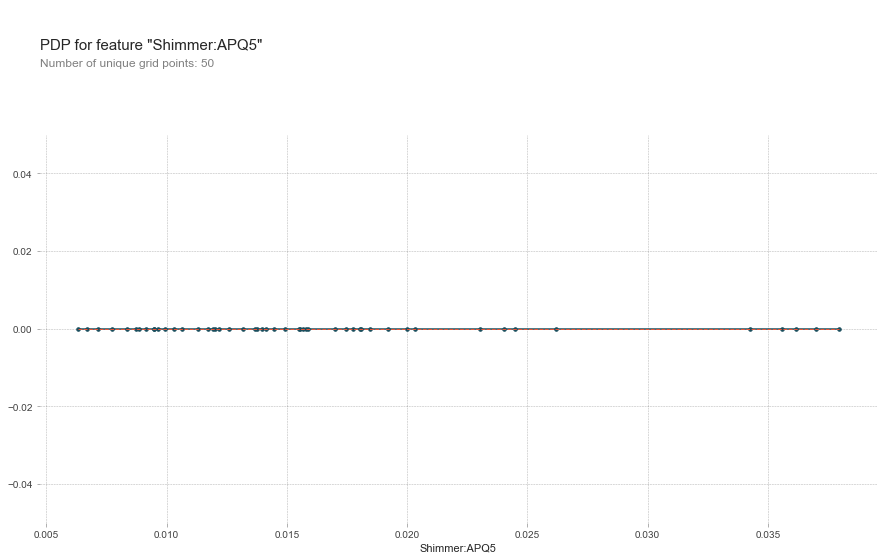

<Figure size 1080x684 with 2 Axes>

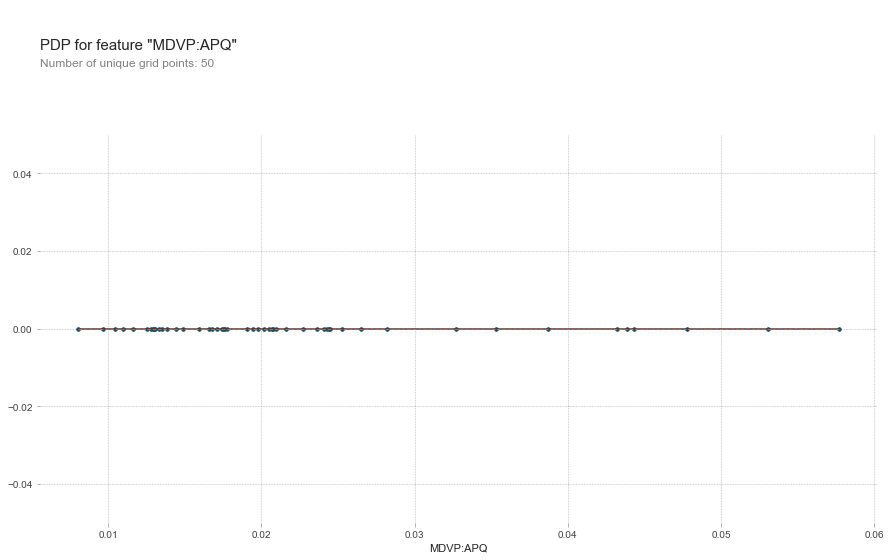

<Figure size 1080x684 with 2 Axes>

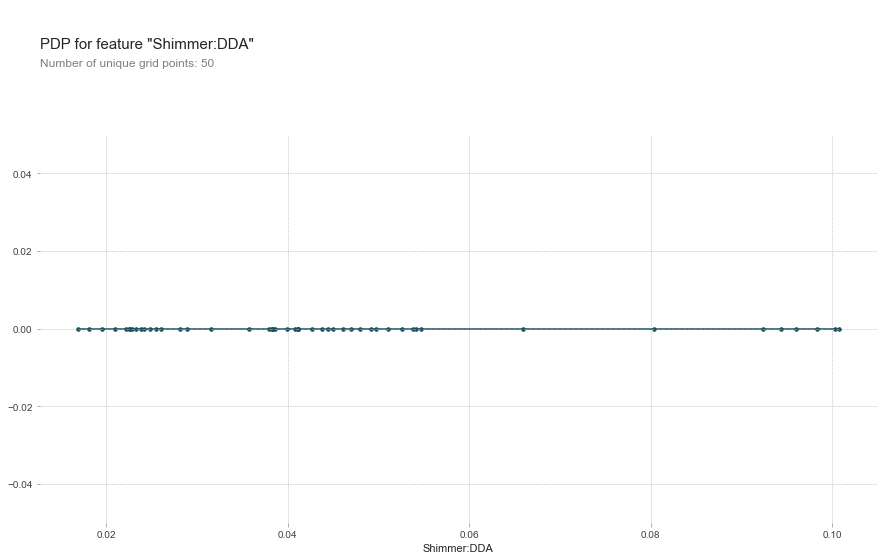

<Figure size 1080x684 with 2 Axes>

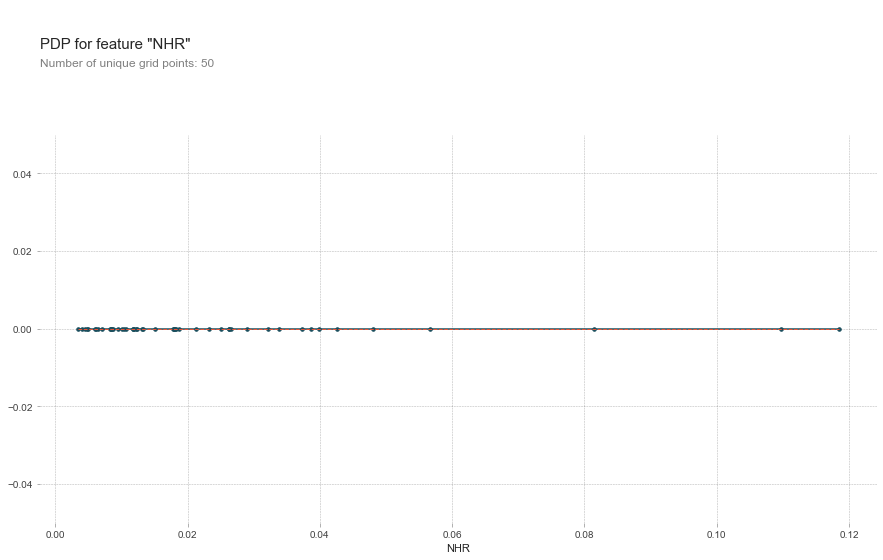

<Figure size 1080x684 with 2 Axes>

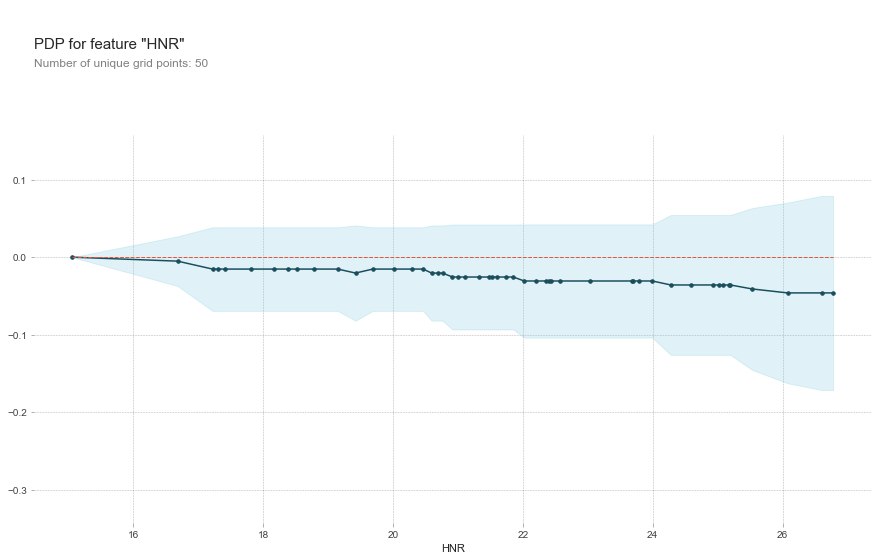

<Figure size 1080x684 with 2 Axes>

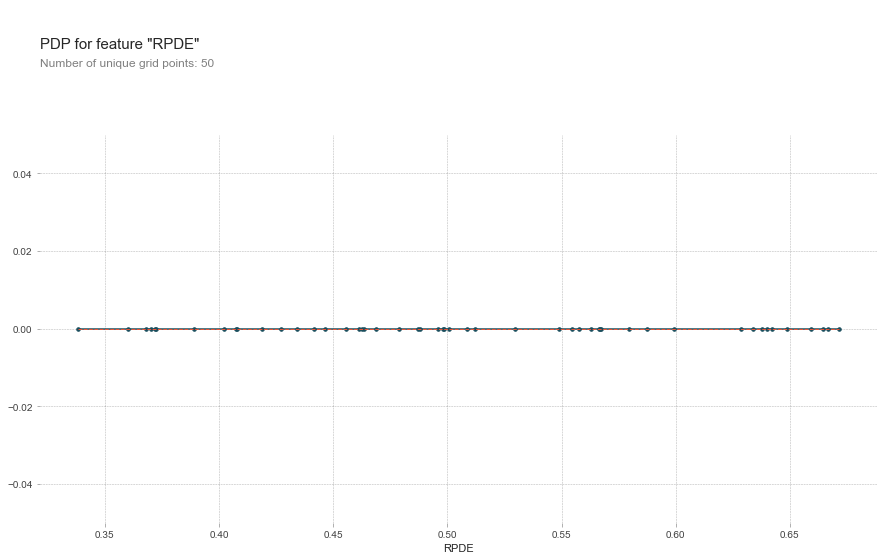

<Figure size 1080x684 with 2 Axes>

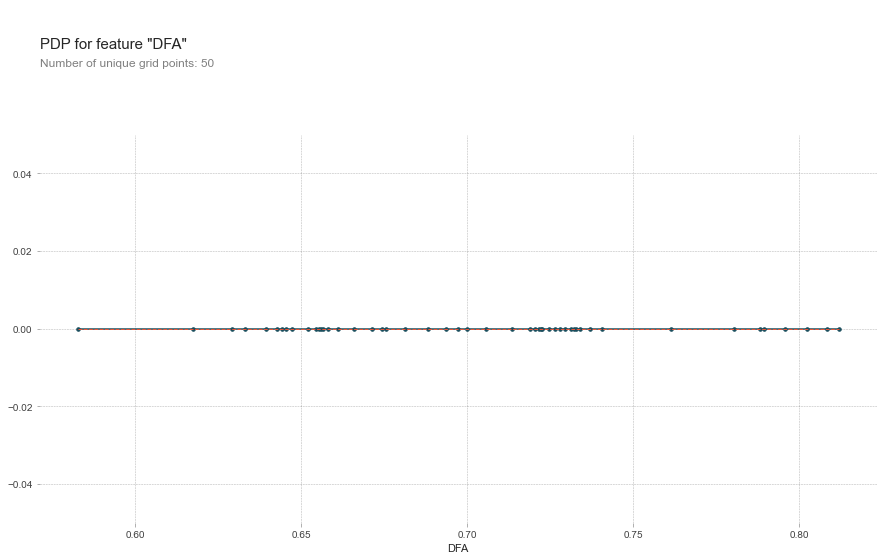

<Figure size 1080x684 with 2 Axes>

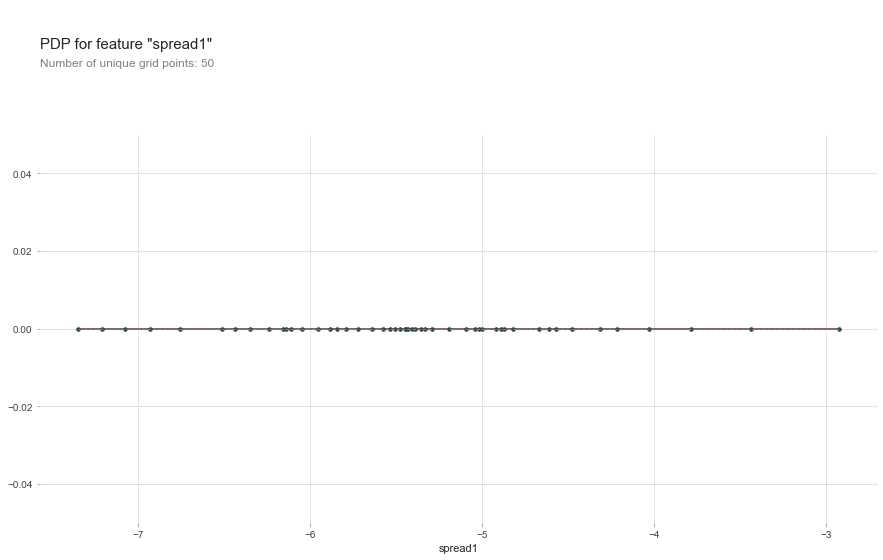

<Figure size 1080x684 with 2 Axes>

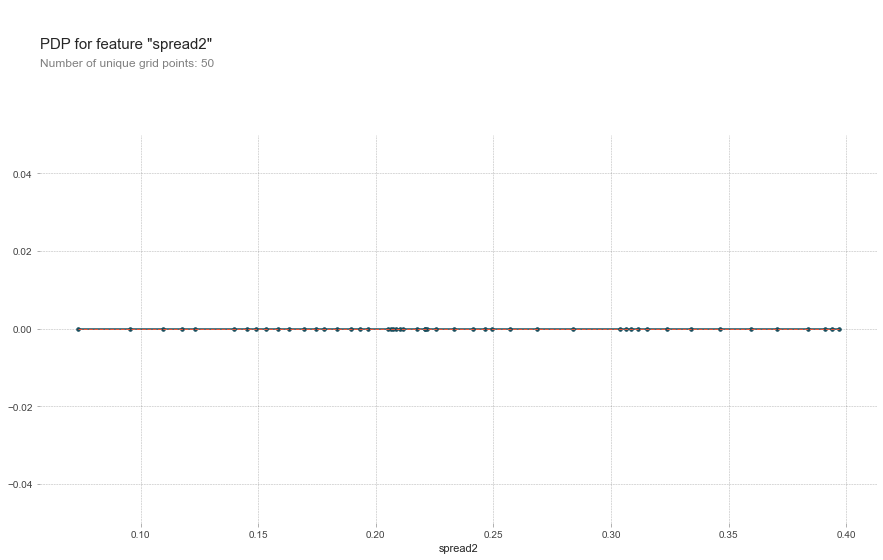

<Figure size 1080x684 with 2 Axes>

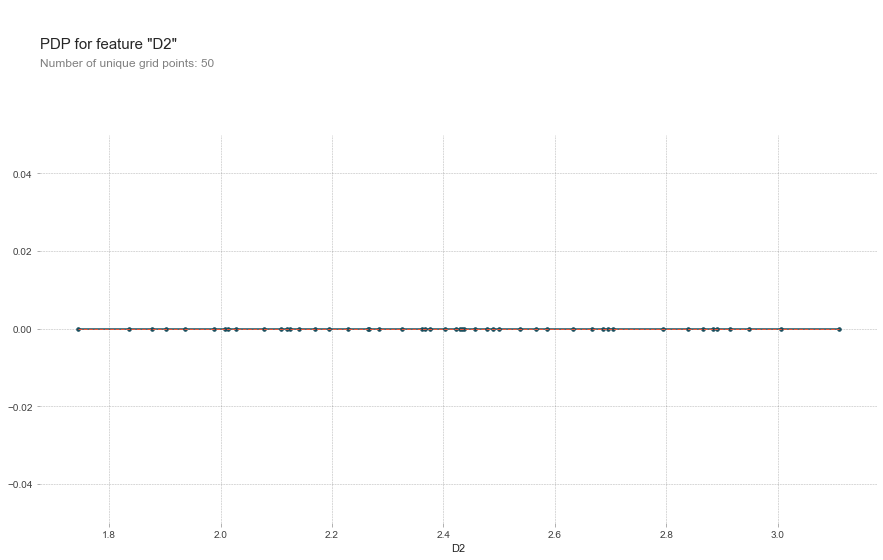

<Figure size 1080x684 with 2 Axes>

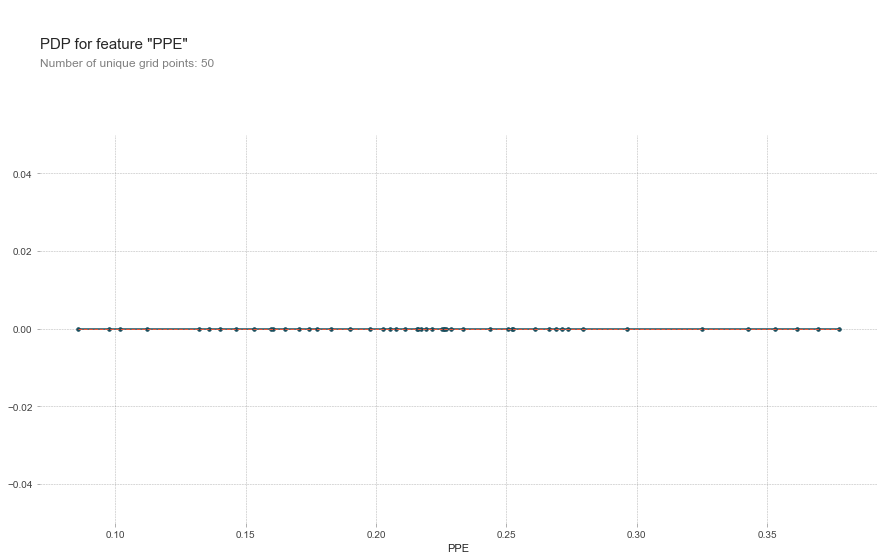

<Figure size 1080x684 with 2 Axes>

In [ ]:
# Iterate over each feature and plot the pdp curve
for feature_name in X_test_knn.columns:
    # Calculate pdp data
    pdp_data_knn_all = pdp.pdp_isolate(model=clf_knn, dataset=X_test_knn, model_features=X_test_knn.columns, feature=feature_name,num_grid_points = 50)

    # Plot pdp curve
    pdp.pdp_plot(pdp_data_knn_all, feature_name)
    plt.show()

##  SHAP

Using 156 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/39 [00:00<?, ?it/s]

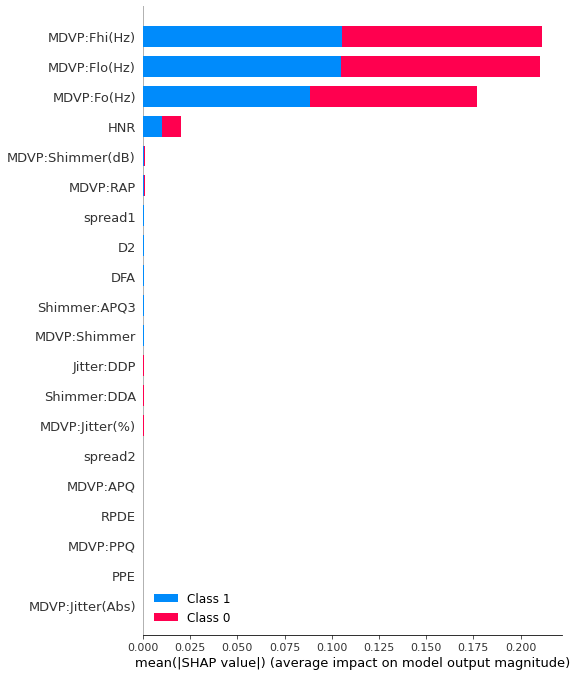

In [5]:
# Create an explainer object 
explainer_knn = shap.KernelExplainer(clf_knn.predict_proba, X_train_knn)

# Calculate SHAP values for all features
shap_values_knn = explainer_knn.shap_values(X_test_knn)

# Plot the SHAP summary plot
shap.summary_plot(shap_values_knn, X_test_knn, plot_type='bar')

Using 156 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.






<IPython.core.display.HTML object>

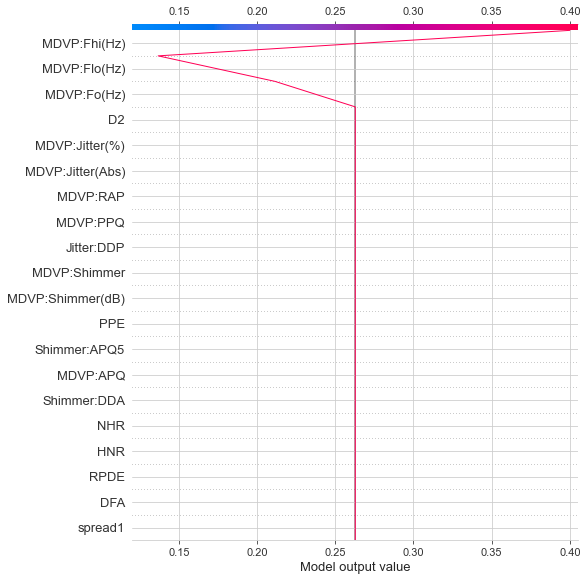

<Figure size 576x684 with 1 Axes>

<IPython.core.display.HTML object>

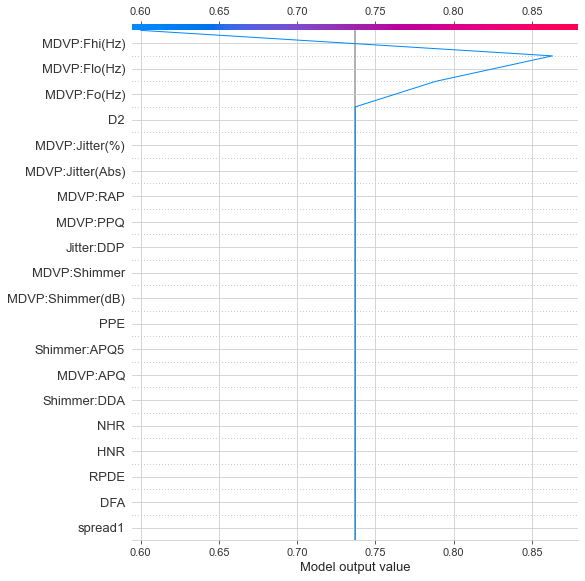

<Figure size 576x684 with 1 Axes>

In [ ]:
np.random.seed(36)
# Create explainer
explainer_knn = shap.KernelExplainer(clf_knn.predict_proba, X_train_knn)

# Select the instance for generating the explanation
i_knn = 1
data_for_prediction_knn = X_test_knn.iloc[i_knn, :]

# Generate SHAP values for the instance
shap_values_knn = explainer_knn.shap_values(data_for_prediction_knn)

# Set the class index for negative prediction
class_index_knn = 0  

# Access the expected value for the negative class
expected_value_negative_knn = explainer_knn.expected_value[class_index_knn]

# Access the SHAP values for the negative class
shap_values_negative_knn = shap_values_knn[class_index_knn]

# Initialize the JS visualization
shap.initjs()



# Positive class
shap.decision_plot(expected_value_negative_knn, shap_values_negative_knn, feature_names=X_test_knn.columns.tolist())
class_index_knn = 1  
expected_value_positive_knn = explainer_knn.expected_value[class_index_knn]
shap_values_positive_knn = shap_values_knn[class_index_knn]
shap.initjs()

# Create the decision plot 
shap.decision_plot(expected_value_positive_knn, shap_values_positive_knn, feature_names=X_test_knn.columns.tolist())



# Multi-Layer Perceptron (MLP) neural network

In [15]:
X_mlp = df.drop(['name', 'status'], axis=1)
y_mlp = df['status']

# Split the data into training and test sets
X_train_mlp, X_test_mlp, y_train_mlp, y_test_mlp = train_test_split(X_mlp, y_mlp, test_size=0.2, random_state=42)

# Train the MLP classifier
clf_mlp = MLPClassifier(hidden_layer_sizes=(50,), max_iter=1000, alpha=1e-4,
                    solver='adam', tol=1e-4, random_state=1)
clf_mlp.fit(X_train_mlp, y_train_mlp)

# Make predictions on the test set
y_pred_mlp = clf_mlp.predict(X_test_mlp)

# Evaluate the accuracy of the model
accuracy_mlp = accuracy_score(y_test_mlp, y_pred_mlp)
print("Accuracy: {:.2f}%".format(accuracy_mlp*100))

Accuracy: 84.62%


## Permutation importance 

MDVP:Fo(Hz): 0.0436
spread1: 0.0179
MDVP:Fhi(Hz): 0.0154
MDVP:Flo(Hz): 0.0026
MDVP:Shimmer: 0.0000
MDVP:Jitter(%): 0.0000
MDVP:Jitter(Abs): 0.0000
MDVP:RAP: 0.0000
MDVP:PPQ: 0.0000
Jitter:DDP: 0.0000
Shimmer:APQ3: 0.0000
Shimmer:APQ5: 0.0000
MDVP:APQ: 0.0000
Shimmer:DDA: 0.0000
HNR: 0.0000
DFA: 0.0000
NHR: -0.0026
RPDE: -0.0077
spread2: -0.0077
MDVP:Shimmer(dB): -0.0103
PPE: -0.0154
D2: -0.0179



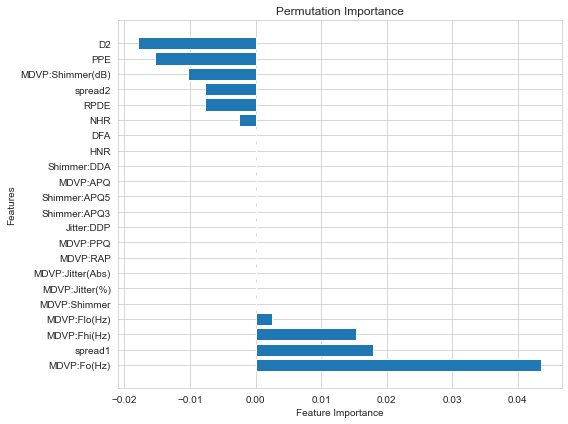

<Figure size 576x432 with 1 Axes>

In [ ]:
# Perform permutation importance
result_mlp = permutation_importance(clf_mlp, X_test_mlp, y_test_mlp, n_repeats=10, random_state=42)

# Get feature importance scores
importance_scores_mlp = result_mlp.importances_mean

# Sort features by importance score in descending order
sorted_indices_mlp = np.argsort(importance_scores_mlp)[::-1]
sorted_features_mlp = X_mlp.columns[sorted_indices_mlp]
sorted_scores_mlp = importance_scores_mlp[sorted_indices_mlp]

# Print feature importance
for feature_mlp, score_mlp in zip(sorted_features_mlp, sorted_scores_mlp):
    print("{}: {:.4f}".format(feature_mlp, score_mlp))

# Plot feature importance
plt.figure(figsize=(8, 6))
plt.barh(sorted_features_mlp, sorted_scores_mlp)
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.title('Permutation Importance')
plt.tight_layout()
plt.show()


Using 156 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.




  0%|          | 0/39 [00:00<?, ?it/s]

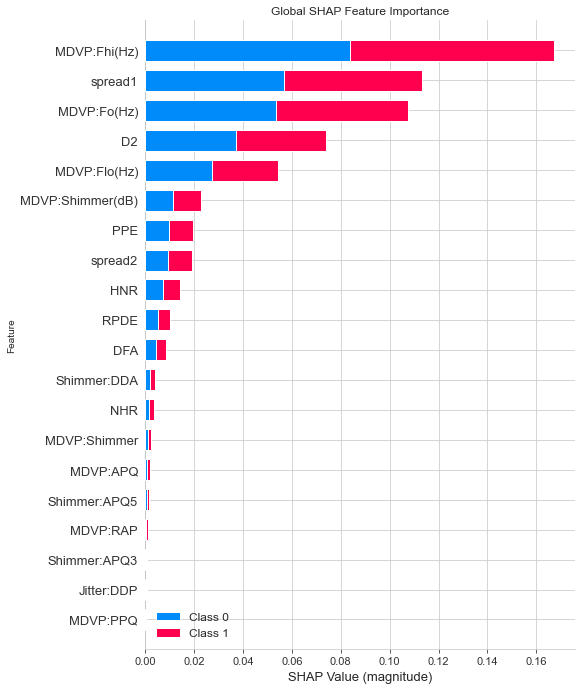

<Figure size 576x684 with 1 Axes>

In [ ]:
# Create a KernelExplainer object
explainer_mlp = shap.KernelExplainer(clf_mlp.predict_proba, X_train_mlp)

# Calculate SHAP values for all features
shap_values_mlp = explainer_mlp.shap_values(X_test_mlp)

# Plot the global SHAP summary plot
shap.summary_plot(shap_values_mlp, X_test_mlp, plot_type="bar", show=False)

# Set plot parameters
plt.title("Global SHAP Feature Importance")
plt.xlabel("SHAP Value (magnitude)")
plt.ylabel("Feature")

# Show the plot
plt.show()

Using 156 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.






<IPython.core.display.HTML object>

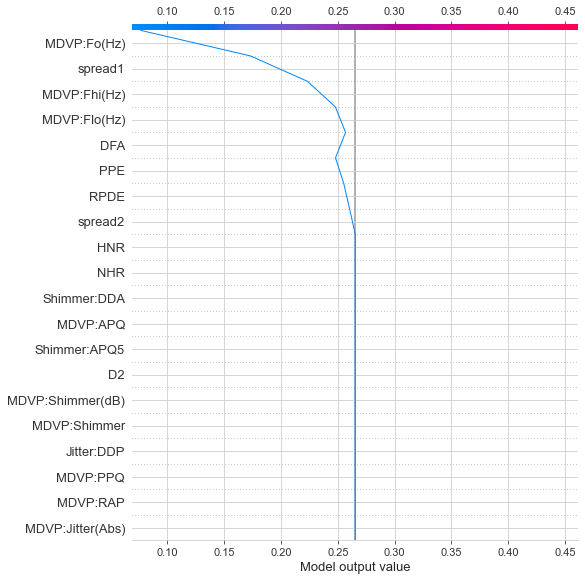

<Figure size 576x684 with 1 Axes>

<IPython.core.display.HTML object>

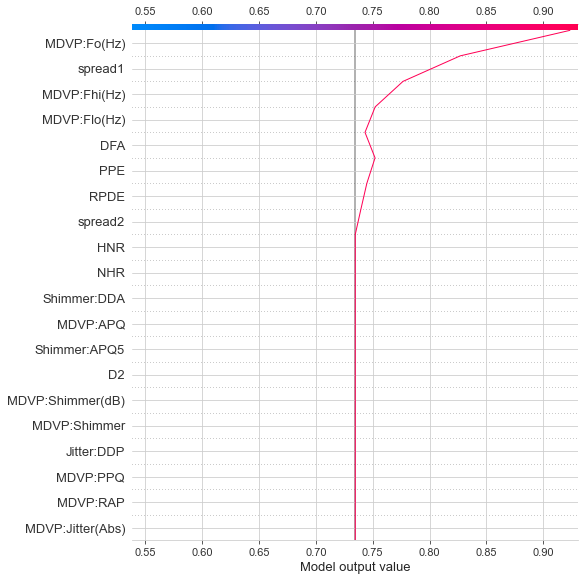

<Figure size 576x684 with 1 Axes>

In [ ]:
np.random.seed(36)
# Create explainer
explainer_mlp = shap.KernelExplainer(clf_mlp.predict_proba, X_train_mlp)

# Select the instance for generating the explanation
i_mlp = 1
data_for_prediction_mlp = X_test_mlp.iloc[i_mlp, :]

# Generate SHAP values for the negative instance
shap_values_mlp = explainer_mlp.shap_values(data_for_prediction_mlp)

# Set the class index for negative prediction
class_index_mlp = 0  

# Access the expected value for the negative class
expected_value_negative_mlp = explainer_mlp.expected_value[class_index_mlp]

# Access the SHAP values 
shap_values_negative_mlp = shap_values_mlp[class_index_mlp]

# Initialize the JS visualization
shap.initjs()



# Do the same for the positive class
shap.decision_plot(expected_value_negative_mlp, shap_values_negative_mlp, feature_names=X_test_mlp.columns.tolist())
class_index_mlp = 1  
expected_value_positive_mlp = explainer_mlp.expected_value[class_index_mlp]
shap_values_positive_mlp = shap_values_mlp[class_index_mlp]
shap.initjs()

# Create the decision plot 
shap.decision_plot(expected_value_positive_mlp, shap_values_positive_mlp, feature_names=X_test_mlp.columns.tolist())



## ALE 

             eff  size
MDVP:Fo(Hz)           
95.056       0.0   0.0
100.960      0.0   2.0
102.273      0.0   1.0
109.860      0.0   1.0
110.707      0.0   1.0
110.739      0.0   1.0
112.014      0.0   1.0
112.239      0.0   1.0
116.848      0.0   1.0
117.870      0.0   1.0
121.345      0.0   1.0
126.144      0.0   1.0
128.451      0.0   1.0
136.969      0.0   1.0
140.341      0.0   1.0
142.167      0.0   1.0
143.533      0.0   1.0
144.188      0.0   1.0
148.090      0.0   1.0
151.872      0.0   1.0
152.125      0.0   1.0
153.046      0.0   1.0
156.405      0.0   1.0
159.116      0.0   1.0
163.656      0.0   1.0
166.888      0.0   1.0
170.756      0.0   1.0
174.688      0.0   1.0
178.285      0.0   1.0
182.018      0.0   1.0
197.076      0.0   1.0
197.569      0.0   1.0
202.544      0.0   1.0
204.664      0.0   1.0
208.519      0.0   1.0
210.141      0.0   1.0
217.116      0.0   1.0
240.301      0.0   1.0
242.852      0.0   1.0
                   eff  size
MDVP:Fhi(Hz)                

PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Con

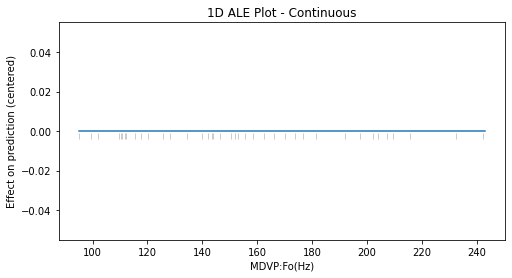

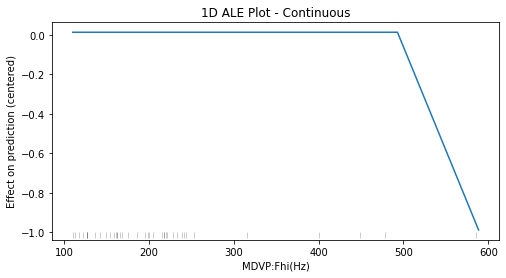

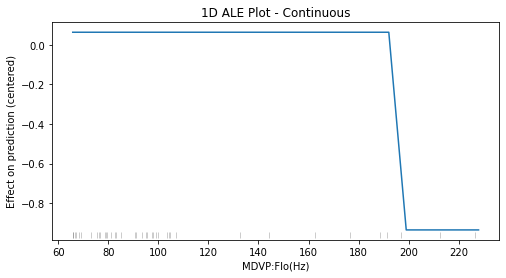

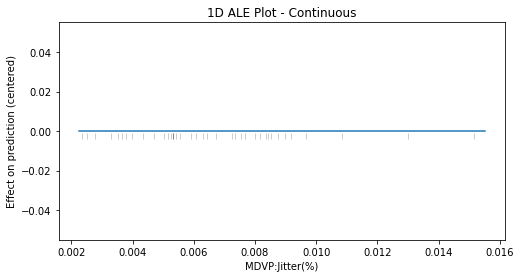

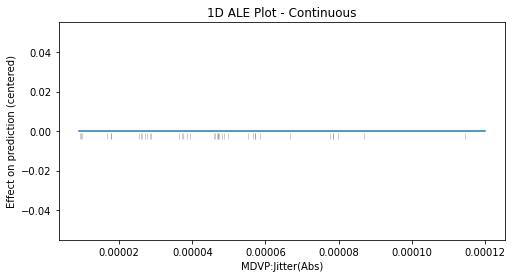

...

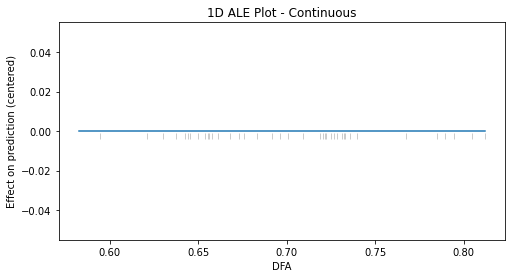

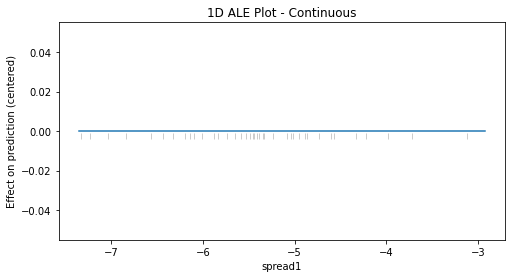

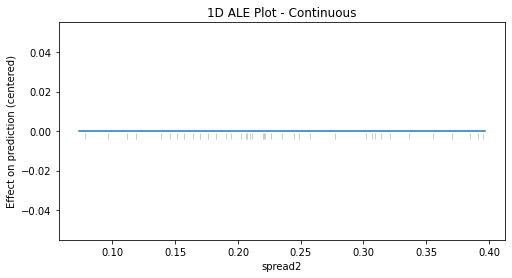

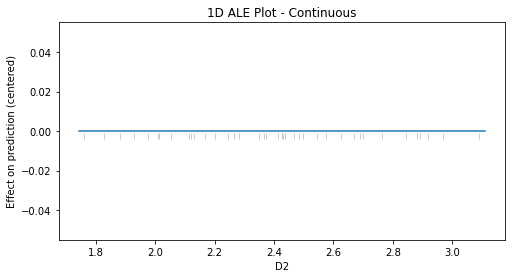

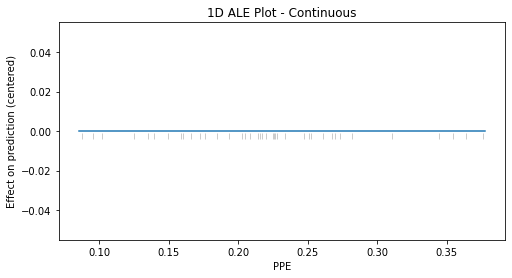

In [16]:
for feature in X_test_mlp.columns:
    ale_eff_mlp = ale(X=X_test_mlp, model=clf_mlp, feature=[feature], grid_size=50, include_CI=False)
    print(ale_eff_mlp)

## PDP 

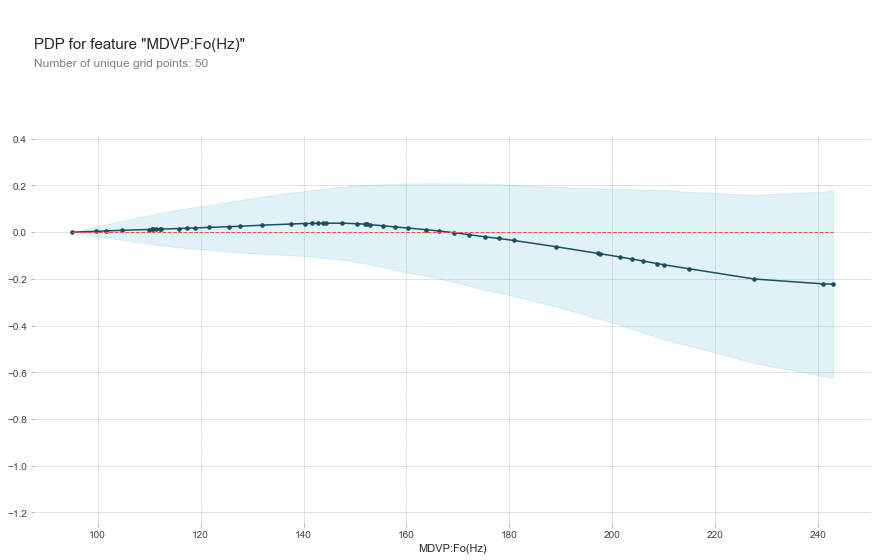

<Figure size 1080x684 with 2 Axes>

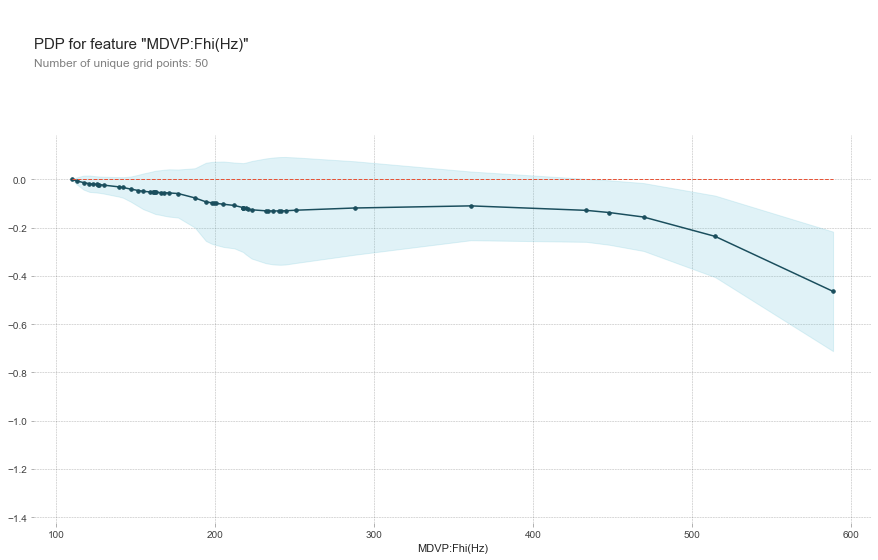

<Figure size 1080x684 with 2 Axes>

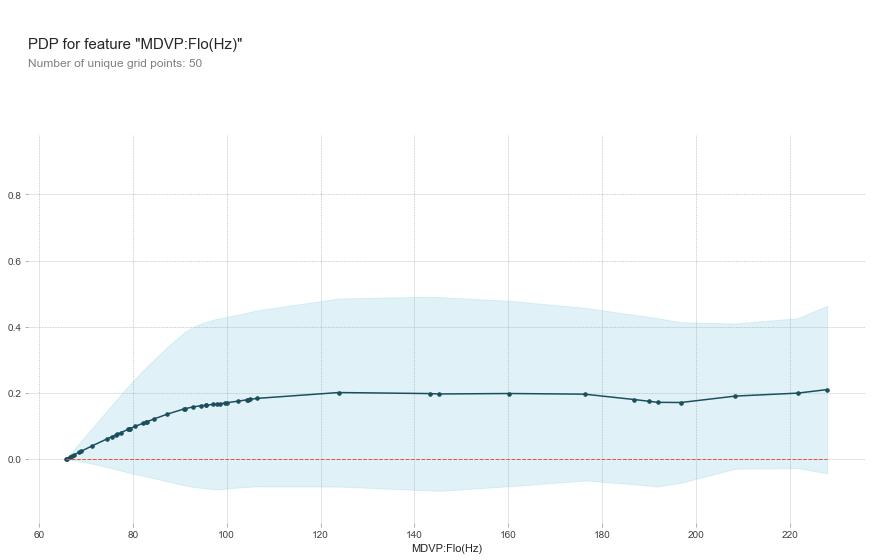

<Figure size 1080x684 with 2 Axes>

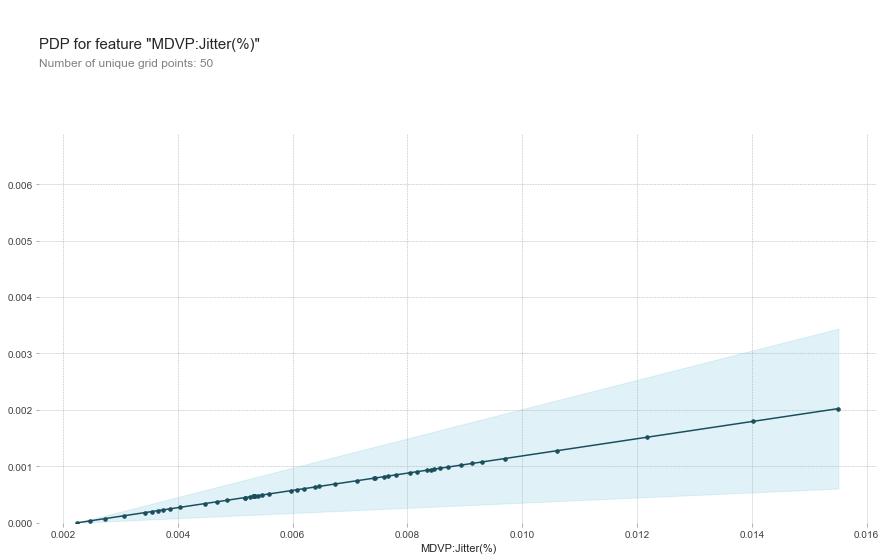

<Figure size 1080x684 with 2 Axes>

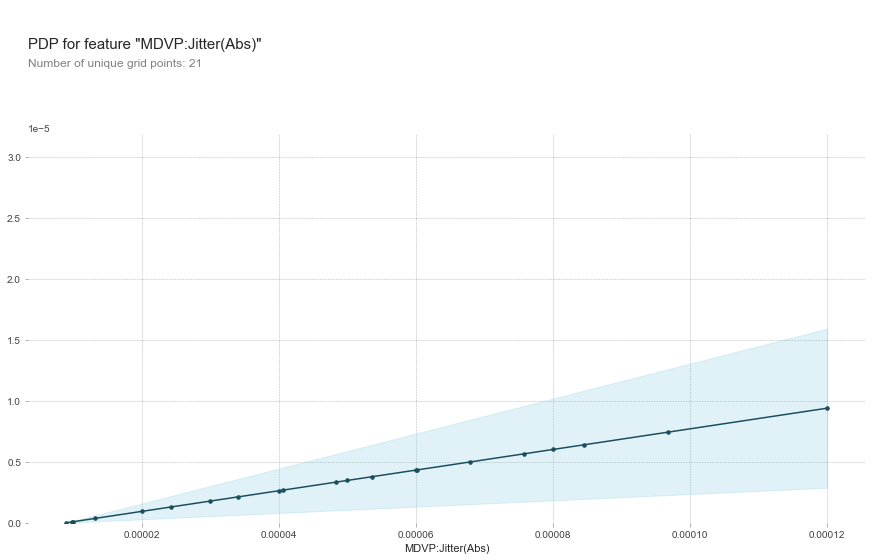

<Figure size 1080x684 with 2 Axes>

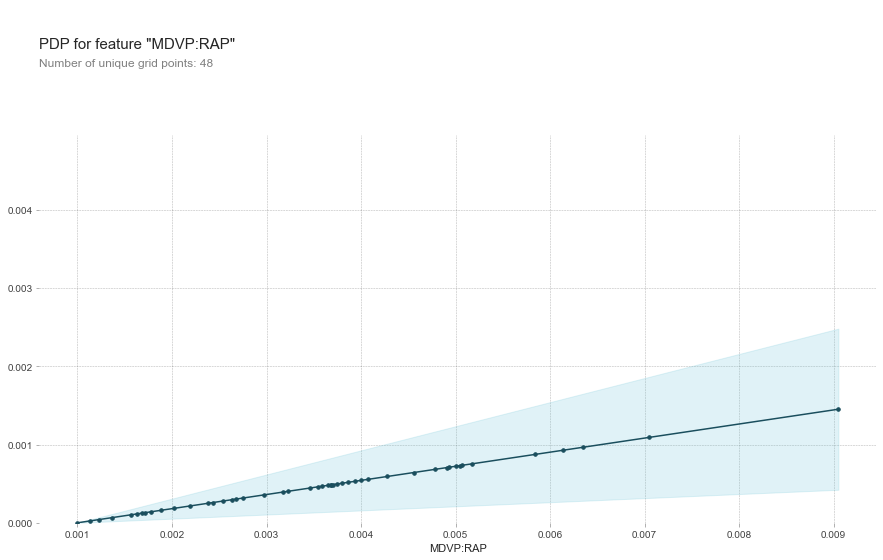

<Figure size 1080x684 with 2 Axes>

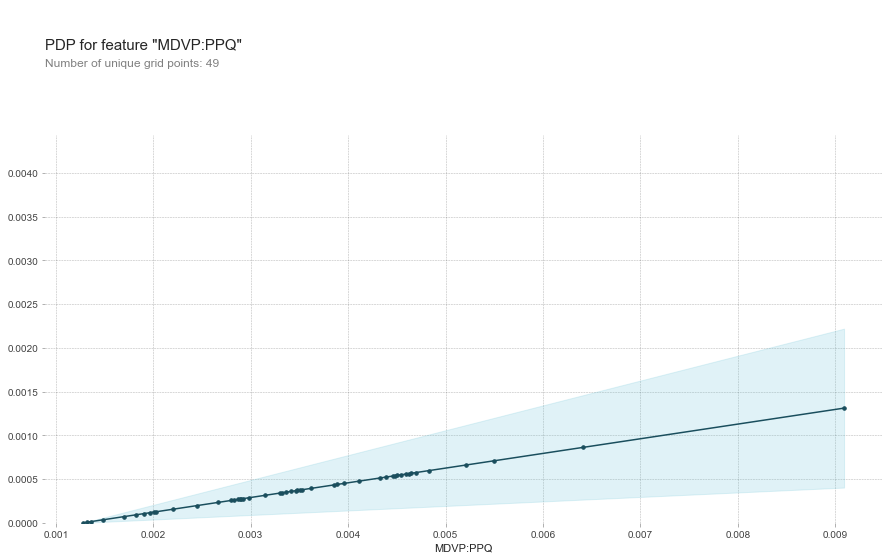

<Figure size 1080x684 with 2 Axes>

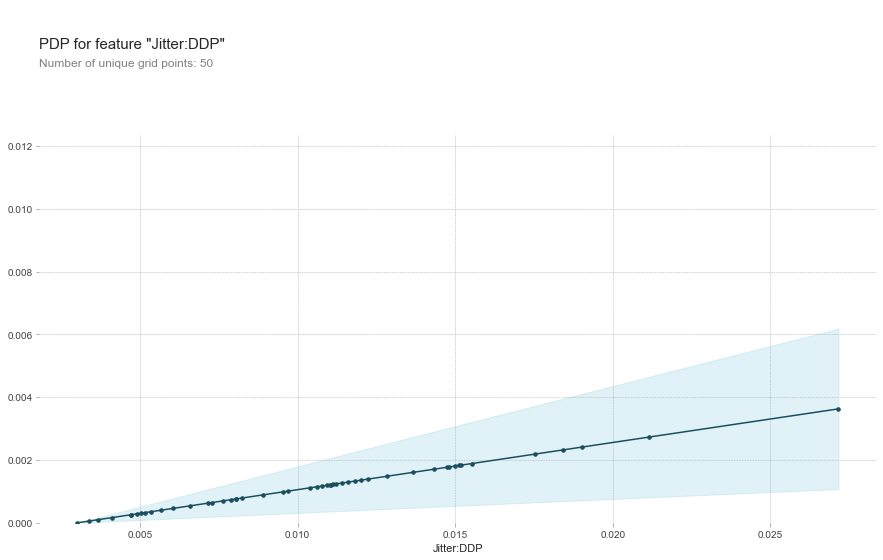

<Figure size 1080x684 with 2 Axes>

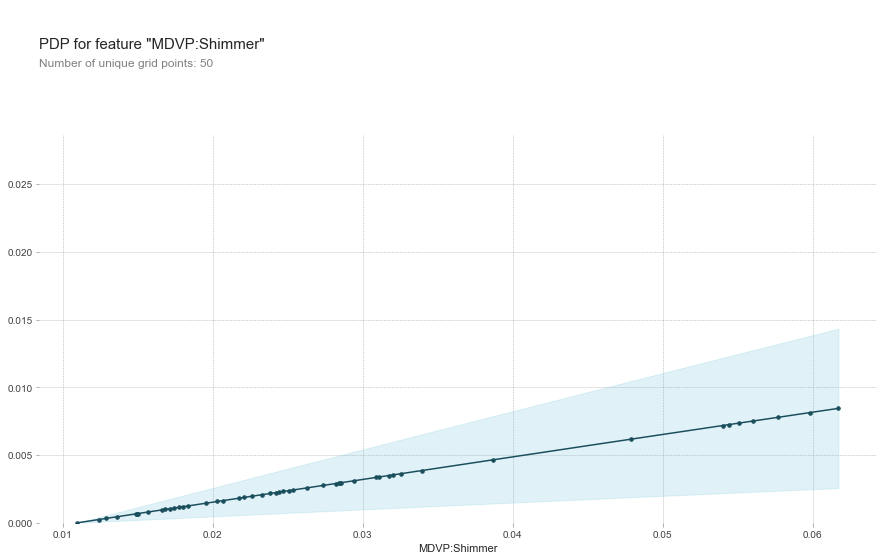

<Figure size 1080x684 with 2 Axes>

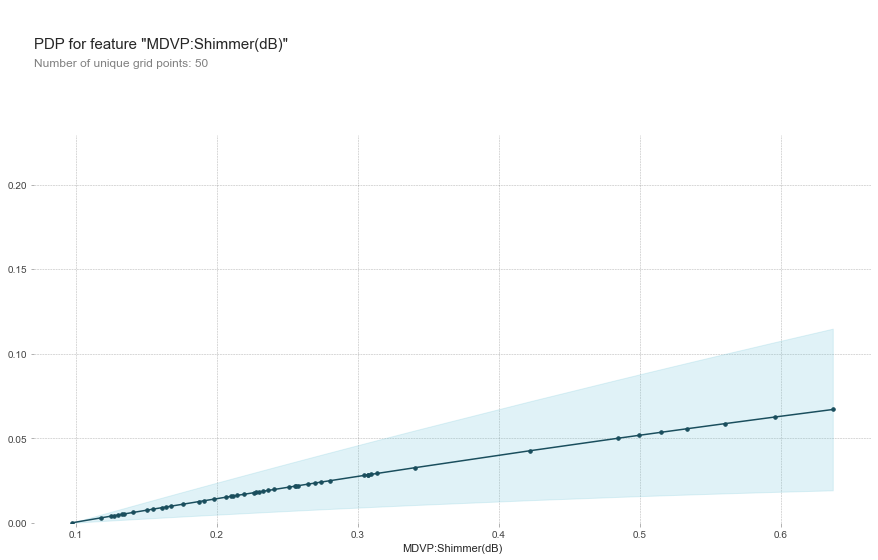

<Figure size 1080x684 with 2 Axes>

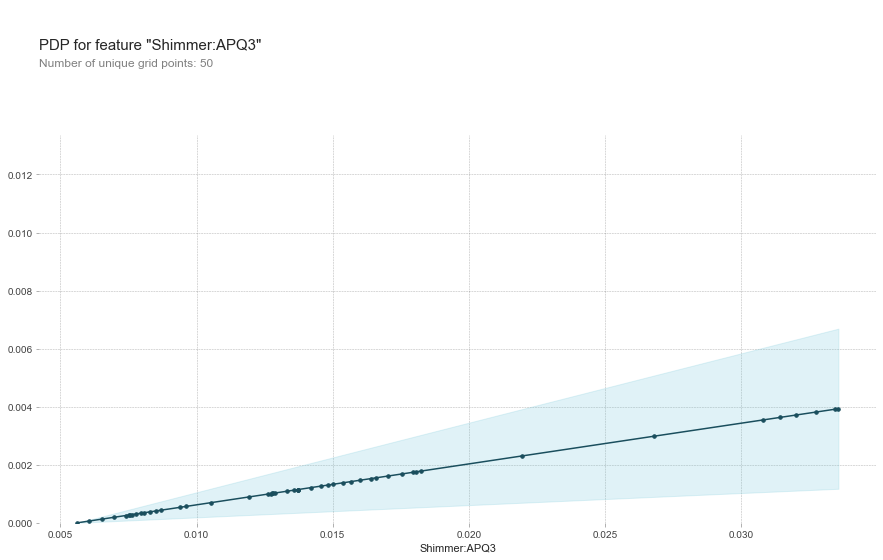

<Figure size 1080x684 with 2 Axes>

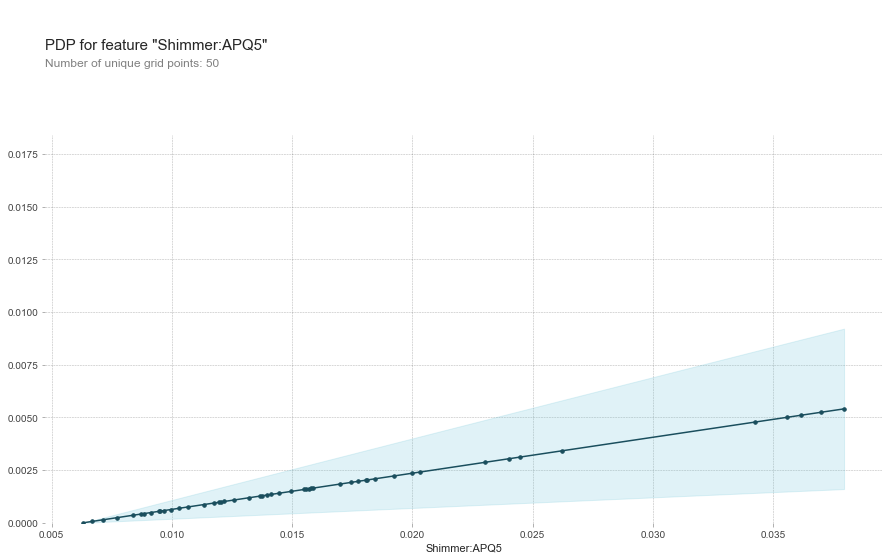

<Figure size 1080x684 with 2 Axes>

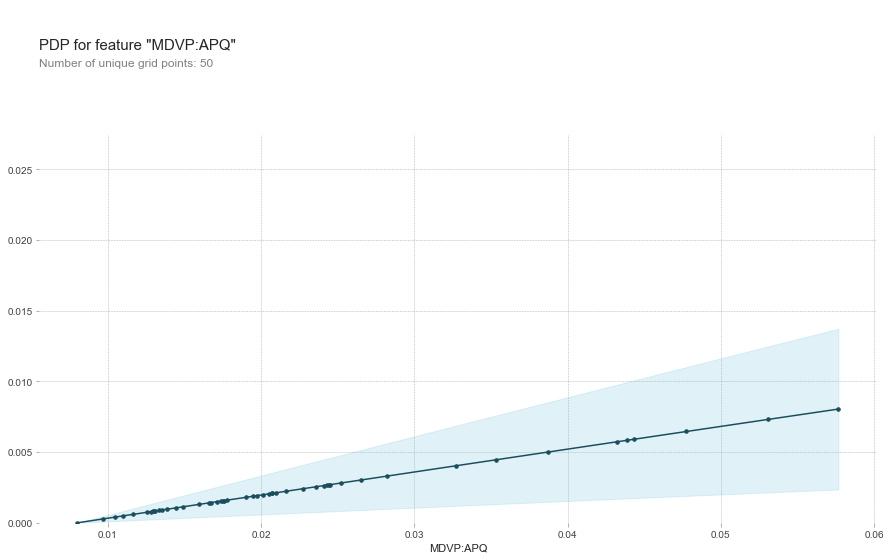

<Figure size 1080x684 with 2 Axes>

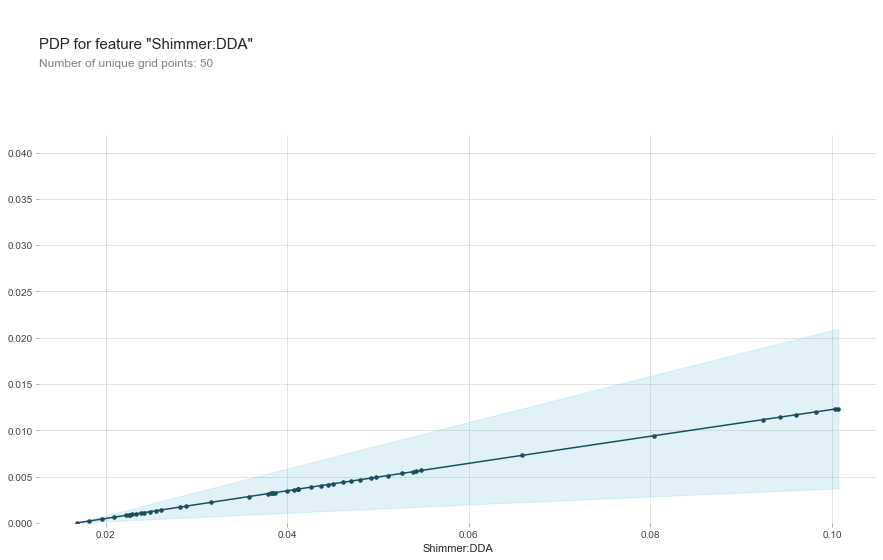

<Figure size 1080x684 with 2 Axes>

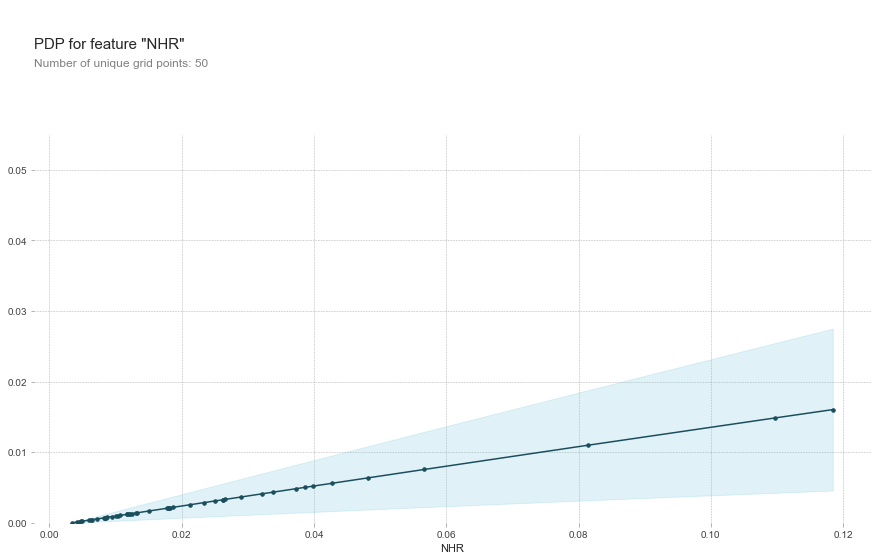

<Figure size 1080x684 with 2 Axes>

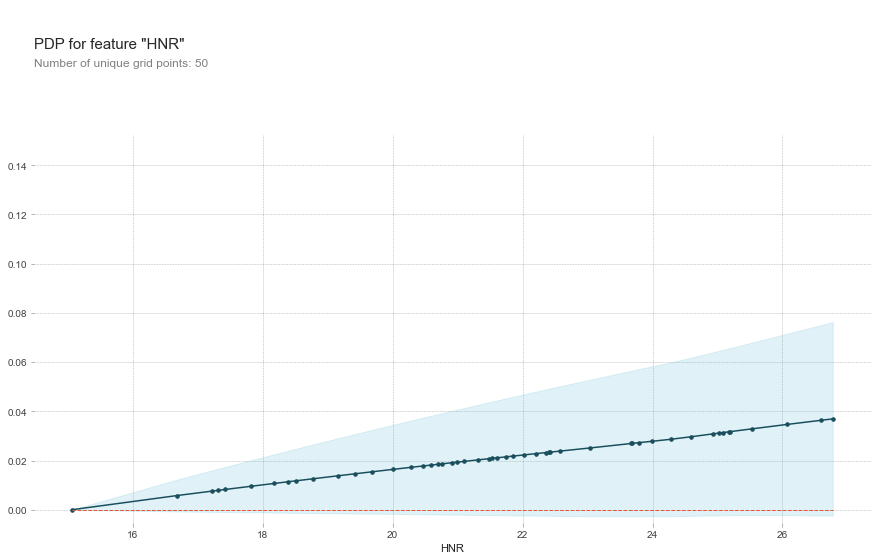

<Figure size 1080x684 with 2 Axes>

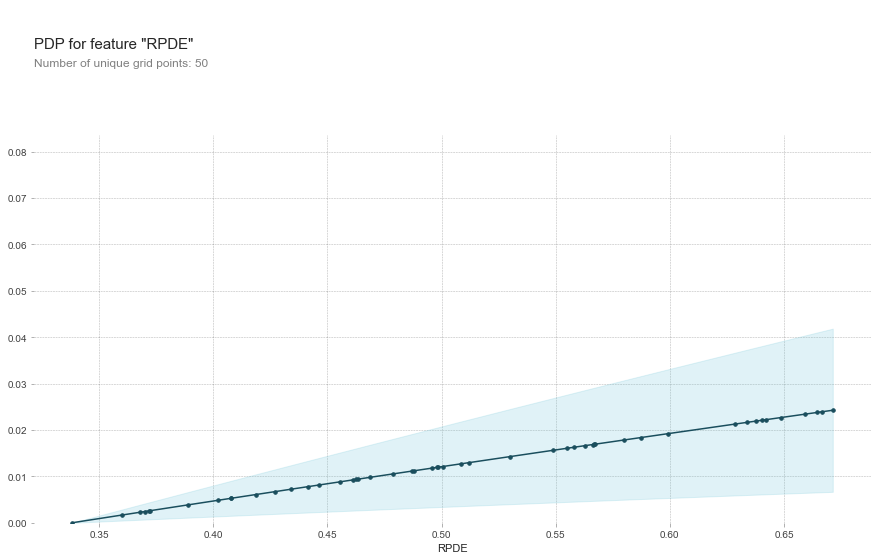

<Figure size 1080x684 with 2 Axes>

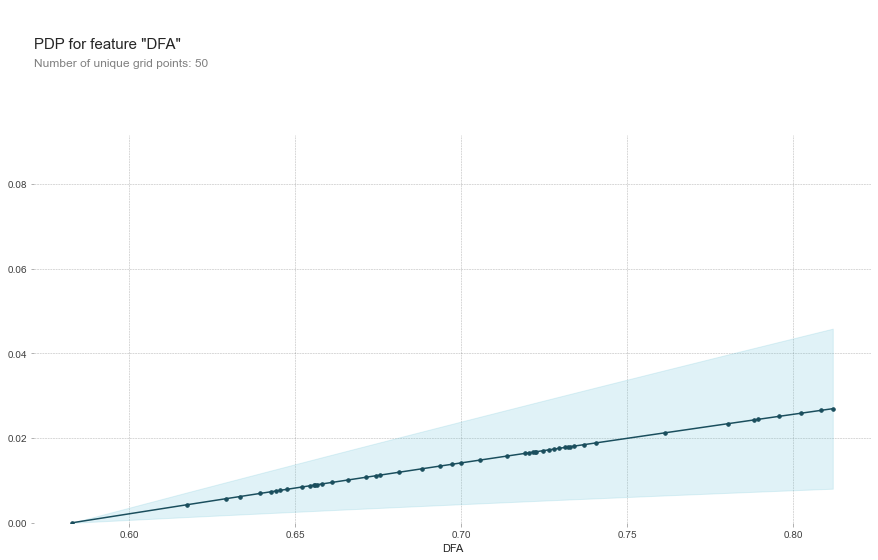

<Figure size 1080x684 with 2 Axes>

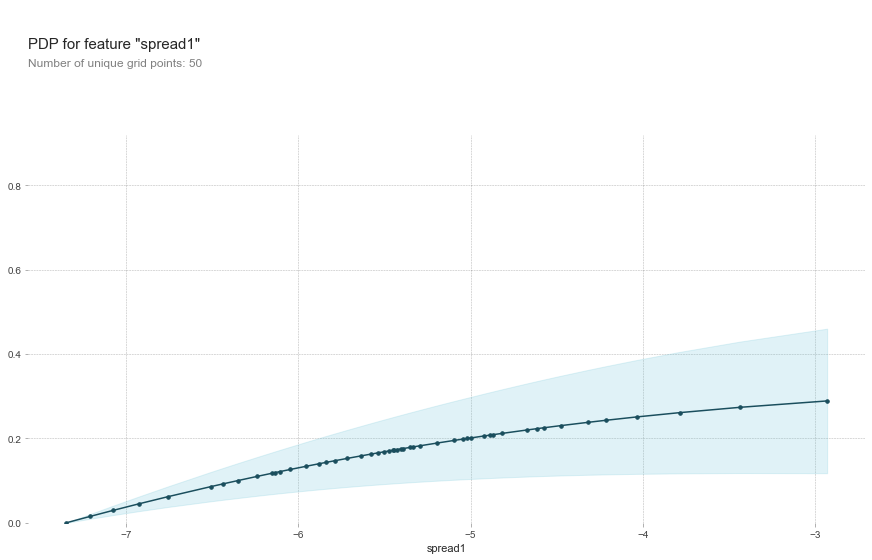

<Figure size 1080x684 with 2 Axes>

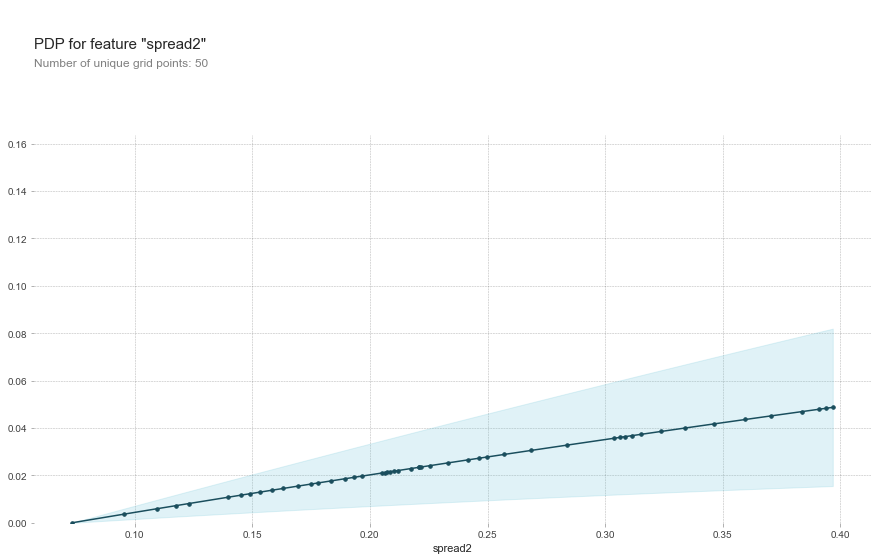

<Figure size 1080x684 with 2 Axes>

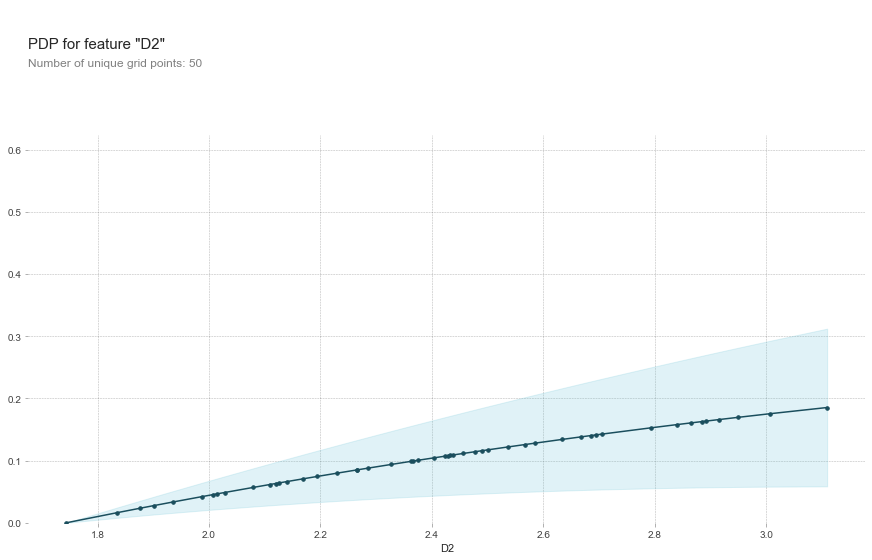

<Figure size 1080x684 with 2 Axes>

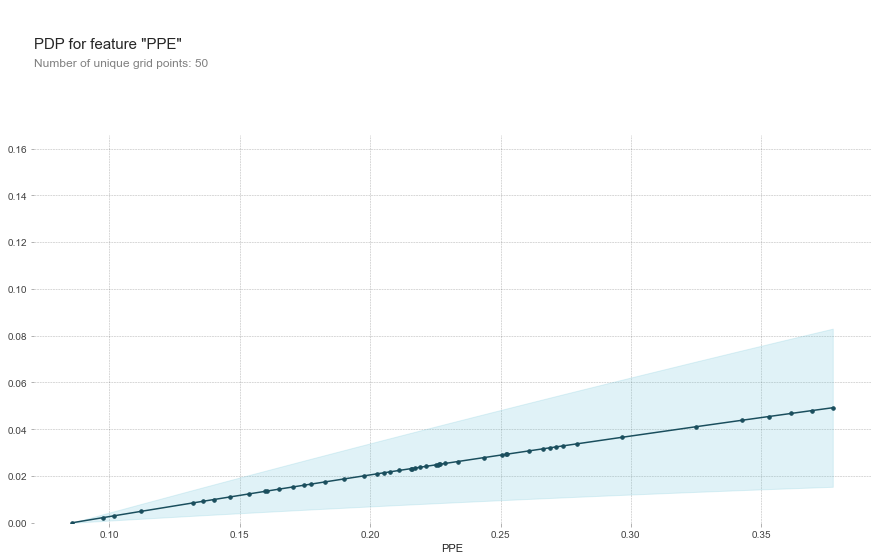

<Figure size 1080x684 with 2 Axes>

In [ ]:
# Iterate over each feature and plot the pdp curve
for feature_name in X_test_mlp.columns:
    # Calculate pdp data
    pdp_data_mlp_all = pdp.pdp_isolate(model=clf_mlp, dataset=X_test_mlp, model_features=X_test_mlp.columns, feature=feature_name,num_grid_points = 50)

    # Plot pdp curve
    pdp.pdp_plot(pdp_data_mlp_all, feature_name)
    plt.show()

# SVM

In [17]:
X_svm = df.drop(['name', 'status'], axis=1)
y_svm = df['status']

# Split the dataset into training and testing sets
X_train_svm, X_test_svm, y_train_svm, y_test_svm = train_test_split(X_svm, y_svm, test_size=0.3, random_state=42)

# Scale the features
scaler_svm = StandardScaler()
X_train_svm = pd.DataFrame(scaler_svm.fit_transform(X_train_svm), columns=X_train_svm.columns)
X_test_svm = pd.DataFrame(scaler_svm.transform(X_test_svm), columns=X_test_svm.columns)

# Create an SVM classifier with a radial basis function (RBF) kernel
clf_svm = SVC(kernel='rbf', random_state=42, probability=True)

# Train the SVM classifier
clf_svm.fit(X_train_svm, y_train_svm)

# Make predictions on the testing set
y_pred_svm = clf_svm.predict(X_test_svm)

# Calculate the accuracy of the model
accuracy_svm = accuracy_score(y_test_svm, y_pred_svm)
print("Accuracy: {:.2f}%".format(accuracy_svm * 100))

Accuracy: 88.14%


# Permutation Importance¶

MDVP:Fo(Hz): 0.0678
spread1: 0.0441
spread2: 0.0424
PPE: 0.0339
MDVP:Flo(Hz): 0.0305
MDVP:Fhi(Hz): 0.0220
DFA: 0.0203
D2: 0.0203
HNR: 0.0136
MDVP:APQ: 0.0068
MDVP:PPQ: 0.0000
MDVP:Jitter(%): 0.0000
MDVP:Jitter(Abs): 0.0000
MDVP:RAP: 0.0000
MDVP:Shimmer: 0.0000
Jitter:DDP: 0.0000
MDVP:Shimmer(dB): 0.0000
Shimmer:APQ5: 0.0000
Shimmer:DDA: 0.0000
NHR: 0.0000
Shimmer:APQ3: 0.0000
RPDE: -0.0169



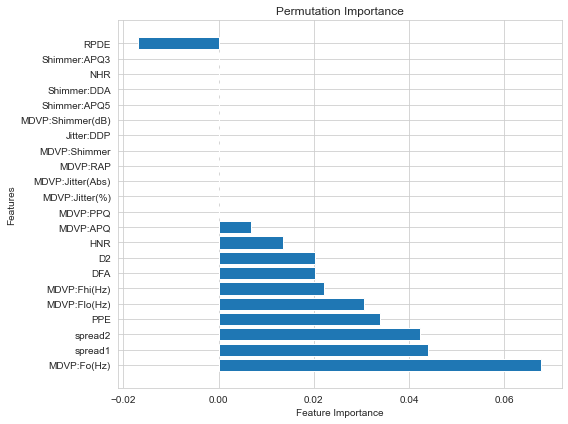

<Figure size 576x432 with 1 Axes>

In [ ]:
# Perform permutation importance
result_svm = permutation_importance(clf_svm, X_test_svm, y_test_svm, n_repeats=10, random_state=42)

# Get feature importance scores
importance_scores_svm = result_svm.importances_mean

# Sort features by importance score in descending order
sorted_indices_svm = np.argsort(importance_scores_svm)[::-1]
sorted_features_svm = X_svm.columns[sorted_indices_svm]
sorted_scores_svm = importance_scores_svm[sorted_indices_svm]

# Print feature importance
for feature_svm, score_svm in zip(sorted_features_svm, sorted_scores_svm):
    print("{}: {:.4f}".format(feature_svm, score_svm))

# Plot feature importance
plt.figure(figsize=(8, 6))
plt.barh(sorted_features_svm, sorted_scores_svm)
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.title('Permutation Importance')
plt.tight_layout()
plt.show()

## SHAP

Using 136 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.




  0%|          | 0/59 [00:00<?, ?it/s]

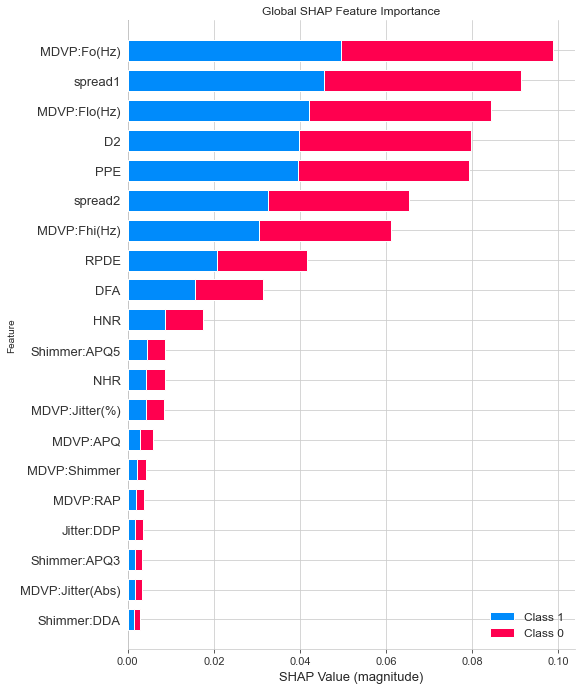

<Figure size 576x684 with 1 Axes>

In [ ]:
# Create a KernelExplainer object
explainer_svm = shap.KernelExplainer(clf_svm.predict_proba, X_train_svm)

# Calculate SHAP values for all features
shap_values_svm = explainer_svm.shap_values(X_test_svm)

# Plot the global SHAP summary plot
shap.summary_plot(shap_values_svm, X_test_svm, plot_type="bar", show=False)

# Set plot parameters
plt.title("Global SHAP Feature Importance")
plt.xlabel("SHAP Value (magnitude)")
plt.ylabel("Feature")

# Show the plot
plt.show()


[array([-0.03412842,  0.08800499, -0.04375776,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.00212637,  0.        ,
        0.        ,  0.00246027,  0.        ,  0.        , -0.0013975 ,
       -0.00383865,  0.0353858 ,  0.02915877, -0.04055922, -0.03468742,
       -0.00456644, -0.03541754]), array([ 0.03412842, -0.08800499,  0.04375776,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        , -0.00212637,  0.        ,
        0.        , -0.00246027,  0.        ,  0.        ,  0.0013975 ,
        0.00383865, -0.0353858 , -0.02915877,  0.04055922,  0.03468742,
        0.00456644,  0.03541754])]






Using 136 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.







<IPython.core.display.HTML object>

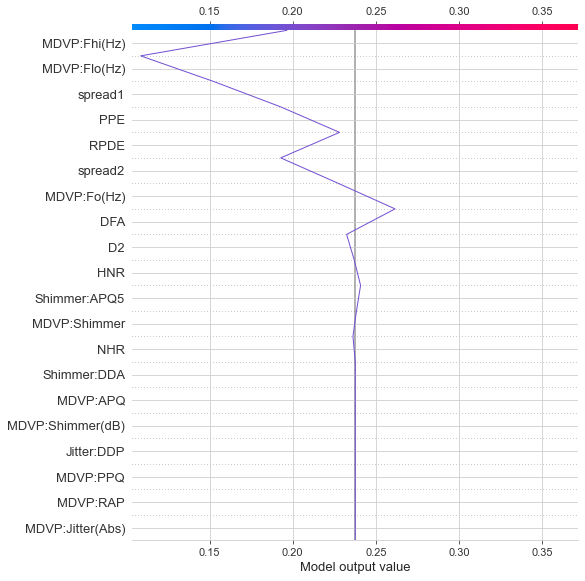

<Figure size 576x684 with 1 Axes>

<IPython.core.display.HTML object>

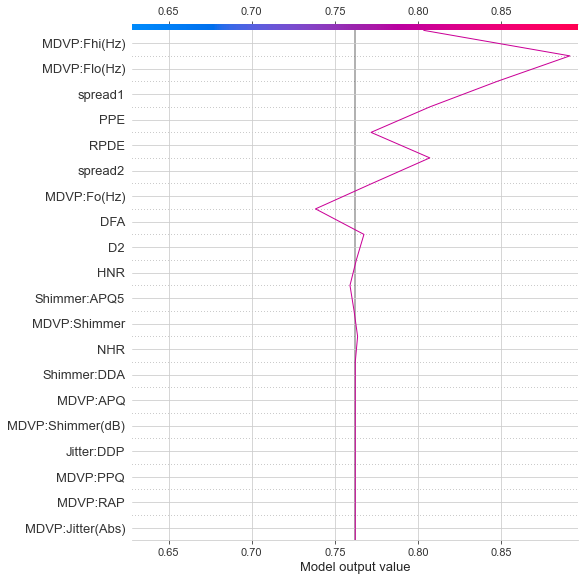

<Figure size 576x684 with 1 Axes>

In [ ]:
np.random.seed(36)
# Create explainer
explainer_svm = shap.KernelExplainer(clf_svm.predict_proba, X_train_svm)

# Select the instance for generating the explanation
i_svm = 1
data_for_prediction_svm = X_test_svm.iloc[i_svm, :]

# Generate SHAP values for the instance
shap_values_svm = explainer_svm.shap_values(data_for_prediction_svm)
print(shap_values_svm)
# Set the class index for negative prediction
class_index_svm = 0  

# Access the expected value 
expected_value_negative_svm = explainer_svm.expected_value[class_index_svm]

# Access the SHAP values 
shap_values_negative_svm = shap_values_svm[class_index_svm]

# Initialize the JS visualization
shap.initjs()



# Positive Class
shap.decision_plot(expected_value_negative_svm, shap_values_negative_svm, feature_names=X_test_svm.columns.tolist())


class_index_svm = 1  
expected_value_positive_svm = explainer_svm.expected_value[class_index_svm]
shap_values_positive_svm = shap_values_svm[class_index_svm]
shap.initjs()

# Create the decision plot 
shap.decision_plot(expected_value_positive_svm, shap_values_positive_svm, feature_names=X_test_svm.columns.tolist())

## ALE 

             eff  size
MDVP:Fo(Hz)           
-1.430138    0.0   0.0
-1.421976    0.0   2.0
-1.283663    0.0   1.0
-1.251088    0.0   1.0
-1.062859    0.0   1.0
-1.049040    0.0   1.0
-1.048147    0.0   1.0
-1.041051    0.0   2.0
-1.009419    0.0   1.0
-1.003837    0.0   1.0
-0.988033    0.0   1.0
-0.975033    0.0   1.0
-0.889490    0.0   1.0
-0.797596    0.0   2.0
-0.777922    0.0   1.0
-0.658861    0.0   1.0
-0.653899    0.0   1.0
-0.614552    0.0   1.0
-0.601626    0.0   1.0
-0.360006    0.0   2.0
-0.306641    0.0   1.0
-0.261339    0.0   1.0
-0.227449    0.0   1.0
-0.211199    0.0   1.0
-0.114393    0.0   1.0
-0.020563    0.0   1.0
 0.008563    0.0   2.0
 0.032306    0.0   1.0
 0.091898    0.0   1.0
 0.117750    0.0   1.0
 0.159157    0.0   1.0
 0.244799    0.0   1.0
 0.351976    0.0   2.0
 0.447939    0.0   1.0
 0.533085    0.0   1.0
 0.545490    0.0   1.0
 0.634729    0.0   1.0
 0.701541    0.0   1.0
 1.100924    0.0   2.0
 1.113155    0.0   1.0
 1.209788    0.0   1.0
 1.236582  

PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Con

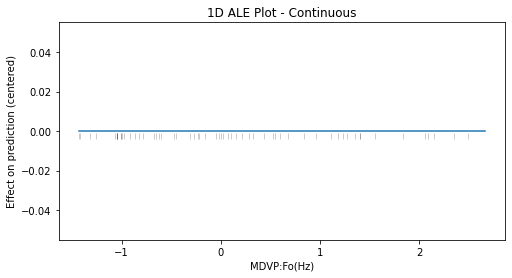

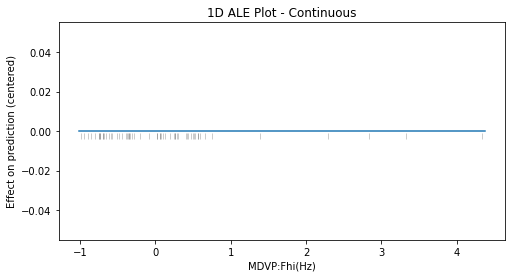

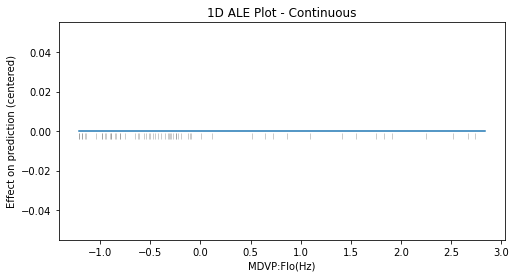

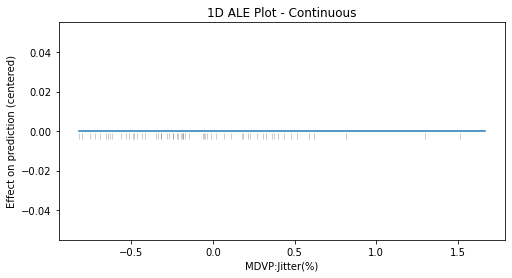

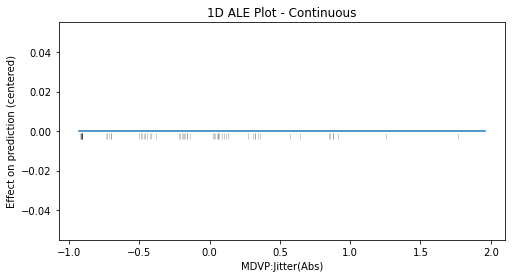

...

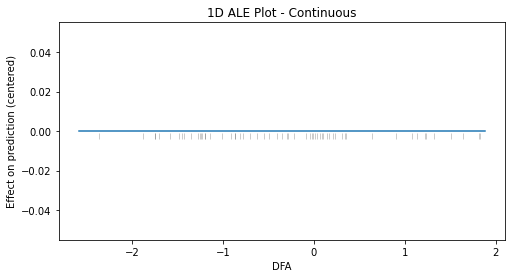

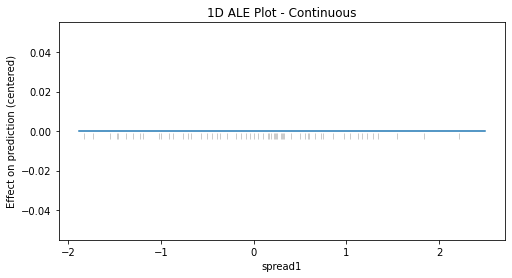

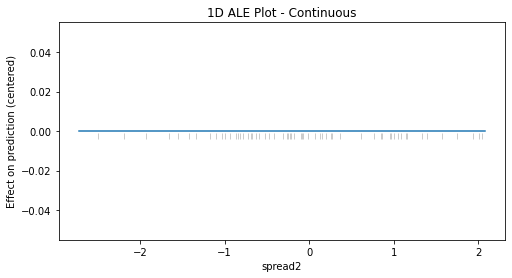

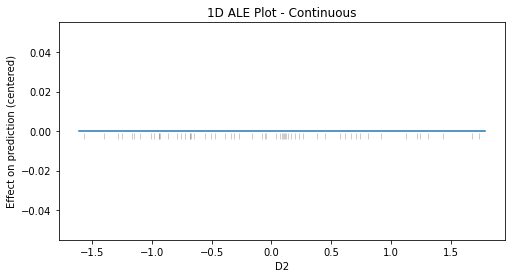

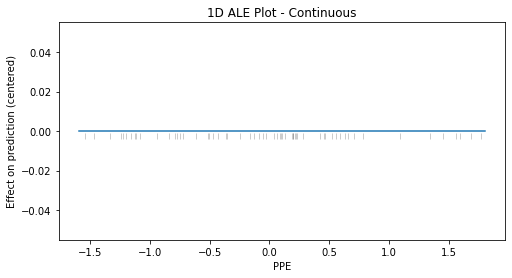

In [18]:
X_test_svm = pd.DataFrame(X_test_svm)

for feature in X_test_svm.columns:
    ale_eff_svm = ale(X=X_test_svm, model=clf_svm, feature=[feature], grid_size=50, include_CI=False)
    print(ale_eff_svm)

## PDP 

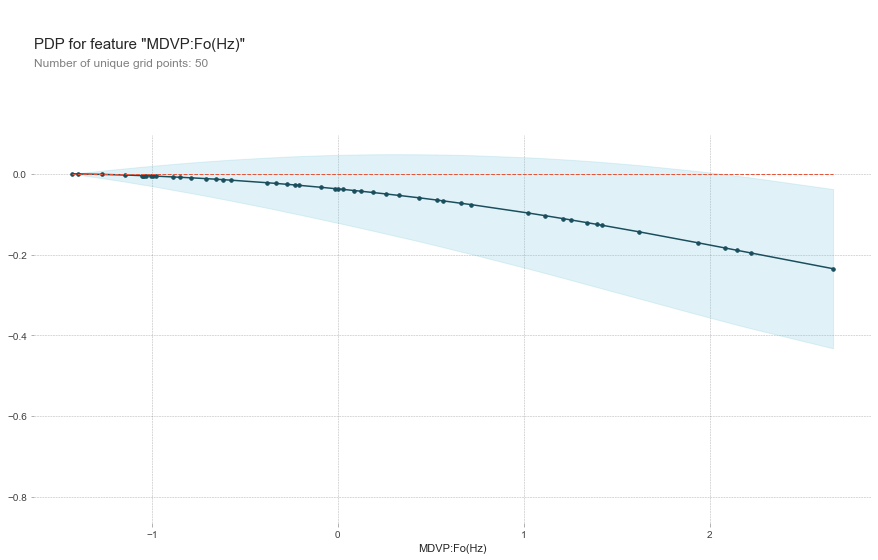

<Figure size 1080x684 with 2 Axes>

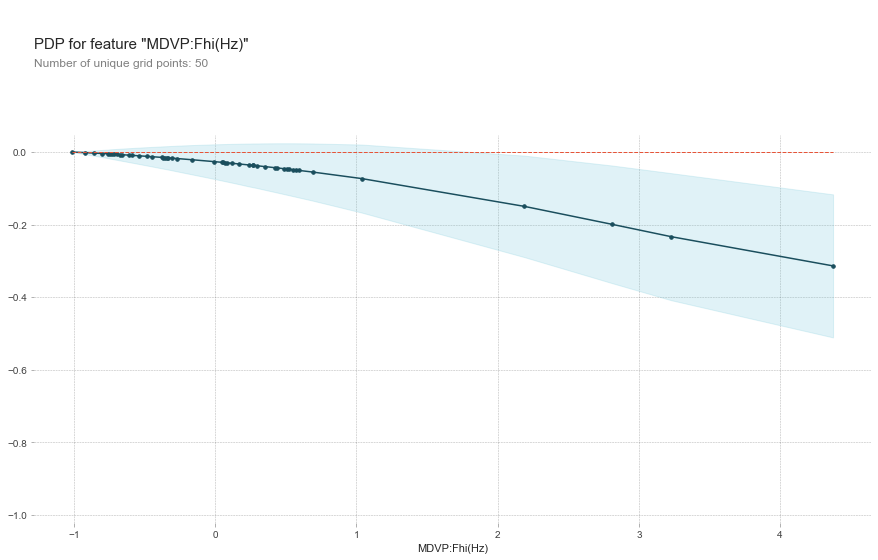

<Figure size 1080x684 with 2 Axes>

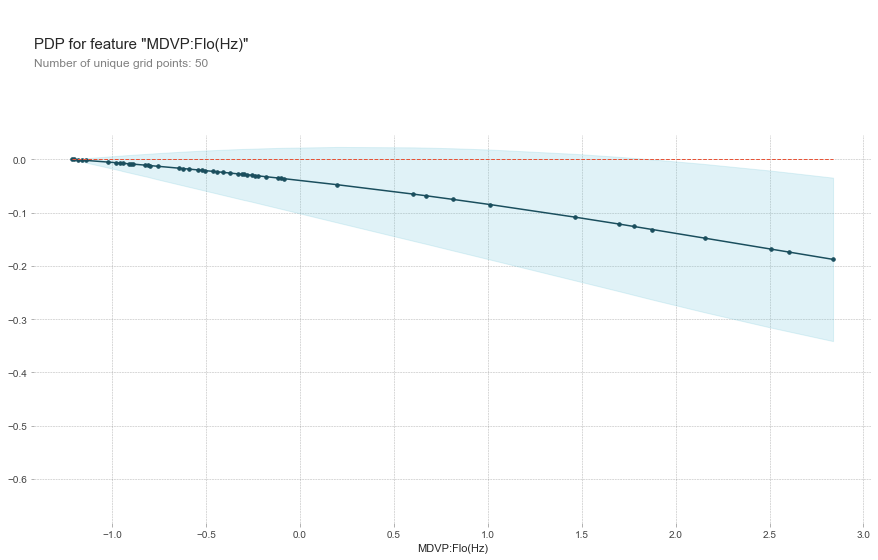

<Figure size 1080x684 with 2 Axes>

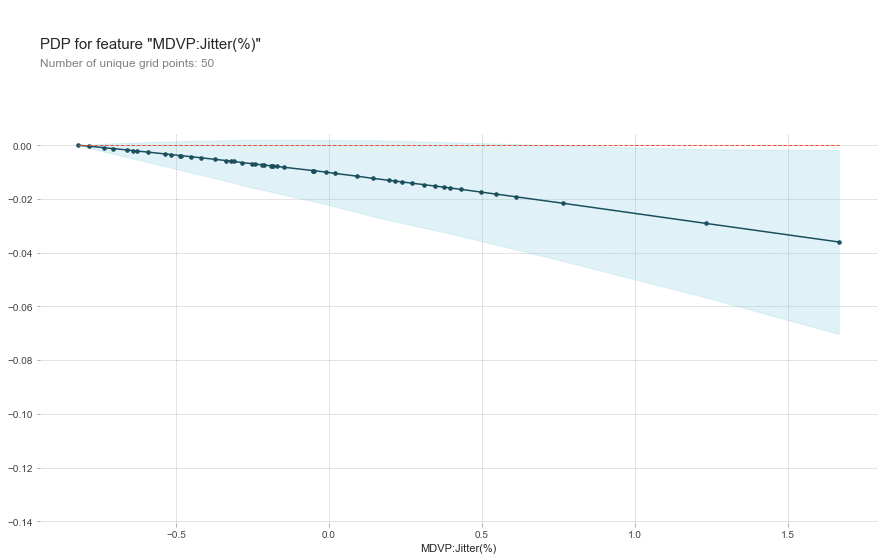

<Figure size 1080x684 with 2 Axes>

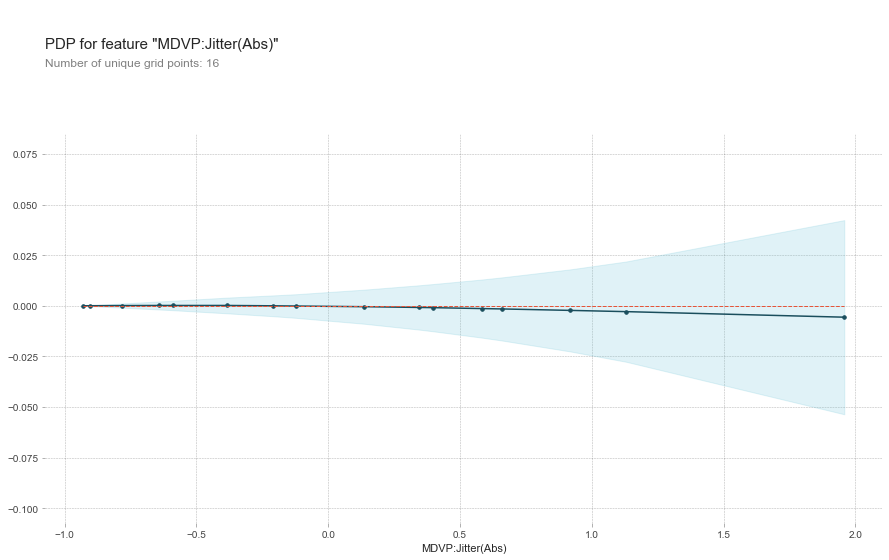

<Figure size 1080x684 with 2 Axes>

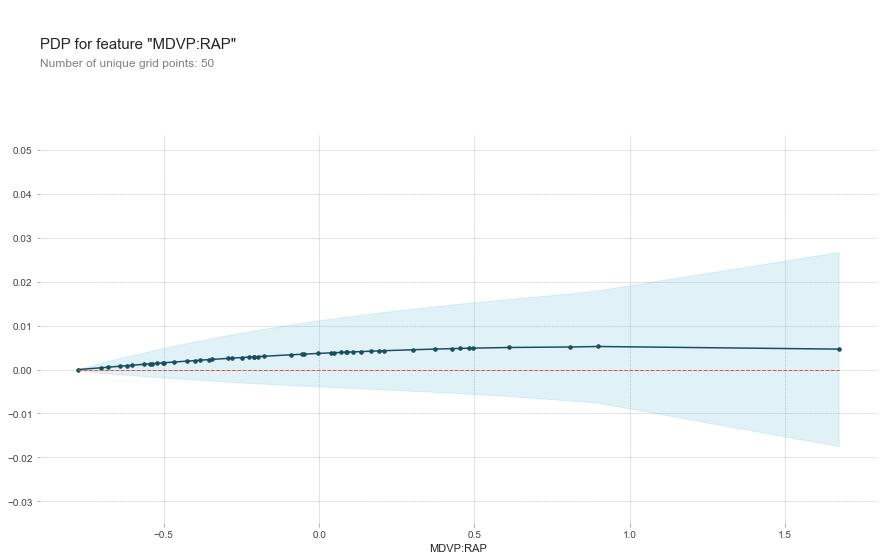

<Figure size 1080x684 with 2 Axes>

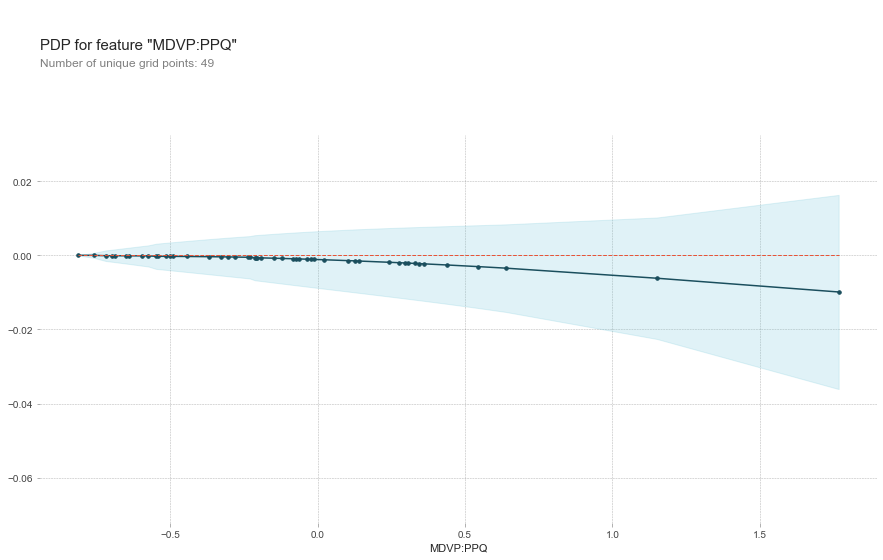

<Figure size 1080x684 with 2 Axes>

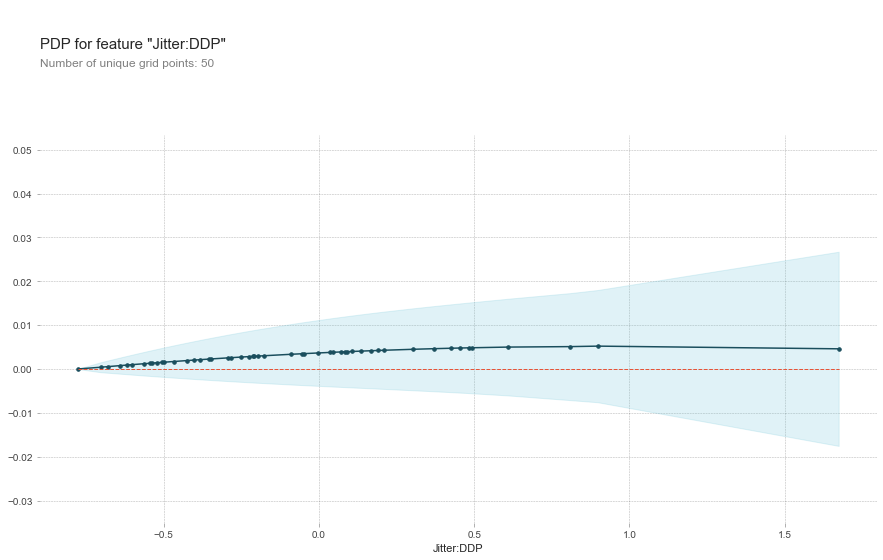

<Figure size 1080x684 with 2 Axes>

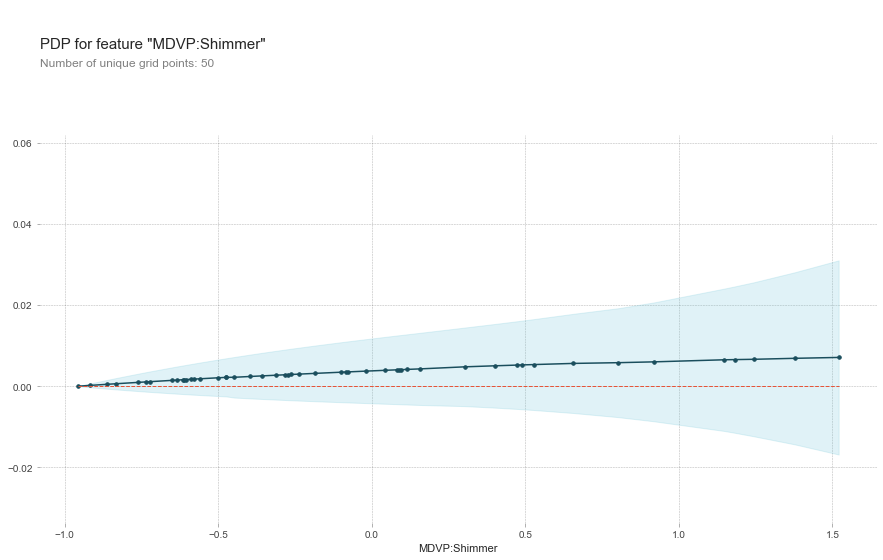

<Figure size 1080x684 with 2 Axes>

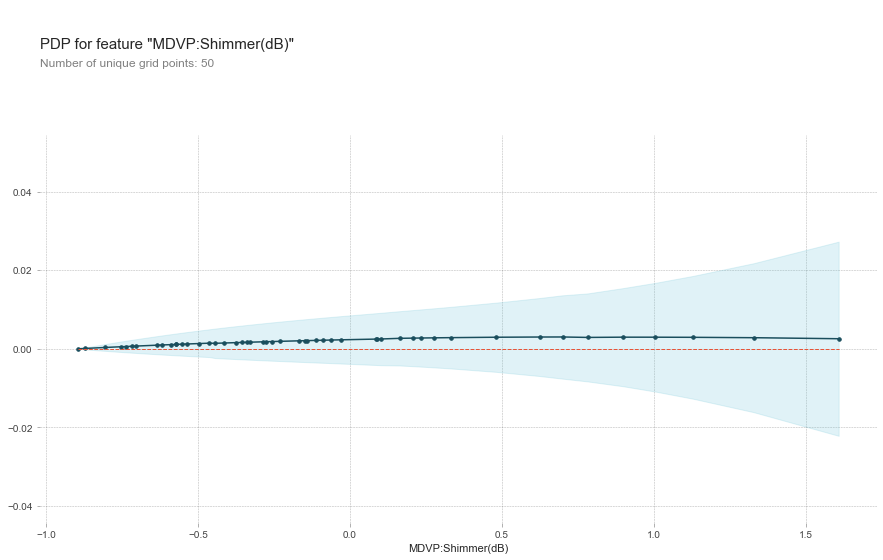

<Figure size 1080x684 with 2 Axes>

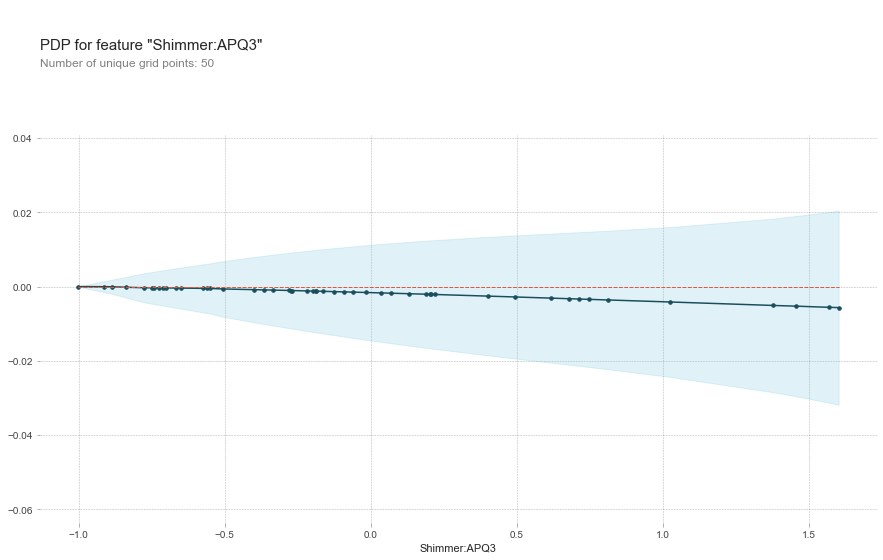

<Figure size 1080x684 with 2 Axes>

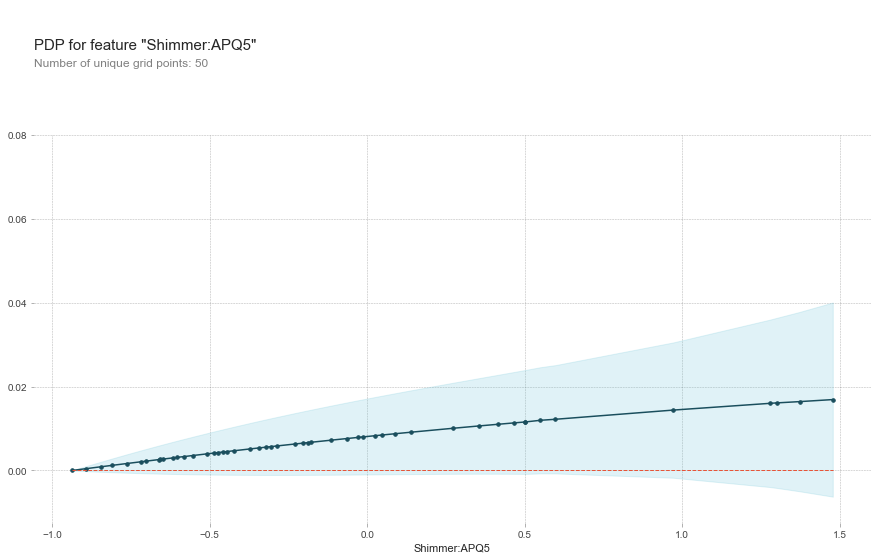

<Figure size 1080x684 with 2 Axes>

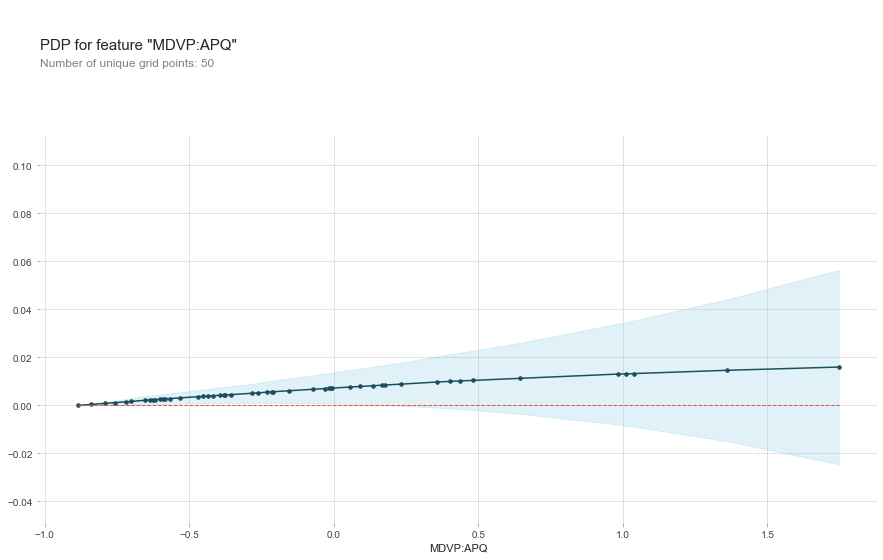

<Figure size 1080x684 with 2 Axes>

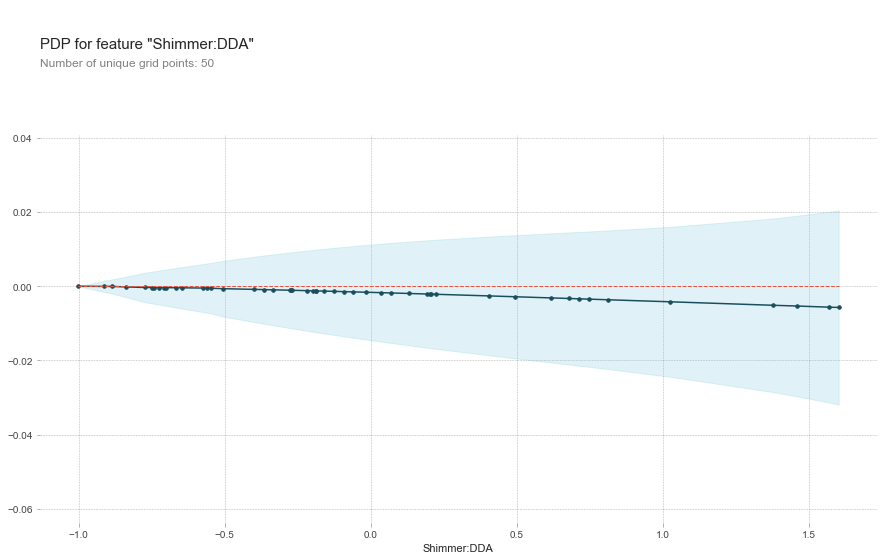

<Figure size 1080x684 with 2 Axes>

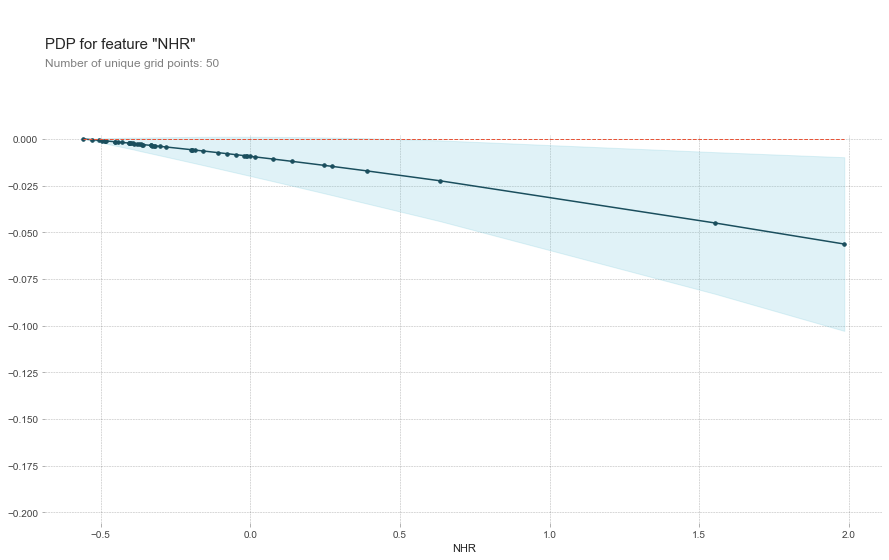

<Figure size 1080x684 with 2 Axes>

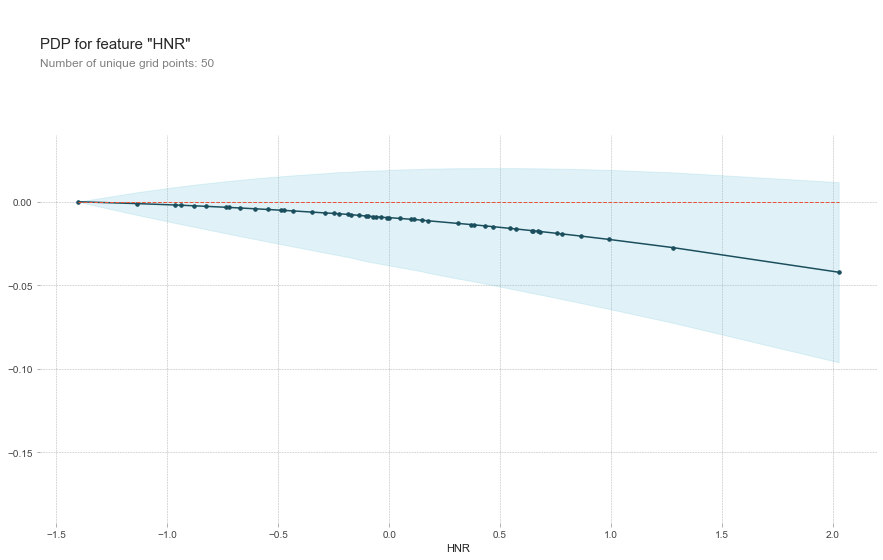

<Figure size 1080x684 with 2 Axes>

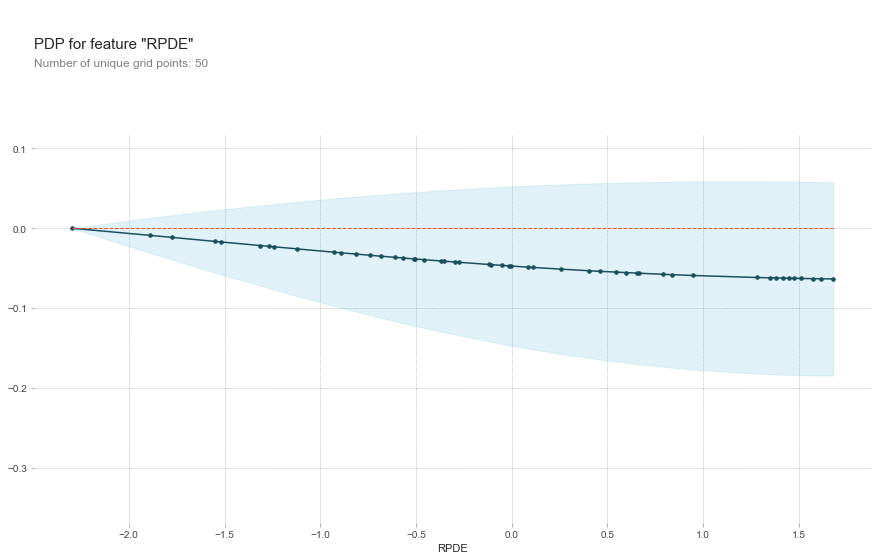

<Figure size 1080x684 with 2 Axes>

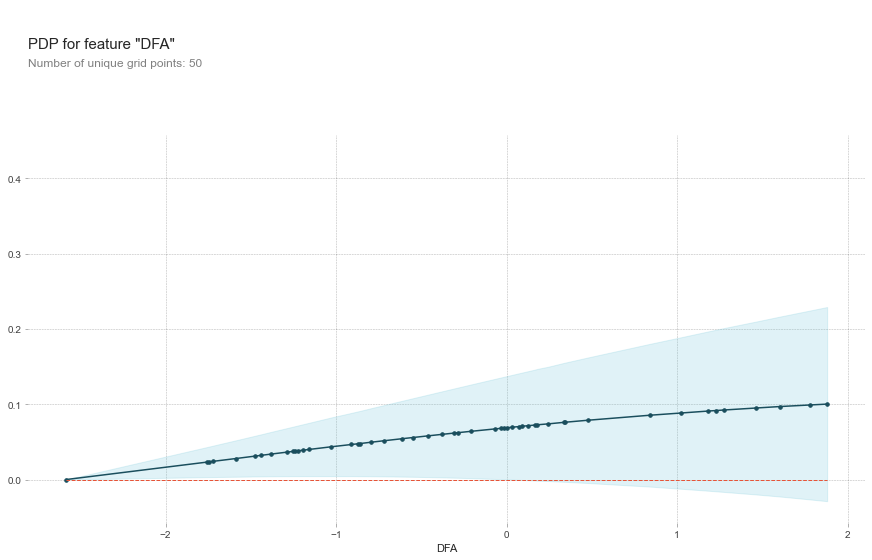

<Figure size 1080x684 with 2 Axes>

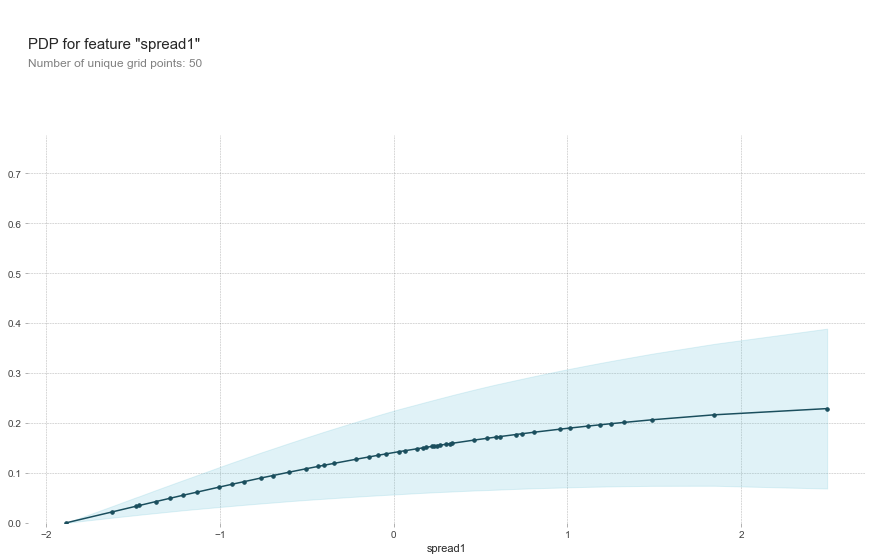

<Figure size 1080x684 with 2 Axes>

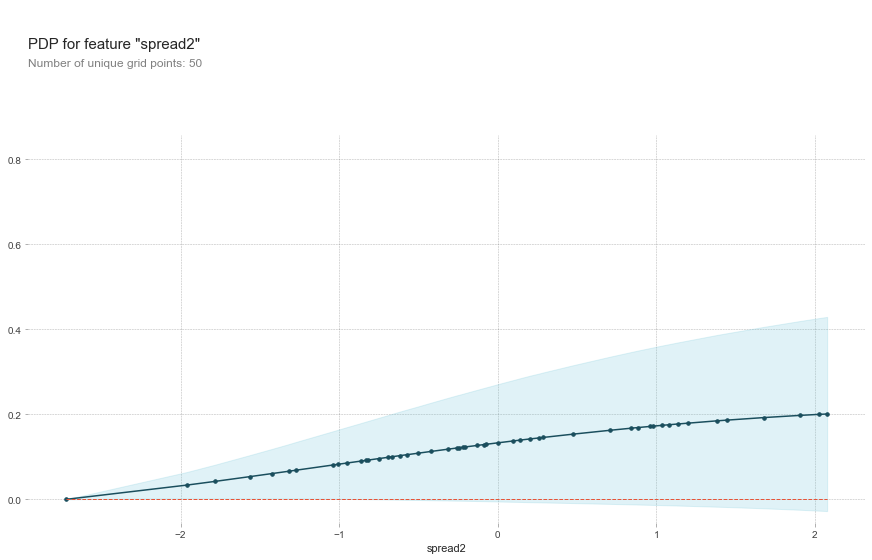

<Figure size 1080x684 with 2 Axes>

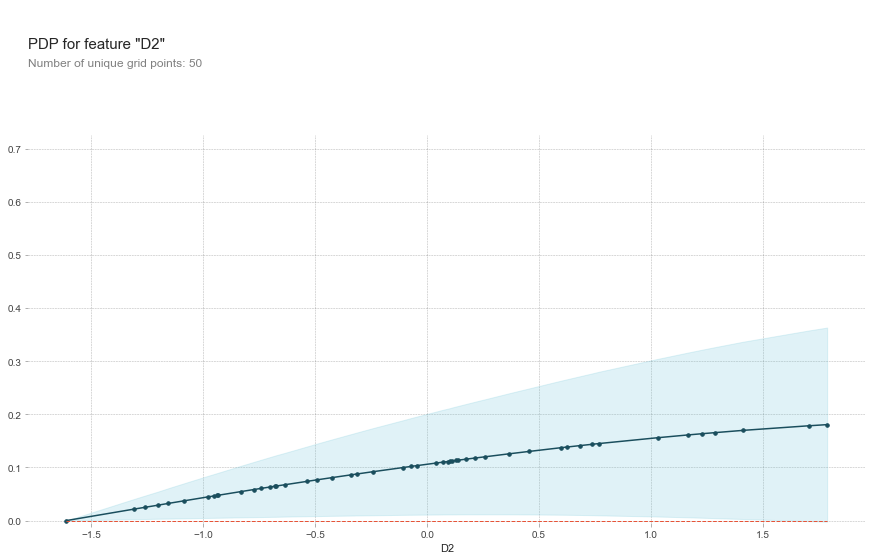

<Figure size 1080x684 with 2 Axes>

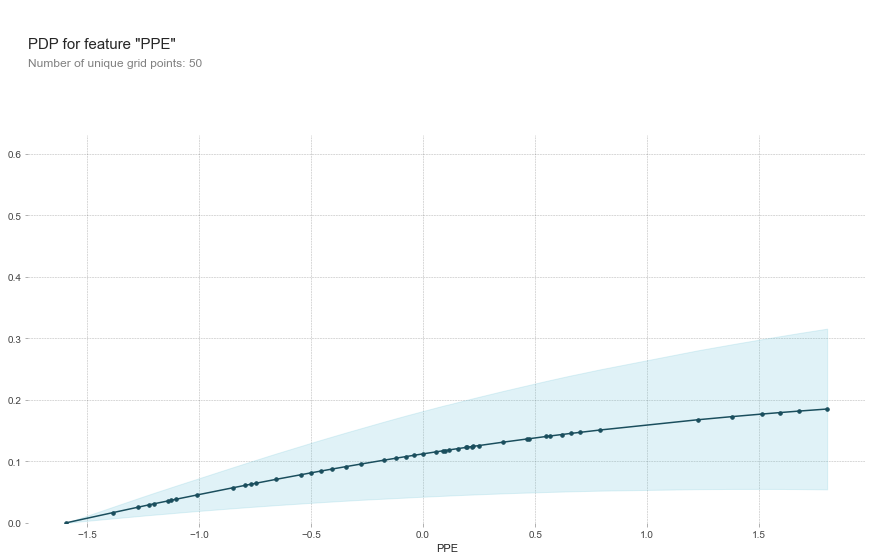

<Figure size 1080x684 with 2 Axes>

In [ ]:
# Iterate over each feature and plot the pdp curve
for feature_name in X_test_svm.columns:
    # Calculate pdp data
    pdp_data_svm_all = pdp.pdp_isolate(model=clf_svm, dataset=X_test_svm, model_features=X_test_svm.columns, feature=feature_name,num_grid_points = 50)

    # Plot pdp curve
    pdp.pdp_plot(pdp_data_svm_all, feature_name)
    plt.show()

# K means

In [8]:
# Extract the features and target variable
X_km = df.drop(['name', 'status'], axis=1)
y_km = df['status']

# Standardize the features while preserving the DataFrame structure
scaler_km = StandardScaler()
X_km = pd.DataFrame(scaler_km.fit_transform(X_km), columns=X_km.columns)

# Split the data into training and test sets
X_train_km, X_test_km, y_train_km, y_test_km = train_test_split(X_km, y_km, test_size=0.2, random_state=42)

# Perform K-means clustering
n_clusters = 7 # Adjust the number of clusters 
clf_km = KMeans(n_clusters=n_clusters, random_state=42)
clf_km.fit(X_train_km)

# Assign labels to cluster centers based on majority class of training data
cluster_centers = clf_km.cluster_centers_
cluster_labels = []

for i, cluster_center in enumerate(cluster_centers):
    cluster_instances = y_train_km[clf_km.labels_ == i]
    majority_class = cluster_instances.value_counts().idxmax()
    cluster_labels.append(majority_class)

print(cluster_labels)

# Calculate the majority label in each cluster
parkinsons_count_km = y_train_km.sum()
cluster_counts_km = pd.Series(clf_km.predict(X_train_km)).value_counts()
parkinsons_per_cluster_km = [
    cluster_counts_km[i] * (y_train_km.iloc[clf_km.labels_ == i].sum() / cluster_counts_km[i])
    for i in range(len(cluster_counts_km))
]
print(parkinsons_per_cluster_km)
print("Cluster Sizes:", cluster_counts_km)


# Wrapper class for K-means model
class KMeansWrapper:
    def __init__(self, kmeans_model, cluster_labels):
        self.model = kmeans_model
        self.cluster_labels = cluster_labels
    
    def predict(self, X):
        # Get the distances between test data and cluster centers
        distances = self.model.transform(X)
        #print (distances)
        
        # Assign the labels based on the closest cluster center
        #cluster_labels = self.model.predict(X)
        closest_cluster_labels = []
        
        for i in range(len(X)):
            closest_cluster_index = np.argmin(distances[i])
            closest_cluster_label = self.cluster_labels[closest_cluster_index]
            closest_cluster_labels.append(closest_cluster_label)
        
        return closest_cluster_labels
    
    def predict_proba(self, X): # work with clusters
        # Get the distances between test data and cluster centers
        distances = self.model.transform(X)
        
        # Find the closest cluster center for each instance
        closest_cluster_indices = np.argmin(distances, axis=1)
        
        # Assign the majority class label to each cluster center
        cluster_majority_labels = [self.cluster_labels[i] for i in closest_cluster_indices]
        
        # Calculate the probability estimates
        cluster_counts = np.bincount(closest_cluster_indices, minlength=n_clusters)
        probabilities = cluster_counts / len(closest_cluster_indices)
        
        # Create the probability array for each instance
        instance_probabilities = (closest_cluster_indices[:, np.newaxis] == np.arange(n_clusters)) * probabilities

        
        return instance_probabilities
    
    def predict_proba_binary(self, X):# Actually Use！， work with prediction
        # Get the distances between test data and cluster centers
        distances = self.model.transform(X)
    
        # Find the closest cluster center for each instance
        closest_cluster_indices = np.argmin(distances, axis=1)
    
        # Calculate the probability of belonging to class 1 for each instance
        cluster_probabilities = [1 if self.cluster_labels[i] == 1 else 0 for i in closest_cluster_indices]
    
        # Create the probability array for each instance
        instance_probabilities = np.array(cluster_probabilities)[:, np.newaxis]
    
        return instance_probabilities




# Create a wrapper instance for the K-means model
wrapped_model = KMeansWrapper(clf_km, cluster_labels)

# Predict the test set labels using the wrapper model
y_pred_km = wrapped_model.predict(X_test_km)

# Calculate the prediction accuracy
accuracy_km = accuracy_score(y_test_km, y_pred_km)
print(f"Accuracy: {accuracy_km}")

# Predict the test set probabilities using the wrapper model
y_pred_proba_km = wrapped_model.predict_proba(X_test_km)

# Display the predicted probabilities
#print("Predicted Probabilities:")
#print(y_pred_proba_km)

[1, 0, 1, 1, 1, 1, 1]
[17.0, 5.0, 32.0, 4.0, 12.0, 6.0, 39.0]
Cluster Sizes: 2    46
6    39
1    24
4    20
0    17
5     6
3     4
dtype: int64
Accuracy: 0.8717948717948718


| k (num of clusters)   | Accuracy| 
|:--------|:-------------|
| 2 |  82.05%      |    
| 3 |  82.05%      |   
| 4 |  82.05%      |  
| 5 |  84.61%         |  
| 6 |  84.61%      | 
| 7 |  87.18%      | 
| 8 |  74.36%      | 
| 9 |  71.79%      | 


## Permutation Importance 

MDVP:Fo(Hz): 30.5281
spread1: 28.8630
MDVP:Flo(Hz): 27.9963
MDVP:Shimmer: 27.9439
RPDE: 26.3712
Shimmer:APQ5: 25.5065
MDVP:Shimmer(dB): 25.3433
Shimmer:DDA: 25.1049
Shimmer:APQ3: 25.1031
MDVP:APQ: 24.6250
PPE: 22.7808
MDVP:Fhi(Hz): 21.1664
HNR: 20.2425
MDVP:Jitter(Abs): 19.1471
MDVP:PPQ: 11.2971
spread2: 10.8365
MDVP:Jitter(%): 10.4407
DFA: 9.8793
MDVP:RAP: 9.6486
Jitter:DDP: 9.6483
NHR: 9.2985
D2: 6.8350



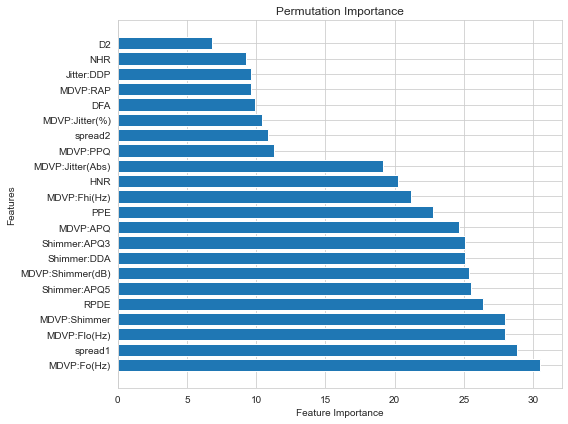

<Figure size 576x432 with 1 Axes>

In [ ]:
# Perform permutation importance
result_km = permutation_importance(clf_km, X_test_km, y_test_km, n_repeats=10, random_state=42)

# Get feature importance scores
importance_scores_km = result_km.importances_mean

# Sort features by importance score in descending order
sorted_indices_km = np.argsort(importance_scores_km)[::-1]
sorted_features_km = X_km.columns[sorted_indices_km]
sorted_scores_km = importance_scores_km[sorted_indices_km]

# Print feature importance
for feature_km, score_km in zip(sorted_features_km, sorted_scores_km):
    print("{}: {:.4f}".format(feature_km, score_km))

# Plot feature importance
plt.figure(figsize=(8, 6))
plt.barh(sorted_features_km, sorted_scores_km)
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.title('Permutation Importance')
plt.tight_layout()
plt.show()

Using 156 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.




  0%|          | 0/39 [00:00<?, ?it/s]

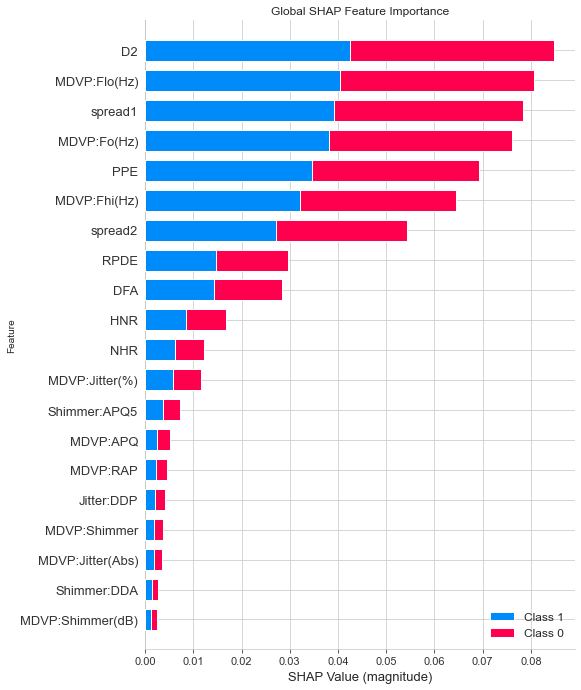

<Figure size 576x684 with 1 Axes>

In [ ]:

# Create a KernelExplainer object
explainer_km = shap.KernelExplainer(wrapped_model.predict_proba_binary, X_train_km)

# Calculate SHAP values for all features
shap_values_km = explainer_svm.shap_values(X_test_km)

# Plot the global SHAP summary plot
shap.summary_plot(shap_values_km, X_test_km, plot_type="bar", show=False)

# Set plot parameters
plt.title("Global SHAP Feature Importance")
plt.xlabel("SHAP Value (magnitude)")
plt.ylabel("Feature")

# Show the plot
plt.show()

Using 156 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.






<IPython.core.display.HTML object>

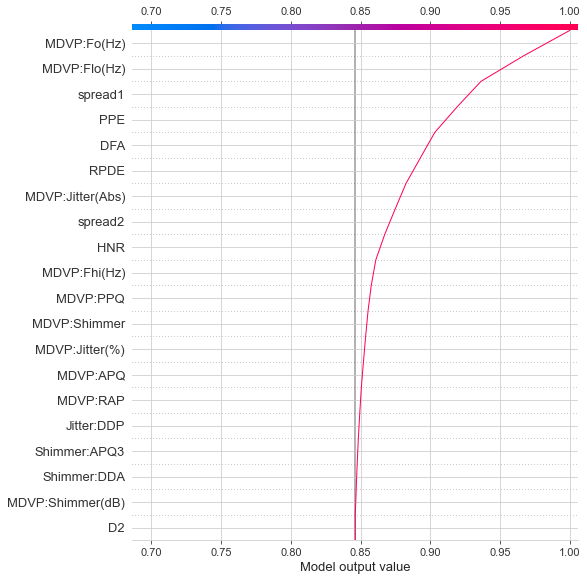

<Figure size 576x684 with 1 Axes>

<IPython.core.display.HTML object>

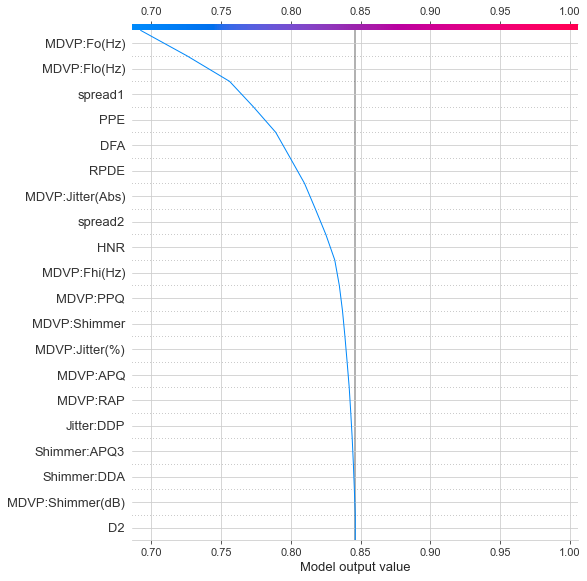

<Figure size 576x684 with 1 Axes>

In [ ]:
np.random.seed(36)
# Create explainer
explainer_km = shap.KernelExplainer(wrapped_model.predict_proba_binary, X_train_km)


# Select the instance for generating the explanation
i_km = 6
data_for_prediction_km = X_test_km.iloc[i_km, :]

# Generate SHAP values for the instance
shap_values_km = explainer_km.shap_values(data_for_prediction_km)

# Set the class index for negative prediction
class_index_km = 0  

# Access the expected value for the negative class
expected_value_negative_km = explainer_km.expected_value[class_index_km]

# Access the SHAP values 
shap_values_negative_km = shap_values_km[class_index_km]

# Initialize the JS visualization
shap.initjs()



# Positive Class
shap.decision_plot(expected_value_negative_km, shap_values_negative_km, feature_names=X_test_km.columns.tolist())


class_index_km = 1  
expected_value_positive_km = explainer_km.expected_value[class_index_km]
shap_values_positive_km = shap_values_km[class_index_km]
shap.initjs()

# Create the decision plot 
shap.decision_plot(expected_value_positive_km, shap_values_positive_km, feature_names=X_test_km.columns.tolist())

## ALE 

             eff  size
MDVP:Fo(Hz)           
-1.433314    0.0   0.0
-1.290304    0.0   2.0
-1.258499    0.0   1.0
-1.074723    0.0   1.0
-1.054206    0.0   1.0
-1.053431    0.0   1.0
-1.022547    0.0   1.0
-1.017097    0.0   1.0
-0.905455    0.0   1.0
-0.880700    0.0   1.0
-0.796527    0.0   1.0
-0.680282    0.0   1.0
-0.624401    0.0   1.0
-0.418073    0.0   1.0
-0.336394    0.0   1.0
-0.292164    0.0   1.0
-0.259076    0.0   1.0
-0.243210    0.0   1.0
-0.148694    0.0   1.0
-0.057084    0.0   1.0
-0.050956    0.0   1.0
-0.028647    0.0   1.0
 0.052717    0.0   1.0
 0.118384    0.0   1.0
 0.228355    0.0   1.0
 0.306642    0.0   1.0
 0.400335    0.0   1.0
 0.495578    0.0   1.0
 0.582707    0.0   1.0
 0.673130    0.0   1.0
 1.037873    0.0   1.0
 1.049815    0.0   1.0
 1.170322    0.0   1.0
 1.221674    0.0   1.0
 1.315052    0.0   1.0
 1.354341    0.0   1.0
 1.523294    0.0   1.0
 2.084894    0.0   1.0
 2.146686    0.0   1.0
              eff  size
MDVP:Fhi(Hz)           
-0.954297

PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Con

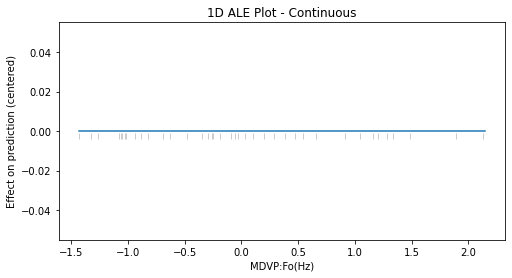

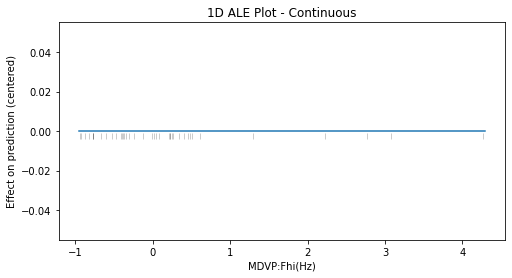

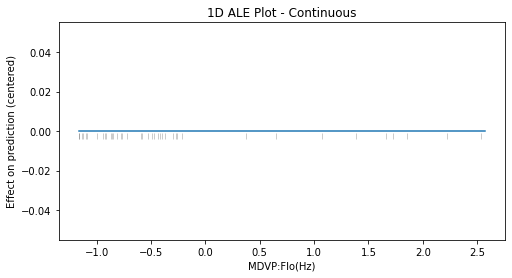

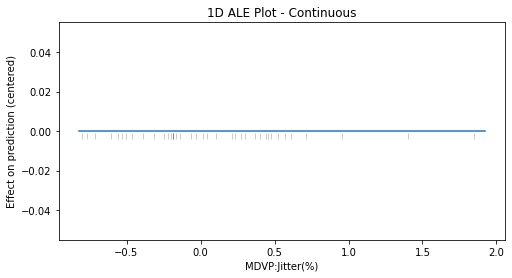

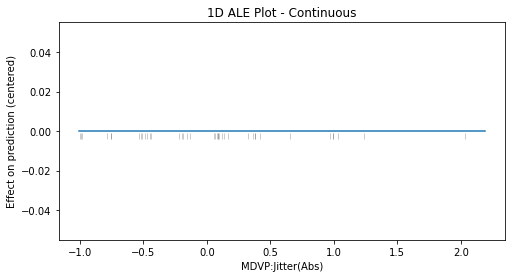

...

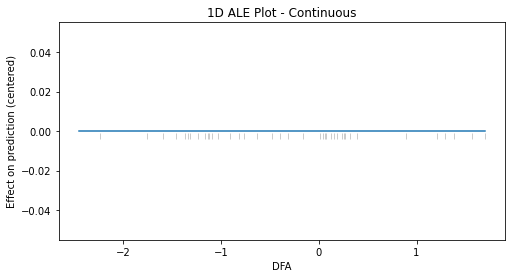

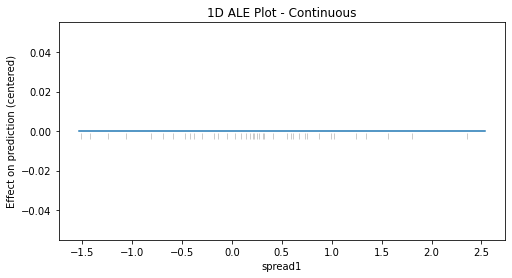

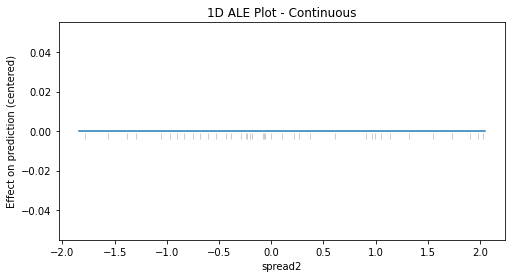

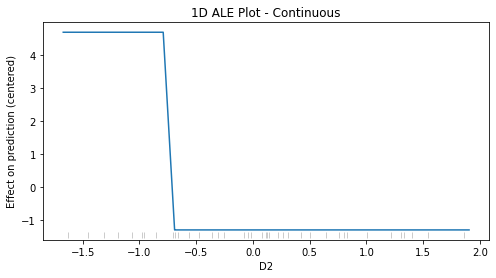

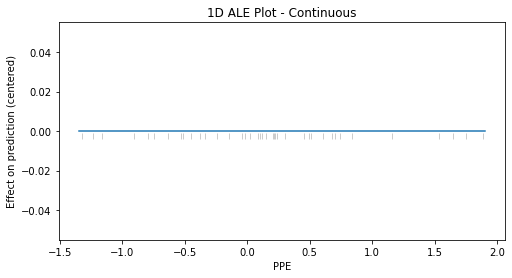

In [20]:
# Convert NumPy array to DataFrame
X_test_km = pd.DataFrame(X_test_km)

for feature in X_test_km.columns:
    ale_eff_km = ale(X=X_test_km, model=clf_km, feature=[feature], grid_size=50, include_CI=False)
    print(ale_eff_km)
 

## PDP 

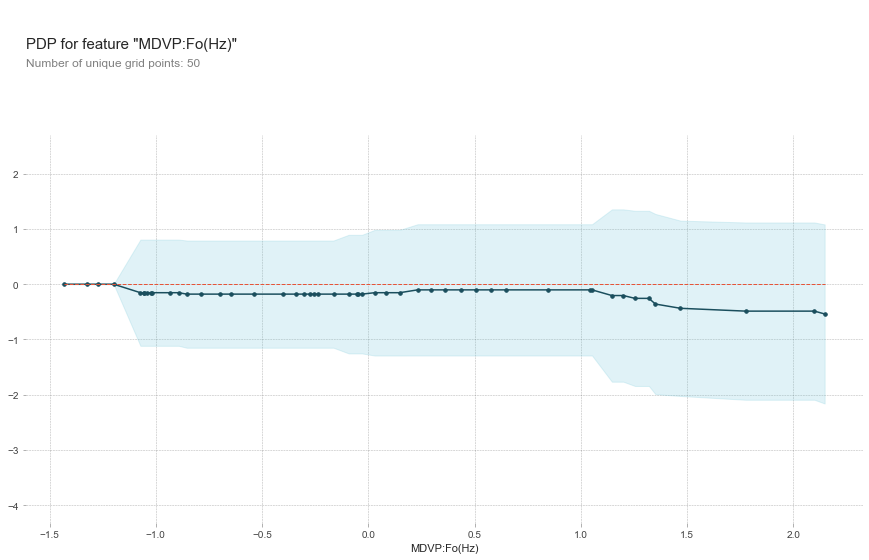

<Figure size 1080x684 with 2 Axes>

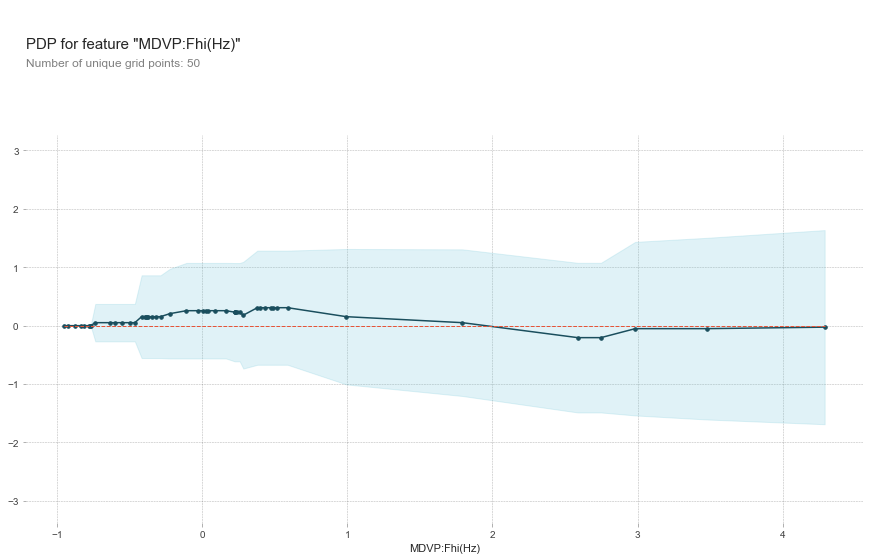

<Figure size 1080x684 with 2 Axes>

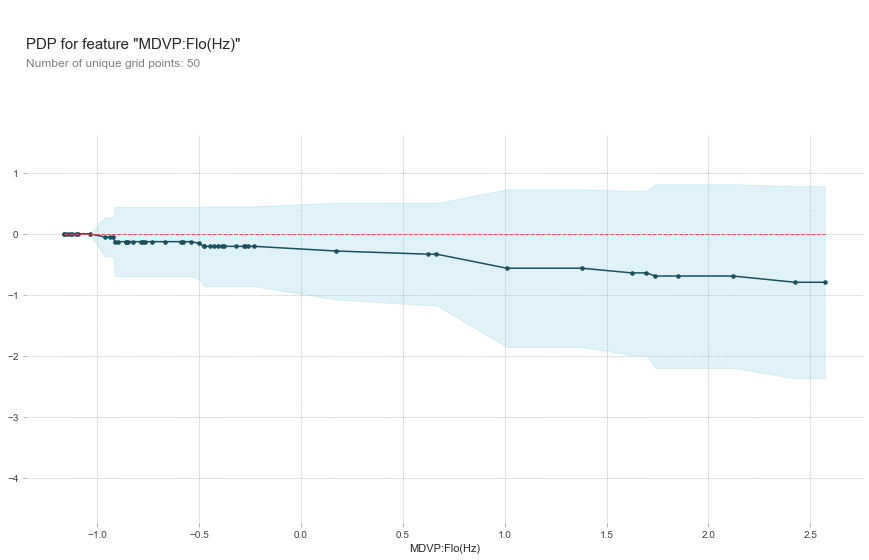

<Figure size 1080x684 with 2 Axes>

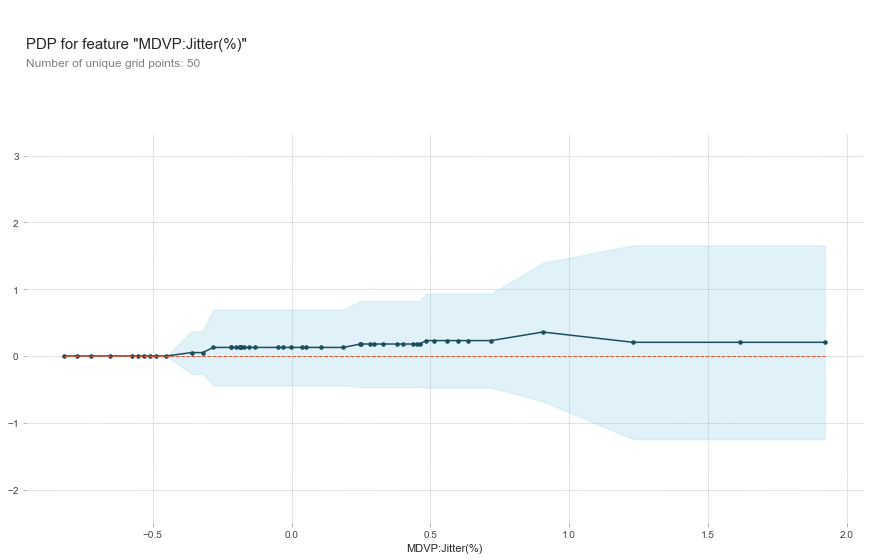

<Figure size 1080x684 with 2 Axes>

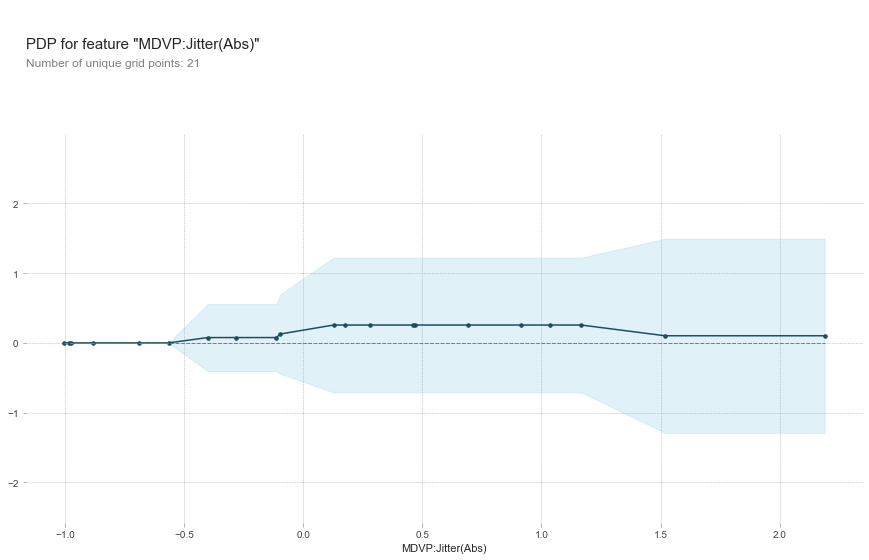

<Figure size 1080x684 with 2 Axes>

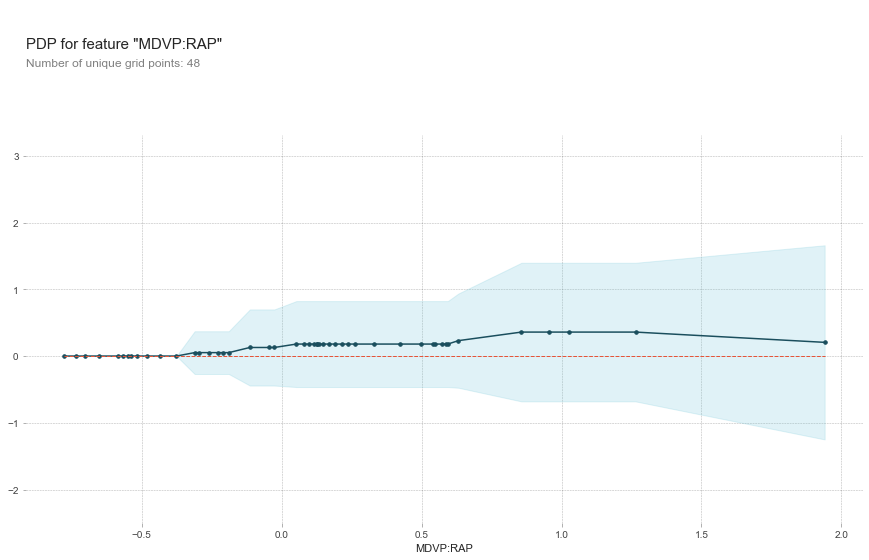

<Figure size 1080x684 with 2 Axes>

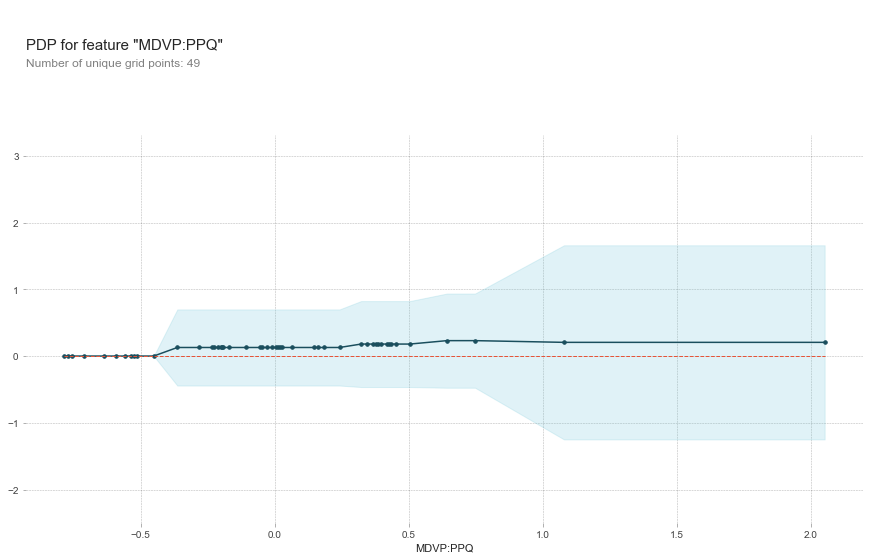

<Figure size 1080x684 with 2 Axes>

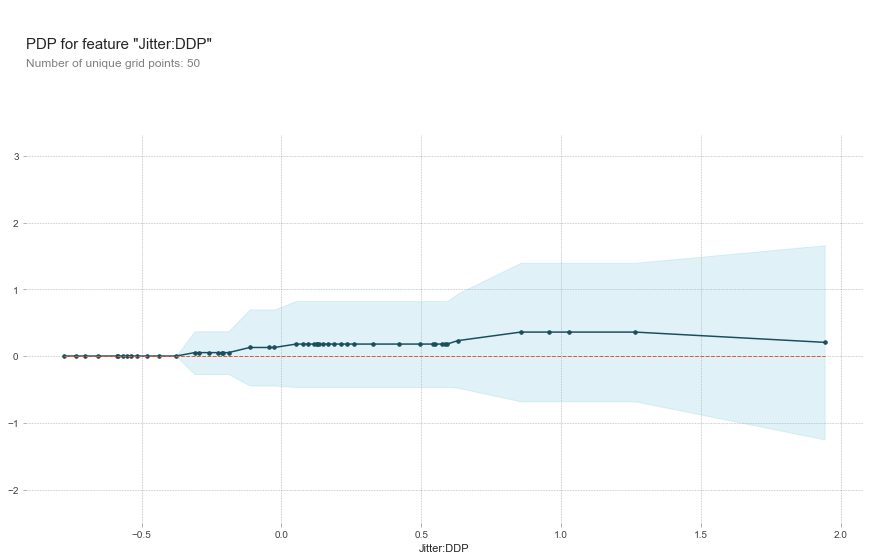

<Figure size 1080x684 with 2 Axes>

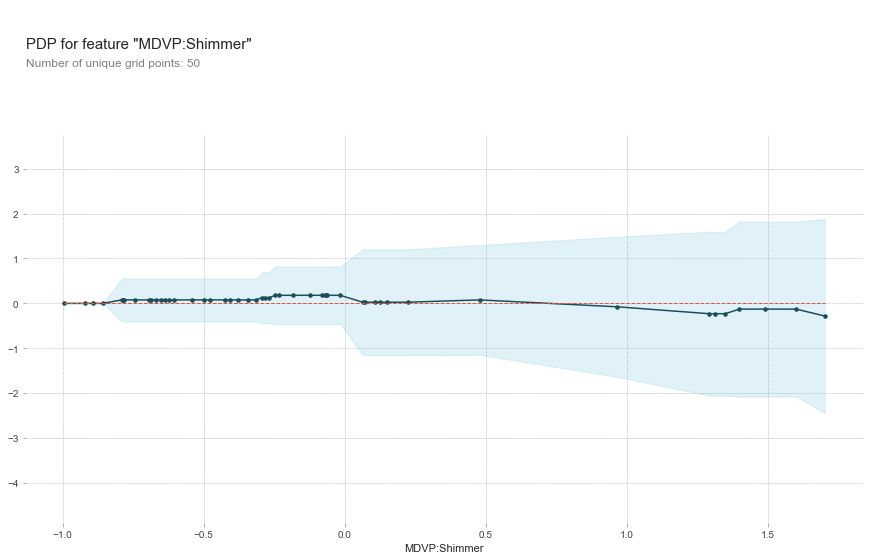

<Figure size 1080x684 with 2 Axes>

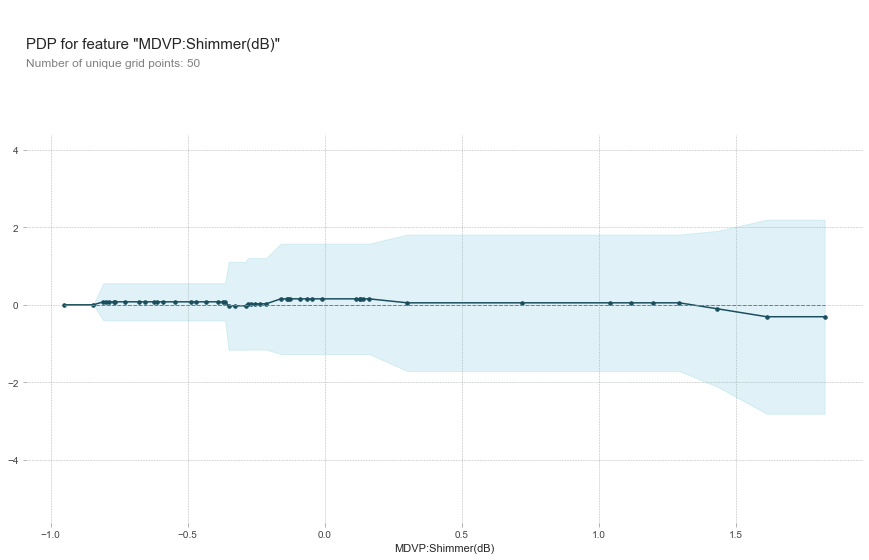

<Figure size 1080x684 with 2 Axes>

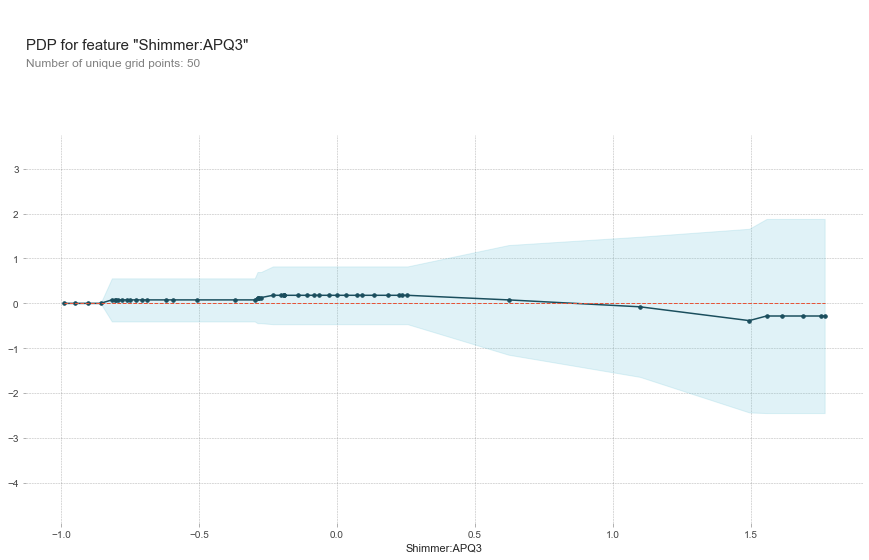

<Figure size 1080x684 with 2 Axes>

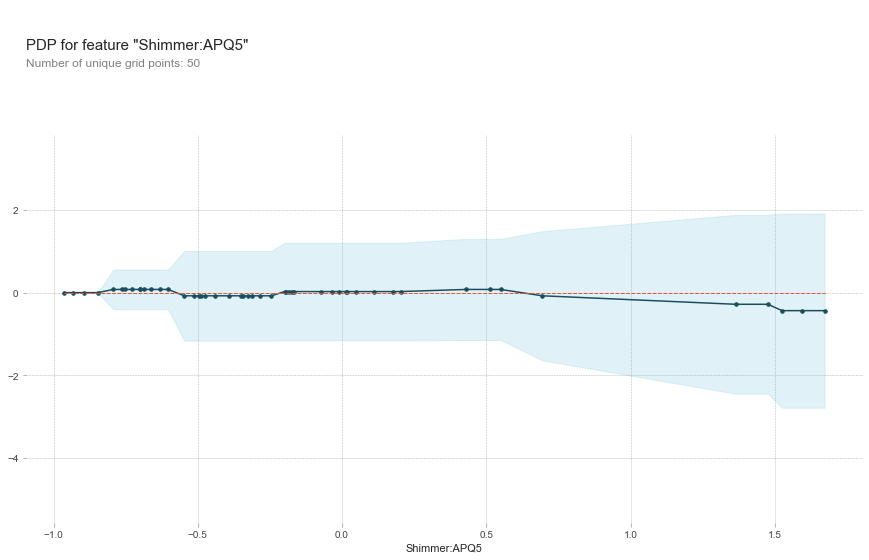

<Figure size 1080x684 with 2 Axes>

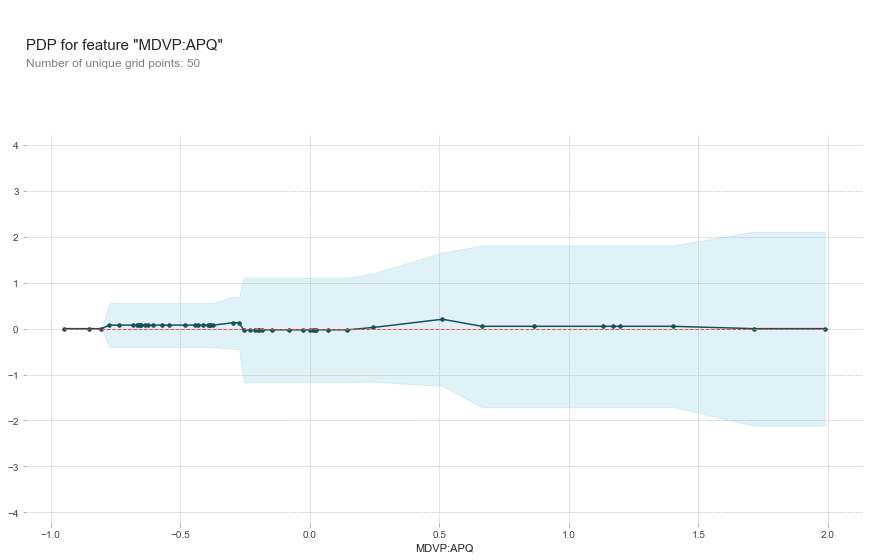

<Figure size 1080x684 with 2 Axes>

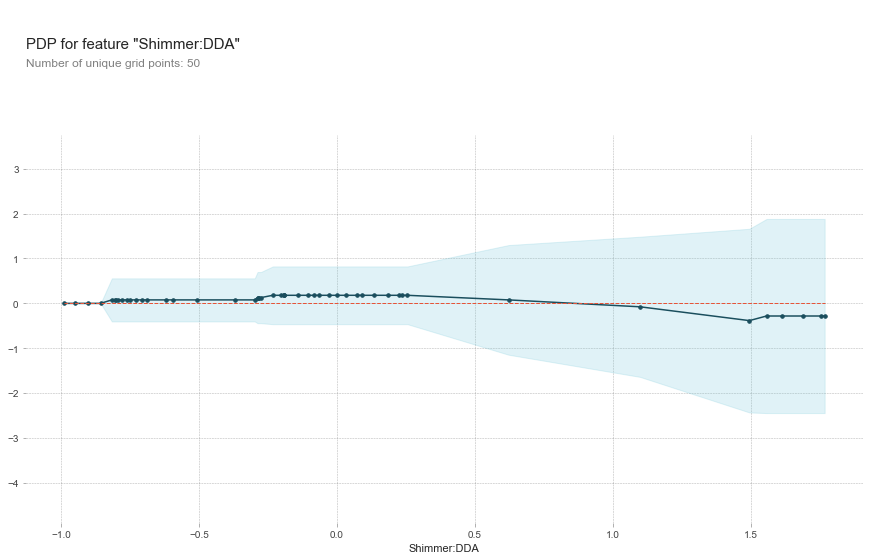

<Figure size 1080x684 with 2 Axes>

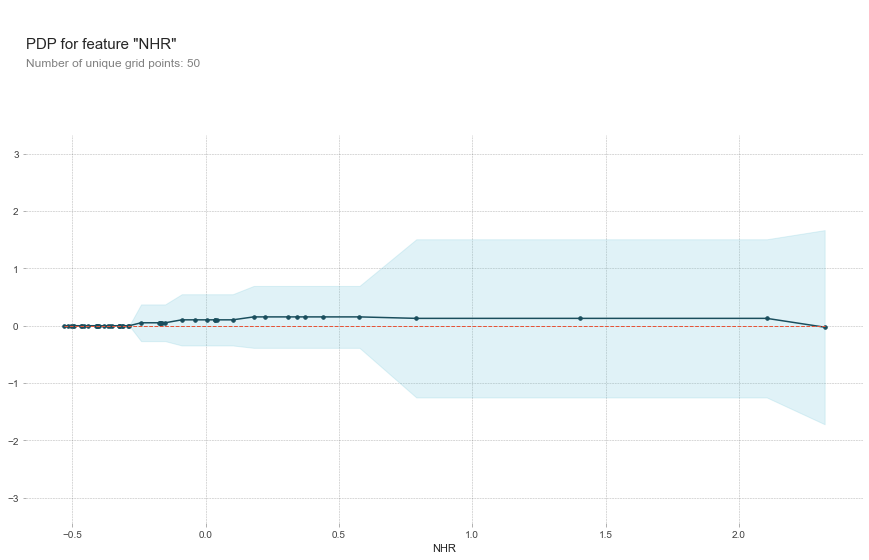

<Figure size 1080x684 with 2 Axes>

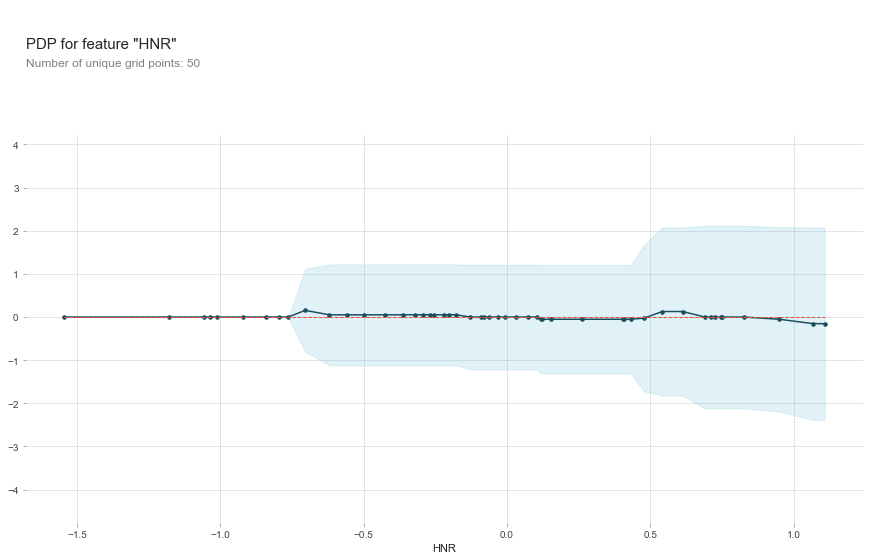

<Figure size 1080x684 with 2 Axes>

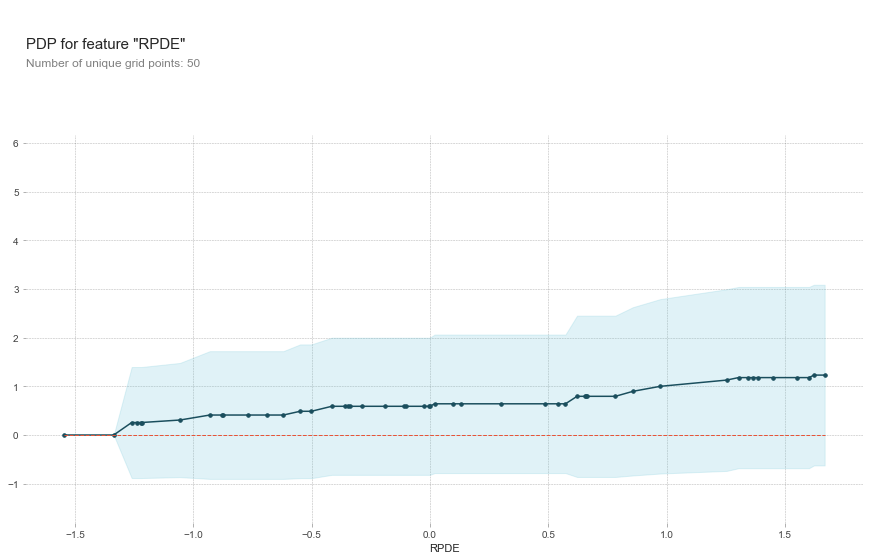

<Figure size 1080x684 with 2 Axes>

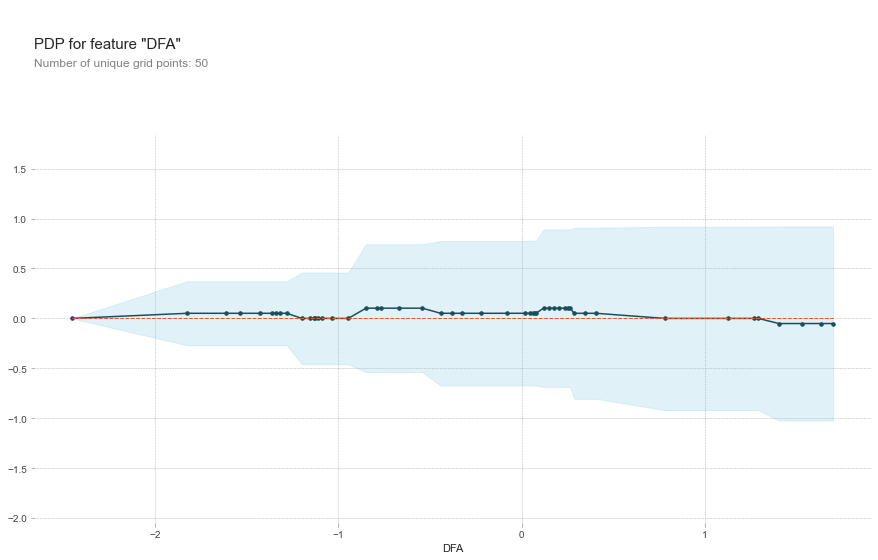

<Figure size 1080x684 with 2 Axes>

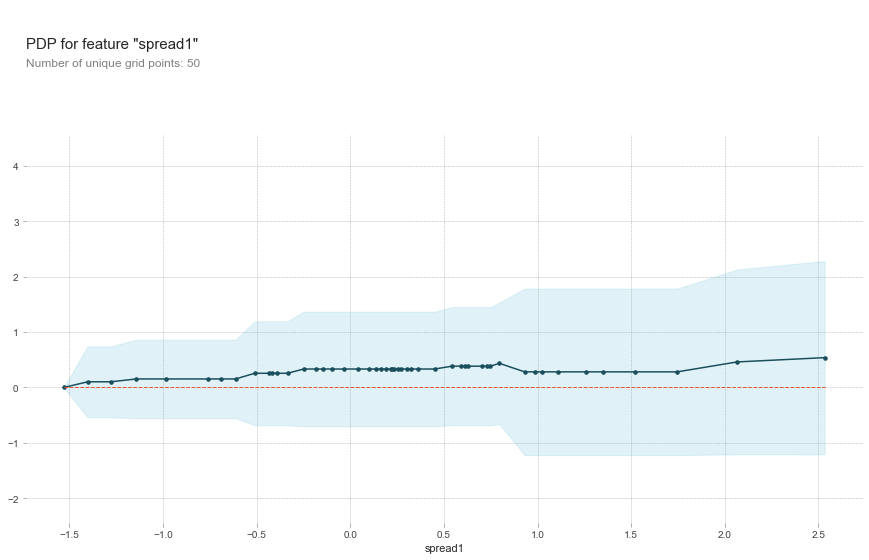

<Figure size 1080x684 with 2 Axes>

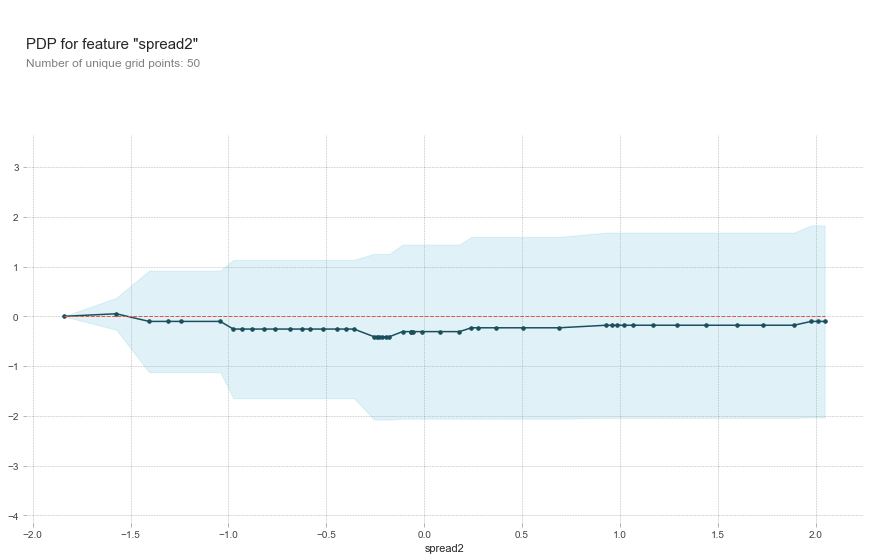

<Figure size 1080x684 with 2 Axes>

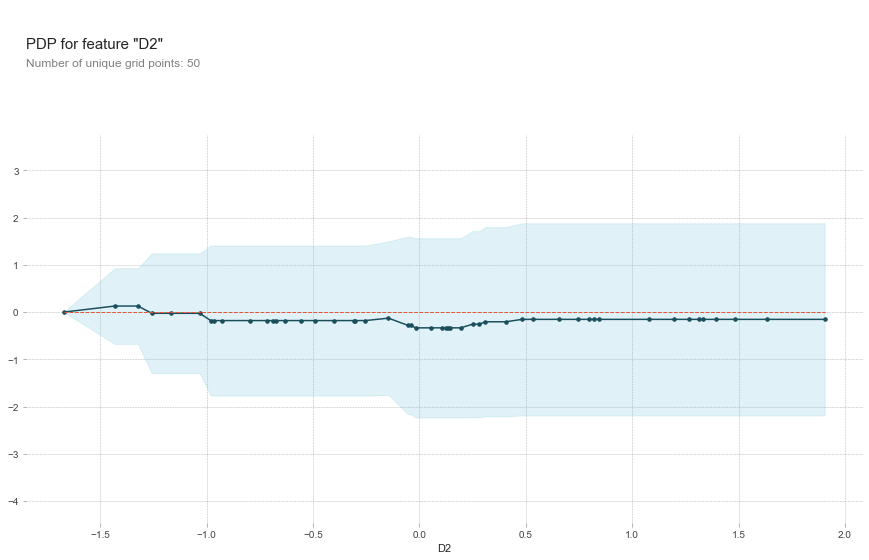

<Figure size 1080x684 with 2 Axes>

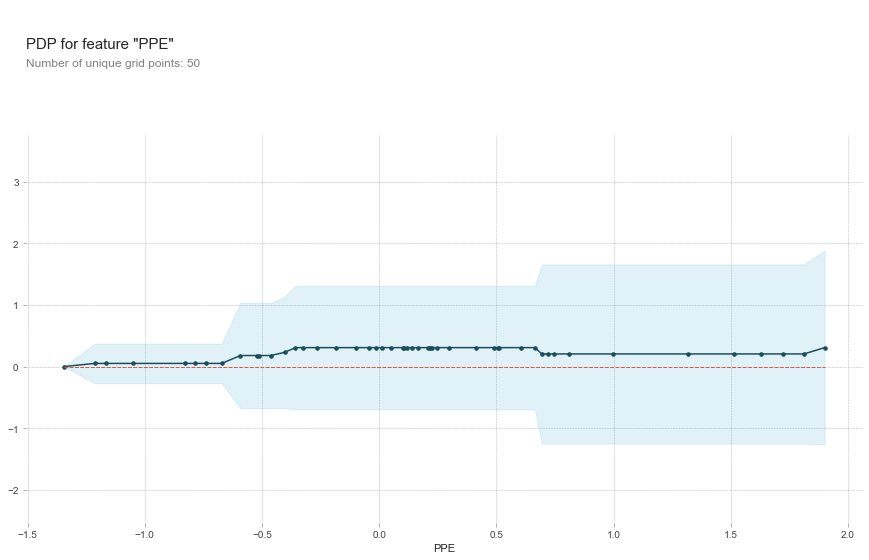

<Figure size 1080x684 with 2 Axes>

In [ ]:
# Iterate over each feature and plot the pdp curve
for feature_name in X_test_km.columns:
    # Calculate pdp data
    pdp_data_km_all = pdp.pdp_isolate(model=clf_km, dataset=X_test_km, model_features=X_test_km.columns, feature=feature_name,num_grid_points = 50)

    # Plot pdp curve
    pdp.pdp_plot(pdp_data_km_all, feature_name)
    plt.show()